<a href="https://colab.research.google.com/github/RohanSubramani/Miscellaneous/blob/main/Lottery_Ticket_Hypothesis_Reimplementation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The Lottery Ticket Hypothesis:
Dense, randomly-initialized, feed-forward
networks contain subnetworks (winning tickets) that—when trained in isolation—
reach test accuracy comparable to the original network in a similar number of
iterations.

## Setting
MLPs trained on MNIST.

## Notes
I'll start with one-shot pruning, but the paper says iterative pruning finds better small subnetworks.

# Results

## Early tests

Epoch 10/10 - Val: 100%|██████████| 188/188 [00:04<00:00, 40.11batch/s, Val Loss=0.0898]


Initial Accuracy: 97.52%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%


Epoch 10/10 - Val: 100%|██████████| 188/188 [00:04<00:00, 40.12batch/s, Val Loss=0.0979]


Retrained Accuracy: 97.52%
Total weights: 266610
Zero weights: 186340
Percentage of pruned weights: 69.89%


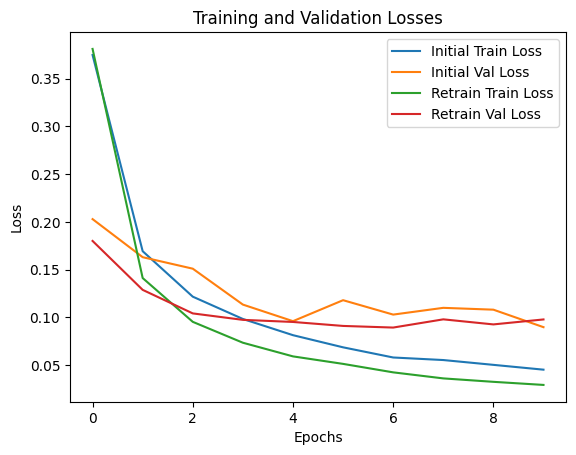

In [ ]:
# model = MLP().to(device)
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.parameters(),lr=0.001)
# initial_state = copy.deepcopy(model.state_dict())

# trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=10)
# initial_accuracy = evaluate(trained_model, val_loader)
# print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
# verify_pruned_model(trained_model)

# masks = prune_by_percentage(trained_model, 70) # Threshold above which we keep?

# # I should change something here so I still have access to the full trained model

# retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=10)
# retrained_accuracy = evaluate(retrained_model, val_loader)
# print(f'Retrained Accuracy: {retrained_accuracy * 100:.2f}%')
# verify_pruned_model(retrained_model)

# # Plot the training and validation losses
# plt.plot(initial_train_losses, label='Initial Train Loss')
# plt.plot(initial_val_losses, label='Initial Val Loss')
# plt.plot(retrain_train_losses, label='Retrain Train Loss')
# plt.plot(retrain_val_losses, label='Retrain Val Loss')
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.title('Training and Validation Losses')
# plt.legend()
# plt.show()

Initial Accuracy: 96.94%


Epoch 10/10 - Val: 100%|██████████| 188/188 [00:03<00:00, 54.33batch/s, Val Loss=0.1038]


Retrained Accuracy: 97.28%


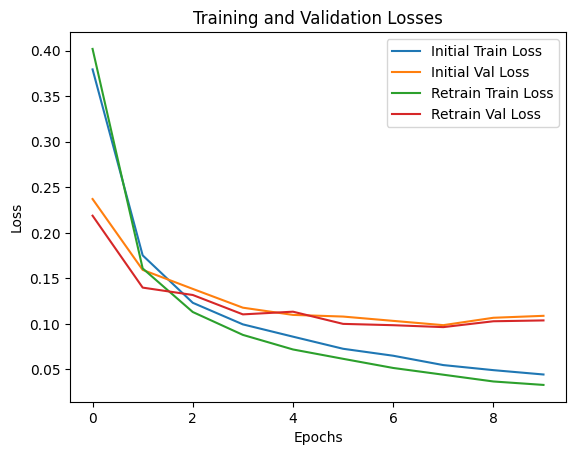

## Many runs without and with reinitialization
Accuracies only seem to start dropping at 95-98%. Seem to drop earlier for reinitialized lottery tickets?

Epoch 15/15 - Val: 100%|██████████| 188/188 [00:03<00:00, 51.08batch/s, Val Loss=0.1111]


Initial Accuracy: 97.17%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%
Pruning 70% of the weights
Initial state loaded


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:03<00:00, 50.48batch/s, Val Loss=0.1133]


Retrained Accuracy after 70% pruning: 97.28%
Total weights: 266610
Zero weights: 186340
Percentage of pruned weights: 69.89%
All accuracies so far: [0.97175, 0.97275]%
Pruning 80% of the weights
Initial state loaded


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:03<00:00, 47.29batch/s, Val Loss=0.1214]


Retrained Accuracy after 80% pruning: 97.01%
Total weights: 266610
Zero weights: 212960
Percentage of pruned weights: 79.88%
All accuracies so far: [0.97175, 0.97275, 0.9700833333333333]%
Pruning 90% of the weights
Initial state loaded


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:04<00:00, 41.28batch/s, Val Loss=0.1095]


Retrained Accuracy after 90% pruning: 97.28%
Total weights: 266610
Zero weights: 239580
Percentage of pruned weights: 89.86%
All accuracies so far: [0.97175, 0.97275, 0.9700833333333333, 0.97275]%
Pruning 95% of the weights
Initial state loaded


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:03<00:00, 50.32batch/s, Val Loss=0.1165]


Retrained Accuracy after 95% pruning: 96.78%
Total weights: 266610
Zero weights: 252890
Percentage of pruned weights: 94.85%
All accuracies so far: [0.97175, 0.97275, 0.9700833333333333, 0.97275, 0.96775]%
Pruning 98% of the weights
Initial state loaded


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:03<00:00, 49.09batch/s, Val Loss=0.2955]


Retrained Accuracy after 98% pruning: 85.94%
Total weights: 266610
Zero weights: 260876
Percentage of pruned weights: 97.85%
All accuracies so far: [0.97175, 0.97275, 0.9700833333333333, 0.97275, 0.96775, 0.8594166666666667]%


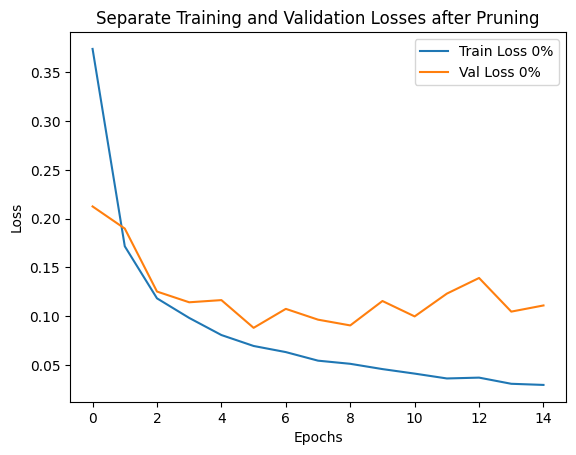

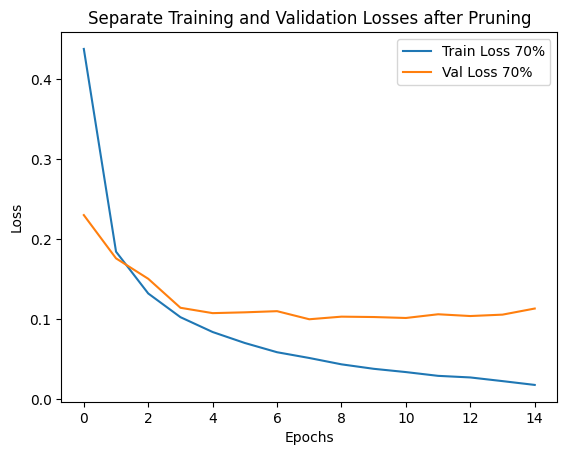

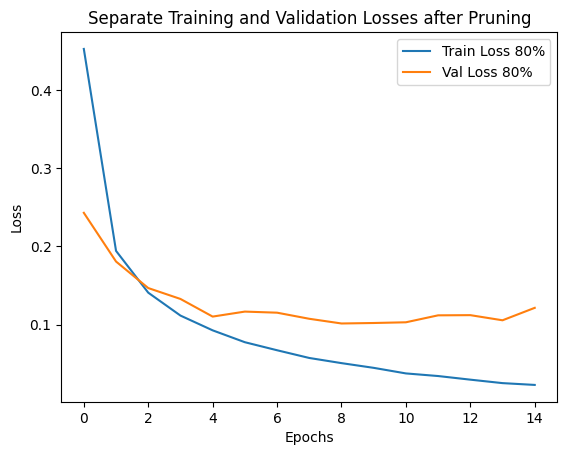

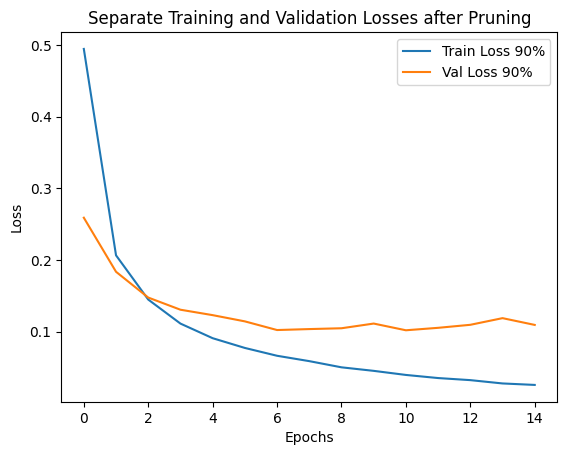

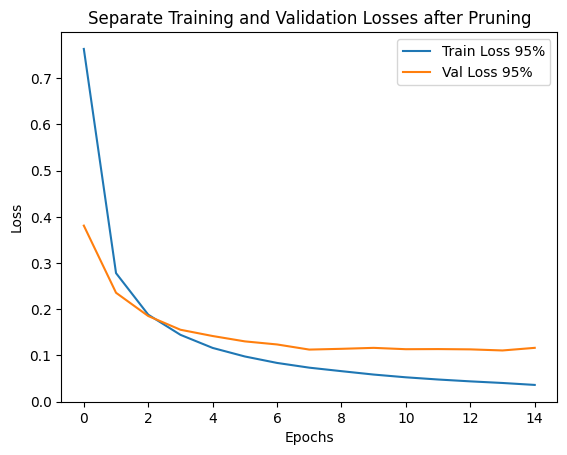

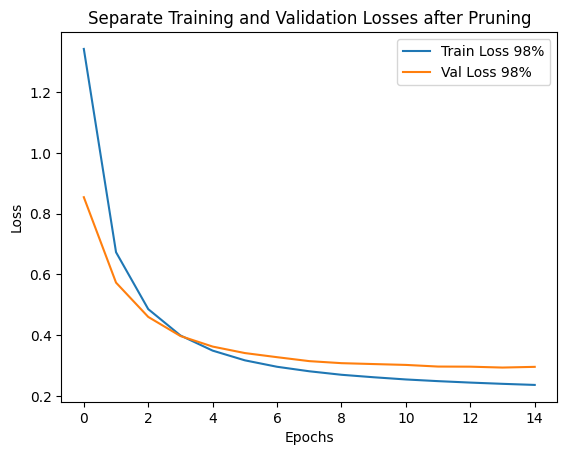

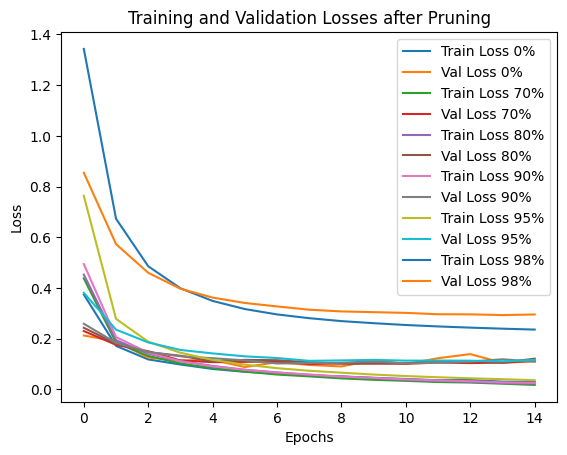

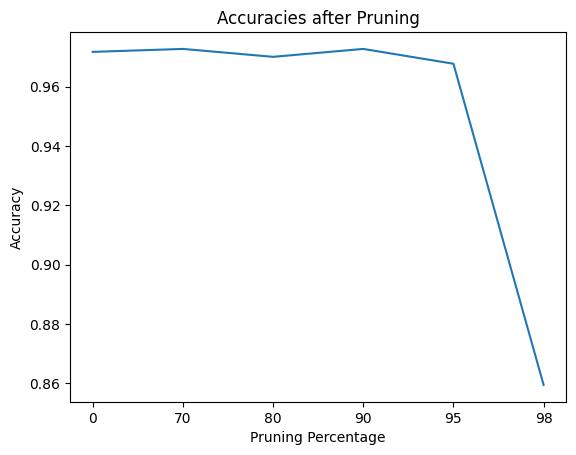

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
pruning_percentages = [0, 70, 80, 90, 95, 98] # 0 is there for the plot, it isn't used in for loop
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    print(f"Pruning {percent}% of the weights")

    # Prune the current model
    masks = prune_by_percentage(current_model, percent)

    # Initialize a new model and retrain with masks
    new_model = MLP().to(device)
    optimizer = optim.Adam(new_model.parameters(), lr=0.001)
    # compare_models(new_model,current_model, masks, initial_state)
    retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15)

    # Evaluate the retrained model
    retrained_accuracy = evaluate(retrained_model, val_loader)
    print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
    verify_pruned_model(retrained_model)

    # Save results
    all_train_losses.append(retrain_train_losses)
    all_val_losses.append(retrain_val_losses)
    all_accuracies.append(retrained_accuracy)
    print(f"All accuracies so far: {all_accuracies}")

    # Prepare for the next iteration
    current_model = retrained_model

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

Epoch 15/15 - Val: 100%|██████████| 188/188 [00:03<00:00, 53.61batch/s, Val Loss=0.1155]


Initial Accuracy: 97.22%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%
Pruning 70% of the weights
Model reinitialized


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:04<00:00, 43.45batch/s, Val Loss=0.1278]


Retrained Accuracy after 70% pruning: 97.08%
Total weights: 266610
Zero weights: 186340
Percentage of pruned weights: 69.89%
All accuracies so far: [0.97225, 0.97075]%
Pruning 80% of the weights
Model reinitialized


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:03<00:00, 48.03batch/s, Val Loss=0.1114]


Retrained Accuracy after 80% pruning: 97.26%
Total weights: 266610
Zero weights: 212960
Percentage of pruned weights: 79.88%
All accuracies so far: [0.97225, 0.97075, 0.9725833333333334]%
Pruning 90% of the weights
Model reinitialized


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:04<00:00, 40.06batch/s, Val Loss=0.1105]


Retrained Accuracy after 90% pruning: 97.06%
Total weights: 266610
Zero weights: 239580
Percentage of pruned weights: 89.86%
All accuracies so far: [0.97225, 0.97075, 0.9725833333333334, 0.9705833333333334]%
Pruning 95% of the weights
Model reinitialized


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:03<00:00, 47.01batch/s, Val Loss=0.1243]


Retrained Accuracy after 95% pruning: 96.33%
Total weights: 266610
Zero weights: 252890
Percentage of pruned weights: 94.85%
All accuracies so far: [0.97225, 0.97075, 0.9725833333333334, 0.9705833333333334, 0.96325]%
Pruning 98% of the weights
Model reinitialized


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:03<00:00, 47.85batch/s, Val Loss=0.2113]


Retrained Accuracy after 98% pruning: 94.17%
Total weights: 266610
Zero weights: 260876
Percentage of pruned weights: 97.85%
All accuracies so far: [0.97225, 0.97075, 0.9725833333333334, 0.9705833333333334, 0.96325, 0.94175]%


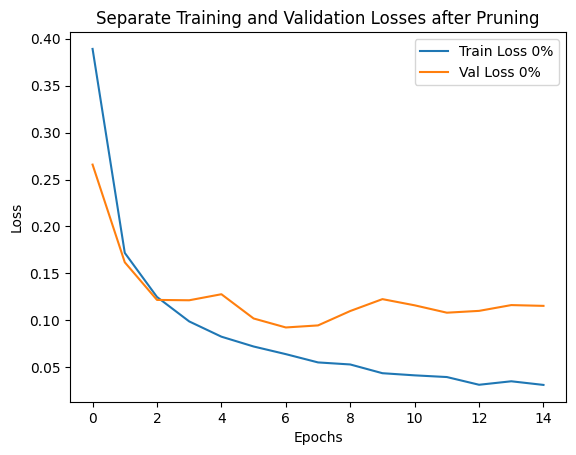

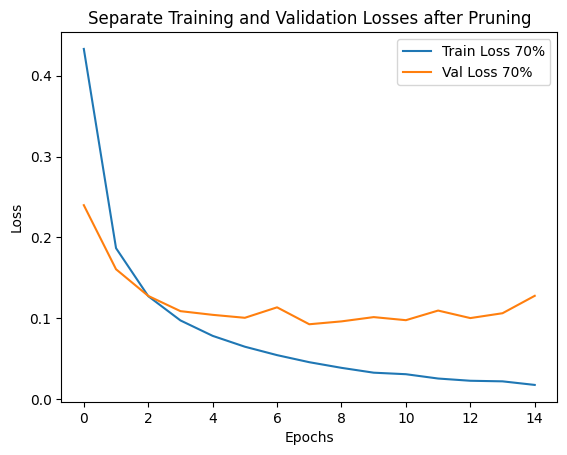

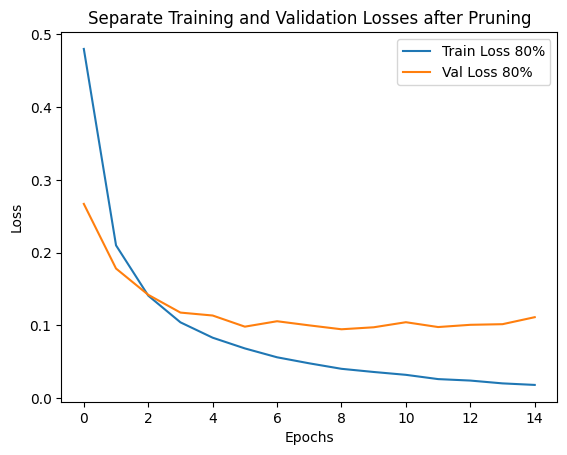

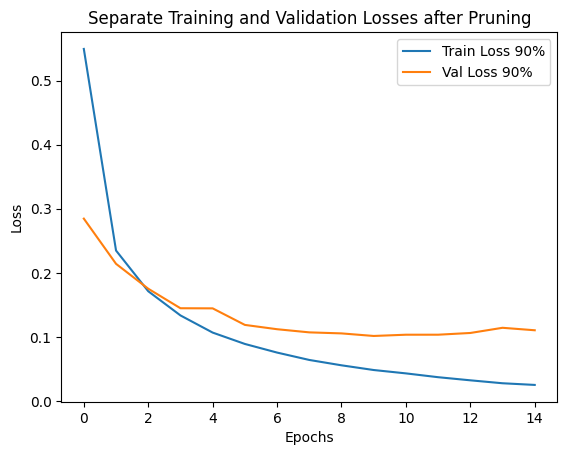

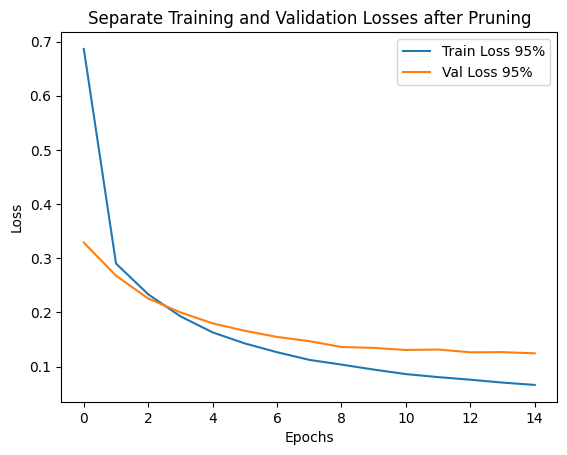

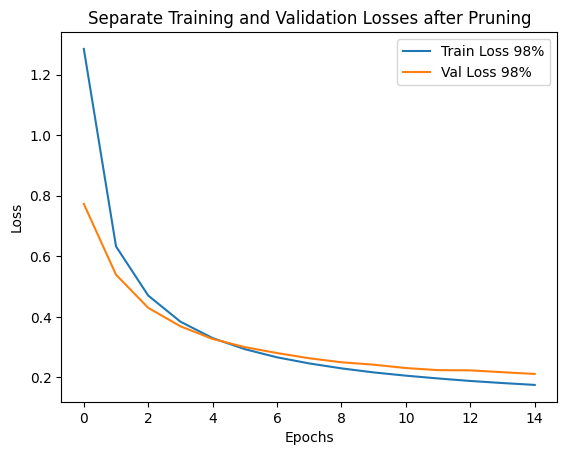

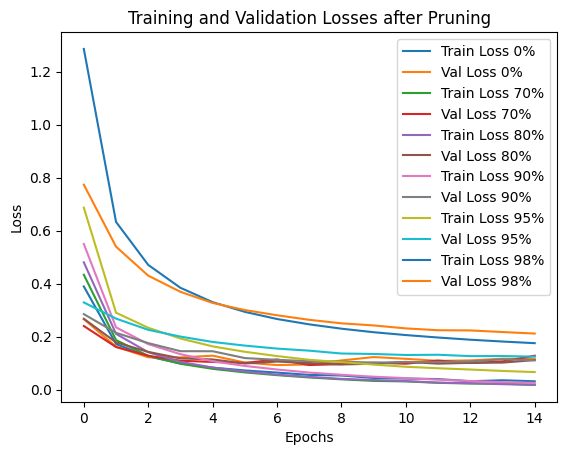

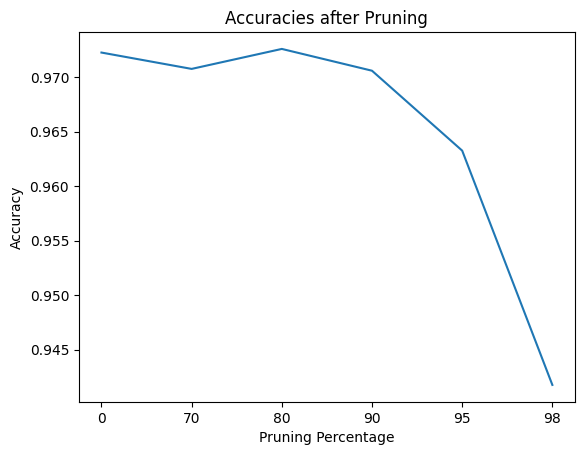

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
pruning_percentages = [0, 70, 80, 90, 95, 98] # 0 is there for the plot, it isn't used in for loop
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    print(f"Pruning {percent}% of the weights")

    # Prune the current model
    masks = prune_by_percentage(current_model, percent)

    # Initialize a new model and retrain with masks
    new_model = MLP().to(device)
    optimizer = optim.Adam(new_model.parameters(), lr=0.001)
    # compare_models(new_model,current_model, masks, initial_state)
    retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15, rerandomize_initialization=True)

    # Evaluate the retrained model
    retrained_accuracy = evaluate(retrained_model, val_loader)
    print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
    verify_pruned_model(retrained_model)

    # Save results
    all_train_losses.append(retrain_train_losses)
    all_val_losses.append(retrain_val_losses)
    all_accuracies.append(retrained_accuracy)
    print(f"All accuracies so far: {all_accuracies}")

    # Prepare for the next iteration
    current_model = retrained_model

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

## More runs without and with reinitialization, now with higher pruning percentages
Drop only really starts between 98 and 99%. Same init seems to drop faster than reinit? That suggests there's nothing special about the initialization, those are just good parameters? Could try picking random parameters to compare against.


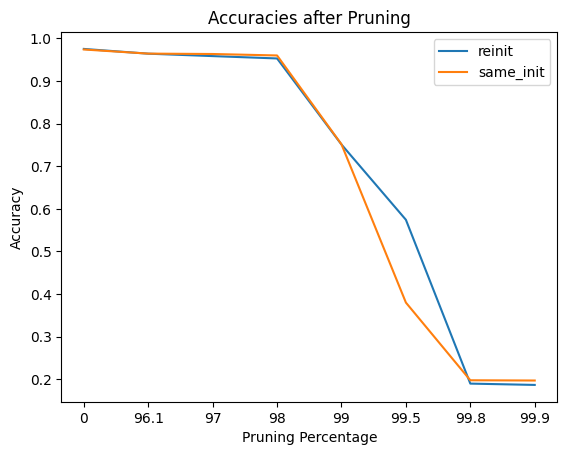

In [ ]:
reinitialized_accuracies = [0.975, 0.9638333333333333, 0.9581666666666667, 0.9526666666666667, 0.7508333333333334, 0.5743333333333334, 0.19016666666666668, 0.18708333333333332]
same_init_accuracies = [0.9736666666666667, 0.964, 0.9630833333333333, 0.9596666666666667, 0.7513333333333333, 0.38016666666666665, 0.198, 0.19741666666666666]

pruning_percentages = [0,96.1,97,98,99,99.5,99.8,99.9]

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,reinitialized_accuracies, label="reinit")
plt.plot(pruning_percentages_as_strs,same_init_accuracies, label="same_init")
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.legend()
plt.show()

Epoch 15/15 - Val: 100%|██████████| 188/188 [00:05<00:00, 37.59batch/s, Val Loss=0.1125]


Initial Accuracy: 97.37%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%
Pruning 96.1% of the weights
Initial state loaded


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:04<00:00, 43.21batch/s, Val Loss=0.1239]


Retrained Accuracy after 96.1% pruning: 96.40%
Total weights: 266610
Zero weights: 255818
Percentage of pruned weights: 95.95%
All accuracies so far: [0.9736666666666667, 0.964]
Pruning 97% of the weights
Initial state loaded


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:04<00:00, 42.08batch/s, Val Loss=0.1261]


Retrained Accuracy after 97% pruning: 96.31%
Total weights: 266610
Zero weights: 258214
Percentage of pruned weights: 96.85%
All accuracies so far: [0.9736666666666667, 0.964, 0.9630833333333333]
Pruning 98% of the weights
Initial state loaded


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:04<00:00, 38.34batch/s, Val Loss=0.1395]


Retrained Accuracy after 98% pruning: 95.97%
Total weights: 266610
Zero weights: 260876
Percentage of pruned weights: 97.85%
All accuracies so far: [0.9736666666666667, 0.964, 0.9630833333333333, 0.9596666666666667]
Pruning 99% of the weights
Initial state loaded


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:04<00:00, 41.11batch/s, Val Loss=0.5845]


Retrained Accuracy after 99% pruning: 75.13%
Total weights: 266610
Zero weights: 263538
Percentage of pruned weights: 98.85%
All accuracies so far: [0.9736666666666667, 0.964, 0.9630833333333333, 0.9596666666666667, 0.7513333333333333]
Pruning 99.5% of the weights
Initial state loaded


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:05<00:00, 36.63batch/s, Val Loss=1.5507]


Retrained Accuracy after 99.5% pruning: 38.02%
Total weights: 266610
Zero weights: 264869
Percentage of pruned weights: 99.35%
All accuracies so far: [0.9736666666666667, 0.964, 0.9630833333333333, 0.9596666666666667, 0.7513333333333333, 0.38016666666666665]
Pruning 99.8% of the weights
Initial state loaded


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:05<00:00, 36.54batch/s, Val Loss=2.0582]


Retrained Accuracy after 99.8% pruning: 19.80%
Total weights: 266610
Zero weights: 265667
Percentage of pruned weights: 99.65%
All accuracies so far: [0.9736666666666667, 0.964, 0.9630833333333333, 0.9596666666666667, 0.7513333333333333, 0.38016666666666665, 0.198]
Pruning 99.9% of the weights
Initial state loaded


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:05<00:00, 36.40batch/s, Val Loss=2.0611]


Retrained Accuracy after 99.9% pruning: 19.74%
Total weights: 266610
Zero weights: 265933
Percentage of pruned weights: 99.75%
All accuracies so far: [0.9736666666666667, 0.964, 0.9630833333333333, 0.9596666666666667, 0.7513333333333333, 0.38016666666666665, 0.198, 0.19741666666666666]


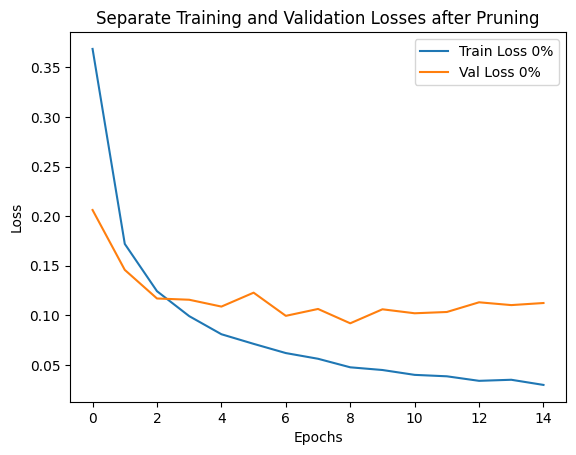

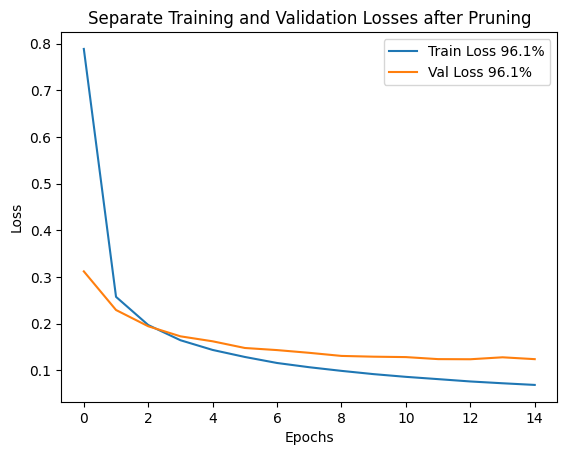

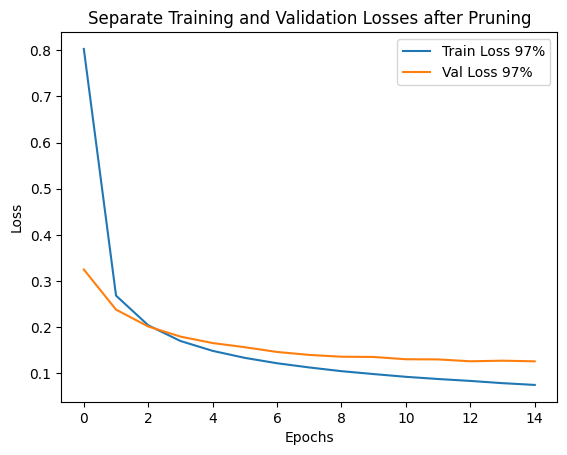

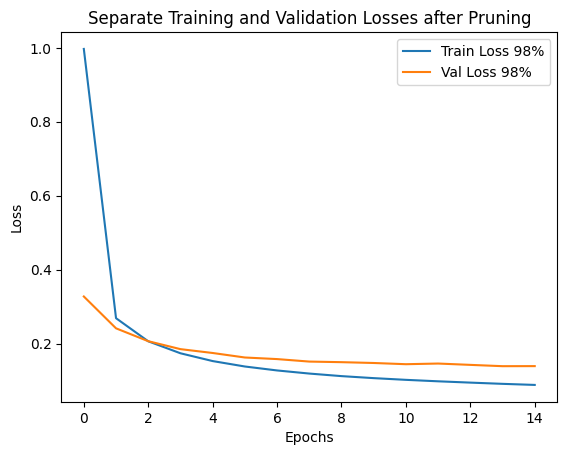

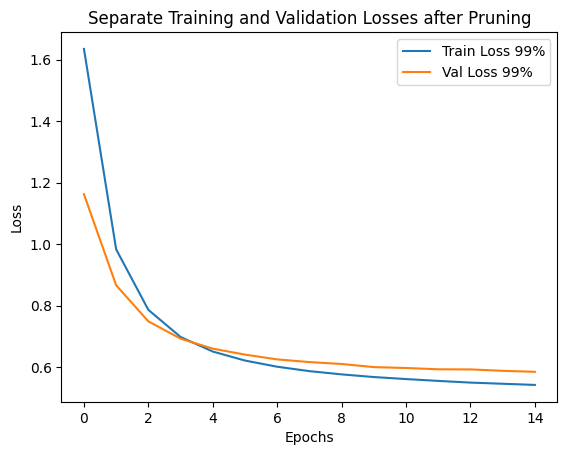

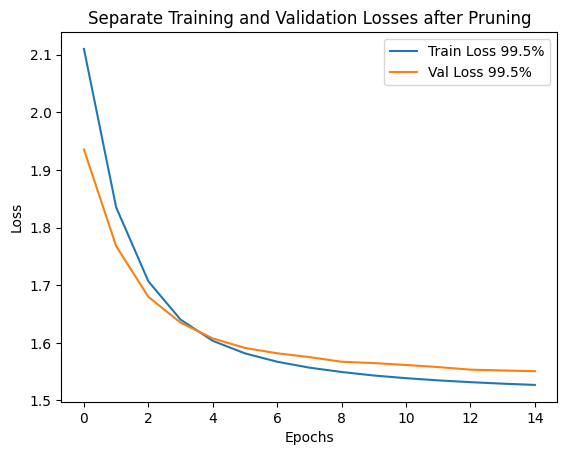

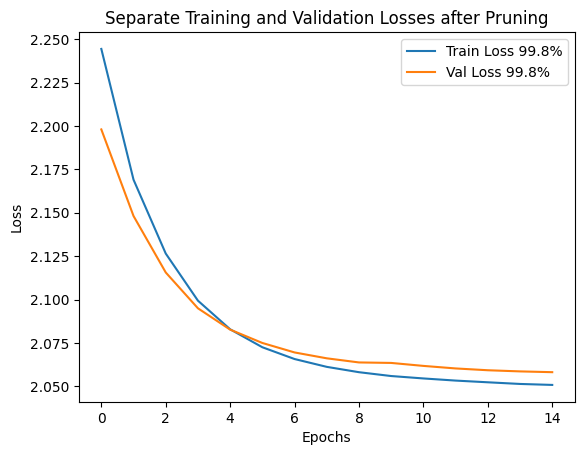

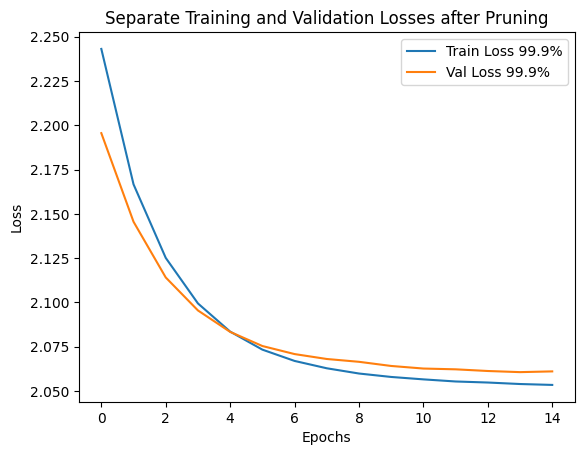

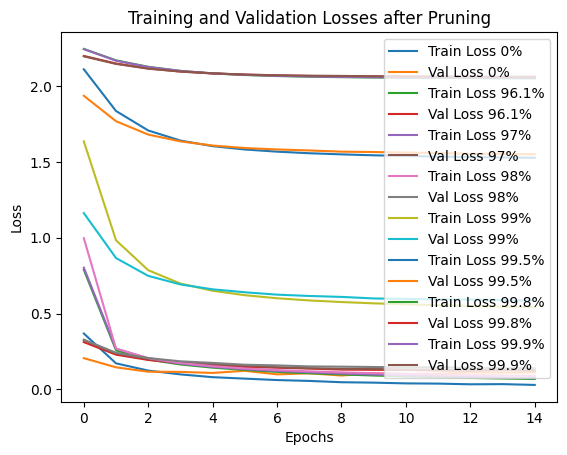

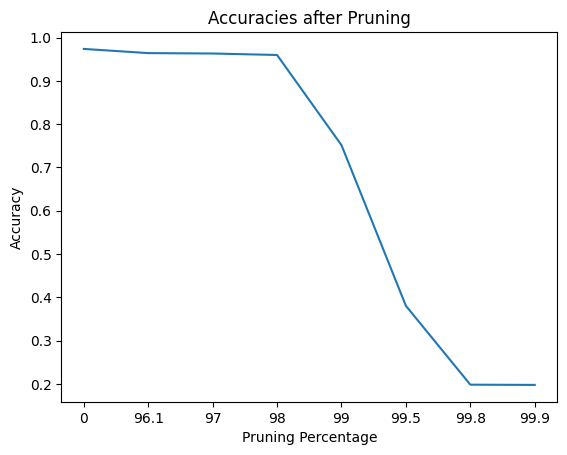

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
pruning_percentages = [0,96.1,97,98,99,99.5,99.8,99.9] # 0 is there for the plot, it isn't used in for loop
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    print(f"Pruning {percent}% of the weights")

    # Prune the current model
    masks = prune_by_percentage(current_model, percent)

    # Initialize a new model and retrain with masks
    new_model = MLP().to(device)
    optimizer = optim.Adam(new_model.parameters(), lr=0.001)
    # compare_models(new_model,current_model, masks, initial_state)
    retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15)

    # Evaluate the retrained model
    retrained_accuracy = evaluate(retrained_model, val_loader)
    print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
    verify_pruned_model(retrained_model)

    # Save results
    all_train_losses.append(retrain_train_losses)
    all_val_losses.append(retrain_val_losses)
    all_accuracies.append(retrained_accuracy)
    print(f"All accuracies so far: {all_accuracies}")

    # Prepare for the next iteration
    current_model = retrained_model

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

Epoch 15/15 - Val: 100%|██████████| 188/188 [00:05<00:00, 37.09batch/s, Val Loss=0.1057]


Initial Accuracy: 97.50%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%
Pruning 96.1% of the weights
Model reinitialized


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:04<00:00, 44.23batch/s, Val Loss=0.1248]


Retrained Accuracy after 96.1% pruning: 96.38%
Total weights: 266610
Zero weights: 255818
Percentage of pruned weights: 95.95%
All accuracies so far: [0.975, 0.9638333333333333]
Pruning 97% of the weights
Model reinitialized


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:05<00:00, 34.99batch/s, Val Loss=0.1595]


Retrained Accuracy after 97% pruning: 95.82%
Total weights: 266610
Zero weights: 258214
Percentage of pruned weights: 96.85%
All accuracies so far: [0.975, 0.9638333333333333, 0.9581666666666667]
Pruning 98% of the weights
Model reinitialized


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:05<00:00, 36.73batch/s, Val Loss=0.1762]


Retrained Accuracy after 98% pruning: 95.27%
Total weights: 266610
Zero weights: 260876
Percentage of pruned weights: 97.85%
All accuracies so far: [0.975, 0.9638333333333333, 0.9581666666666667, 0.9526666666666667]
Pruning 99% of the weights
Model reinitialized


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:05<00:00, 36.54batch/s, Val Loss=0.5532]


Retrained Accuracy after 99% pruning: 75.08%
Total weights: 266610
Zero weights: 263538
Percentage of pruned weights: 98.85%
All accuracies so far: [0.975, 0.9638333333333333, 0.9581666666666667, 0.9526666666666667, 0.7508333333333334]
Pruning 99.5% of the weights
Model reinitialized


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:05<00:00, 35.26batch/s, Val Loss=1.0047]


Retrained Accuracy after 99.5% pruning: 57.43%
Total weights: 266610
Zero weights: 264869
Percentage of pruned weights: 99.35%
All accuracies so far: [0.975, 0.9638333333333333, 0.9581666666666667, 0.9526666666666667, 0.7508333333333334, 0.5743333333333334]
Pruning 99.8% of the weights
Model reinitialized


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:05<00:00, 37.39batch/s, Val Loss=2.0848]


Retrained Accuracy after 99.8% pruning: 19.02%
Total weights: 266610
Zero weights: 265667
Percentage of pruned weights: 99.65%
All accuracies so far: [0.975, 0.9638333333333333, 0.9581666666666667, 0.9526666666666667, 0.7508333333333334, 0.5743333333333334, 0.19016666666666668]
Pruning 99.9% of the weights
Model reinitialized


Epoch 15/15 - Val: 100%|██████████| 188/188 [00:04<00:00, 41.03batch/s, Val Loss=2.0917]


Retrained Accuracy after 99.9% pruning: 18.71%
Total weights: 266610
Zero weights: 265933
Percentage of pruned weights: 99.75%
All accuracies so far: [0.975, 0.9638333333333333, 0.9581666666666667, 0.9526666666666667, 0.7508333333333334, 0.5743333333333334, 0.19016666666666668, 0.18708333333333332]


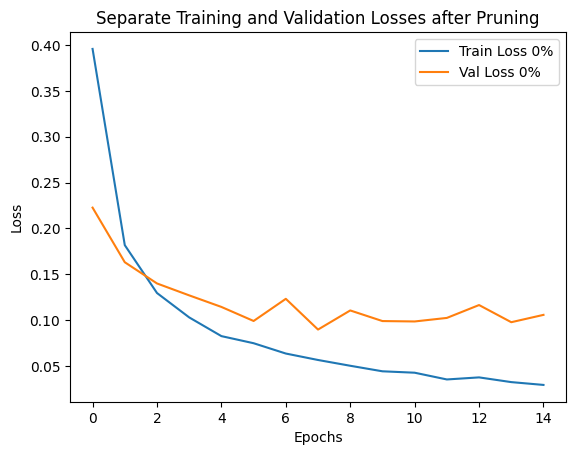

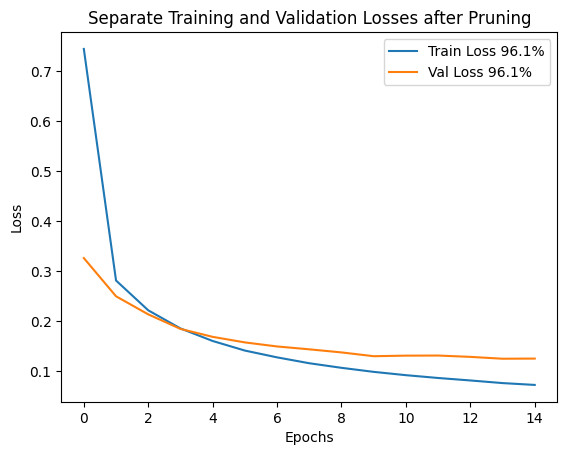

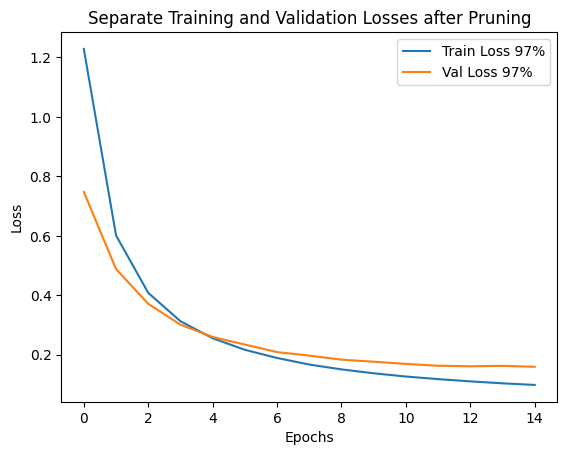

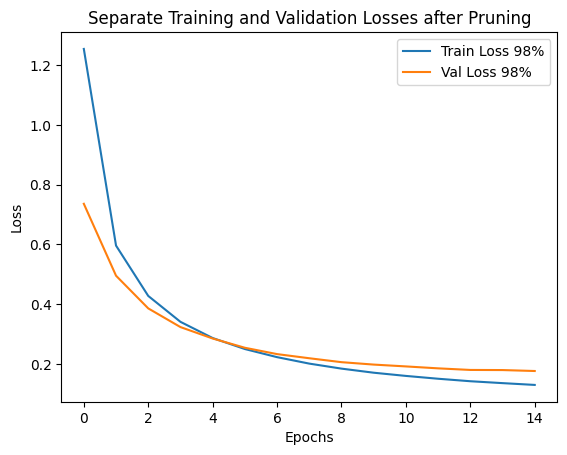

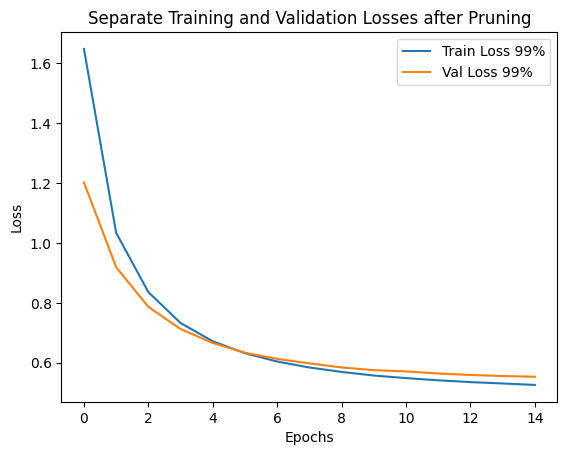

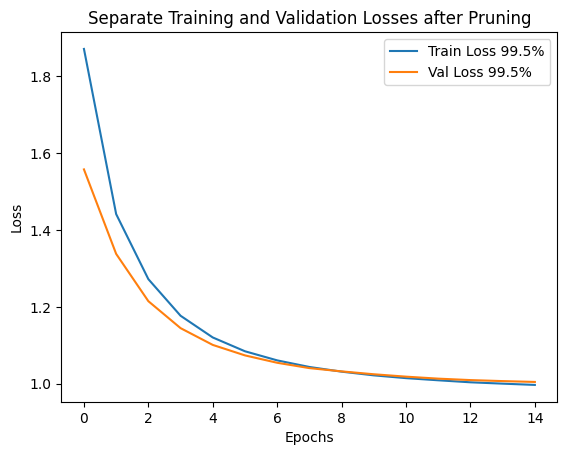

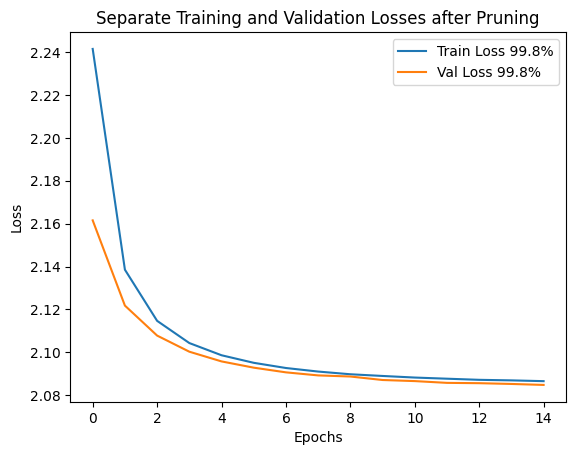

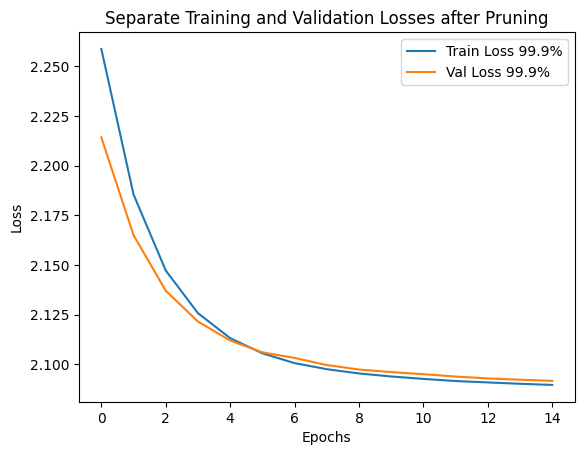

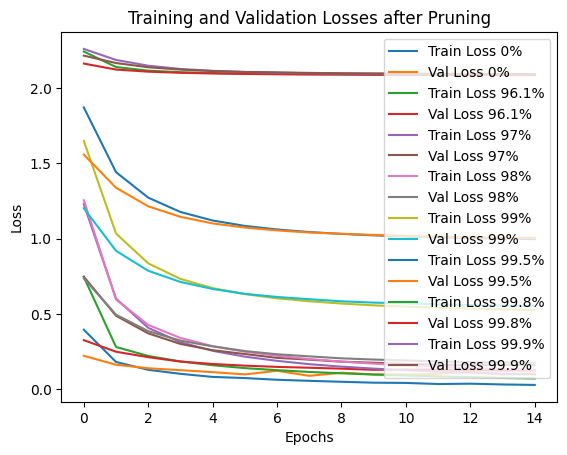

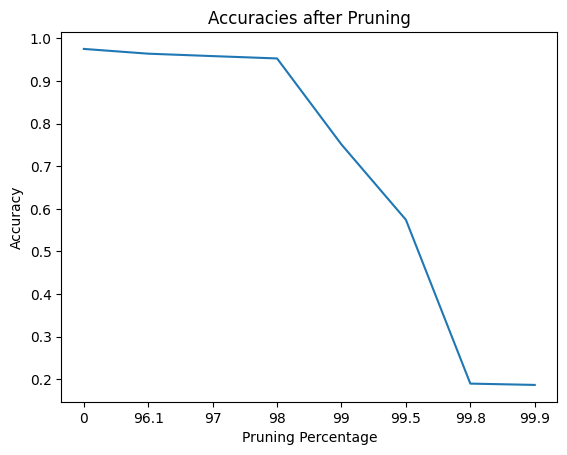

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
pruning_percentages = [0,96.1,97,98,99,99.5,99.8,99.9] # 0 is there for the plot, it isn't used in for loop
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    print(f"Pruning {percent}% of the weights")

    # Prune the current model
    masks = prune_by_percentage(current_model, percent)

    # Initialize a new model and retrain with masks
    new_model = MLP().to(device)
    optimizer = optim.Adam(new_model.parameters(), lr=0.001)
    # compare_models(new_model,current_model, masks, initial_state)
    retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15, rerandomize_initialization=True)

    # Evaluate the retrained model
    retrained_accuracy = evaluate(retrained_model, val_loader)
    print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
    verify_pruned_model(retrained_model)

    # Save results
    all_train_losses.append(retrain_train_losses)
    all_val_losses.append(retrain_val_losses)
    all_accuracies.append(retrained_accuracy)
    print(f"All accuracies so far: {all_accuracies}")

    # Prepare for the next iteration
    current_model = retrained_model

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

## Pruning random parameters, instead of low magnitude parameters
Random pruning degraded performance more than low-magnitude pruning with the same pruning percentages. This makes sense: low-magnitude pruning keeps the most useful parameters, while random pruning can mask very useful parameters (e.g. those multiplying pixel values in the middle of the image, which are important for classifying the digit). Notably, even random pruning did not significantly degrade up to ~90-95% pruning. 98% saw signifcant degradation.

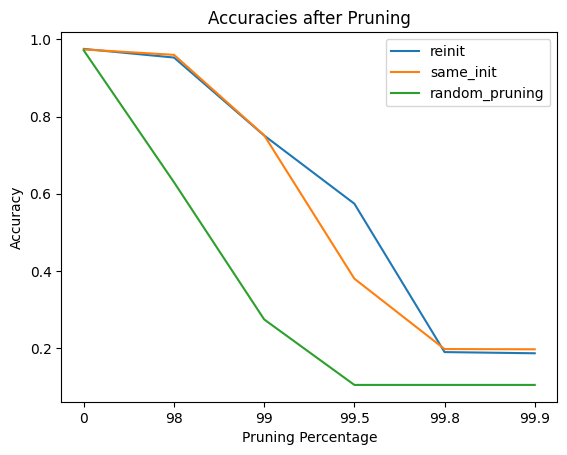

In [ ]:
reinitialized_accuracies = [0.975, 0.9526666666666667, 0.7508333333333334, 0.5743333333333334, 0.19016666666666668, 0.18708333333333332]
same_init_accuracies = [0.9736666666666667, 0.9596666666666667, 0.7513333333333333, 0.38016666666666665, 0.198, 0.19741666666666666]
random_pruning_accs = [0.9709166666666667, 0.6298333333333334, 0.27466666666666667, 0.10516666666666667, 0.10516666666666667, 0.10516666666666667]

pruning_percentages = [0,98,99,99.5,99.8,99.9]
pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,reinitialized_accuracies, label="reinit")
plt.plot(pruning_percentages_as_strs,same_init_accuracies, label="same_init")
plt.plot(pruning_percentages_as_strs,random_pruning_accs, label="random_pruning")
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.legend()
plt.show()

Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Initial Accuracy: 97.09%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%
Pruning 30% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 30% pruning: 97.06%
Total weights: 266610
Zero weights: 79860
Percentage of pruned weights: 29.95%
All accuracies so far: [0.9709166666666667, 0.9705833333333334]
Pruning 50% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 50% pruning: 97.42%
Total weights: 266610
Zero weights: 133100
Percentage of pruned weights: 49.92%
All accuracies so far: [0.9709166666666667, 0.9705833333333334, 0.9741666666666666]
Pruning 70% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 70% pruning: 96.93%
Total weights: 266610
Zero weights: 186340
Percentage of pruned weights: 69.89%
All accuracies so far: [0.9709166666666667, 0.9705833333333334, 0.9741666666666666, 0.9693333333333334]
Pruning 80% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 80% pruning: 96.76%
Total weights: 266610
Zero weights: 212960
Percentage of pruned weights: 79.88%
All accuracies so far: [0.9709166666666667, 0.9705833333333334, 0.9741666666666666, 0.9693333333333334, 0.9675833333333334]
Pruning 90% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 90% pruning: 95.83%
Total weights: 266610
Zero weights: 239580
Percentage of pruned weights: 89.86%
All accuracies so far: [0.9709166666666667, 0.9705833333333334, 0.9741666666666666, 0.9693333333333334, 0.9675833333333334, 0.9583333333333334]
Pruning 95% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 95% pruning: 93.71%
Total weights: 266610
Zero weights: 252890
Percentage of pruned weights: 94.85%
All accuracies so far: [0.9709166666666667, 0.9705833333333334, 0.9741666666666666, 0.9693333333333334, 0.9675833333333334, 0.9583333333333334, 0.9370833333333334]
Pruning 98% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 98% pruning: 62.98%
Total weights: 266610
Zero weights: 260876
Percentage of pruned weights: 97.85%
All accuracies so far: [0.9709166666666667, 0.9705833333333334, 0.9741666666666666, 0.9693333333333334, 0.9675833333333334, 0.9583333333333334, 0.9370833333333334, 0.6298333333333334]
Pruning 99% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99% pruning: 27.47%
Total weights: 266610
Zero weights: 263538
Percentage of pruned weights: 98.85%
All accuracies so far: [0.9709166666666667, 0.9705833333333334, 0.9741666666666666, 0.9693333333333334, 0.9675833333333334, 0.9583333333333334, 0.9370833333333334, 0.6298333333333334, 0.27466666666666667]
Pruning 99.5% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.5% pruning: 10.52%
Total weights: 266610
Zero weights: 264869
Percentage of pruned weights: 99.35%
All accuracies so far: [0.9709166666666667, 0.9705833333333334, 0.9741666666666666, 0.9693333333333334, 0.9675833333333334, 0.9583333333333334, 0.9370833333333334, 0.6298333333333334, 0.27466666666666667, 0.10516666666666667]
Pruning 99.8% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.8% pruning: 10.52%
Total weights: 266610
Zero weights: 265667
Percentage of pruned weights: 99.65%
All accuracies so far: [0.9709166666666667, 0.9705833333333334, 0.9741666666666666, 0.9693333333333334, 0.9675833333333334, 0.9583333333333334, 0.9370833333333334, 0.6298333333333334, 0.27466666666666667, 0.10516666666666667, 0.10516666666666667]
Pruning 99.9% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.9% pruning: 10.52%
Total weights: 266610
Zero weights: 265933
Percentage of pruned weights: 99.75%
All accuracies so far: [0.9709166666666667, 0.9705833333333334, 0.9741666666666666, 0.9693333333333334, 0.9675833333333334, 0.9583333333333334, 0.9370833333333334, 0.6298333333333334, 0.27466666666666667, 0.10516666666666667, 0.10516666666666667, 0.10516666666666667]


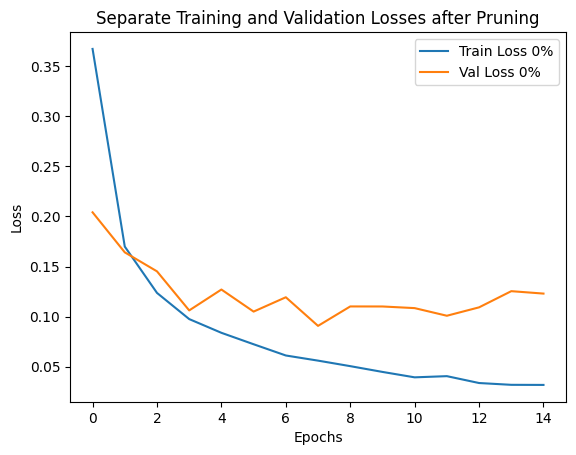

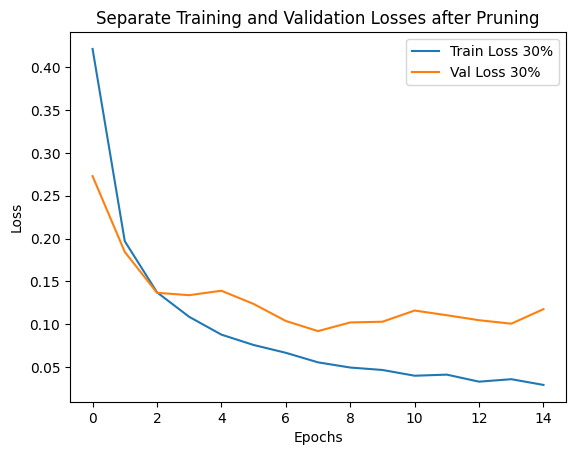

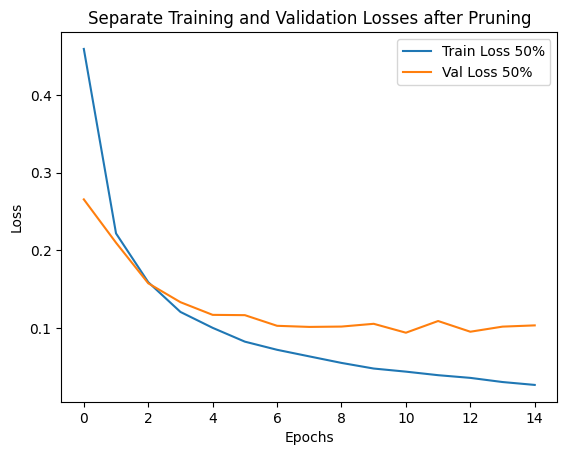

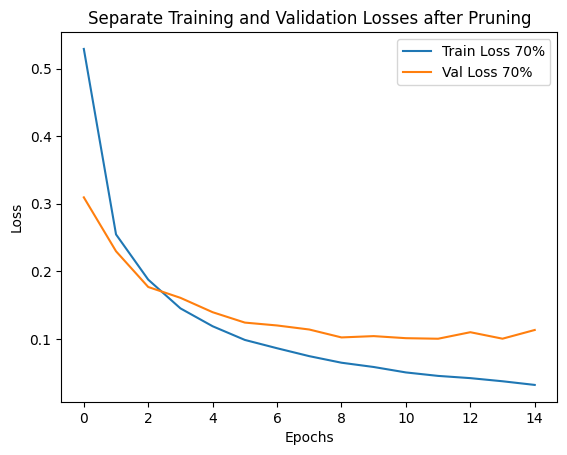

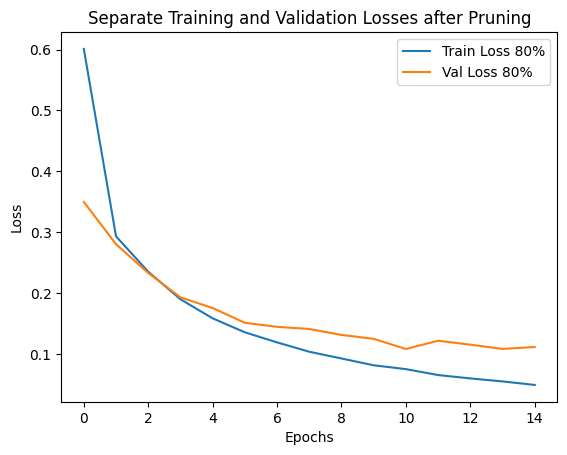

...

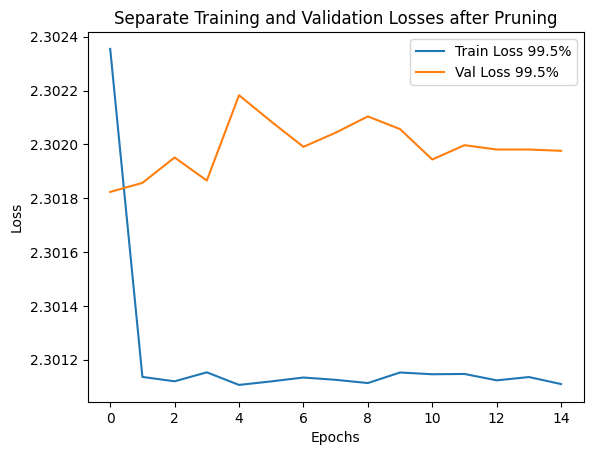

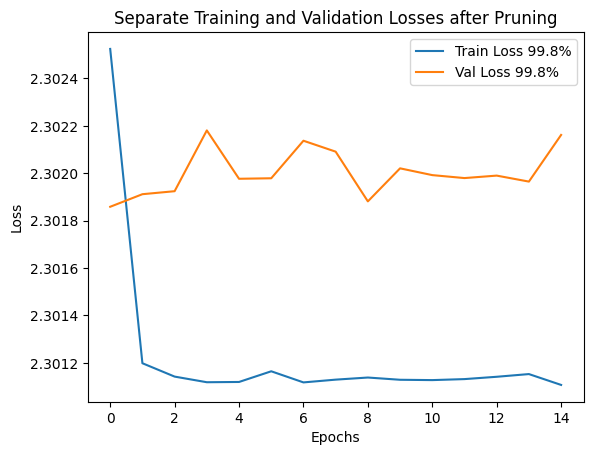

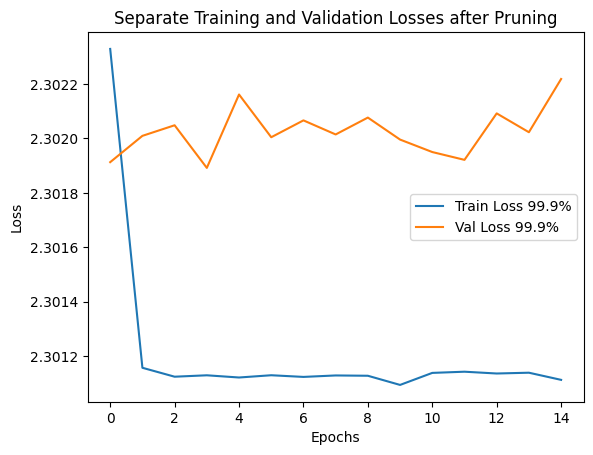

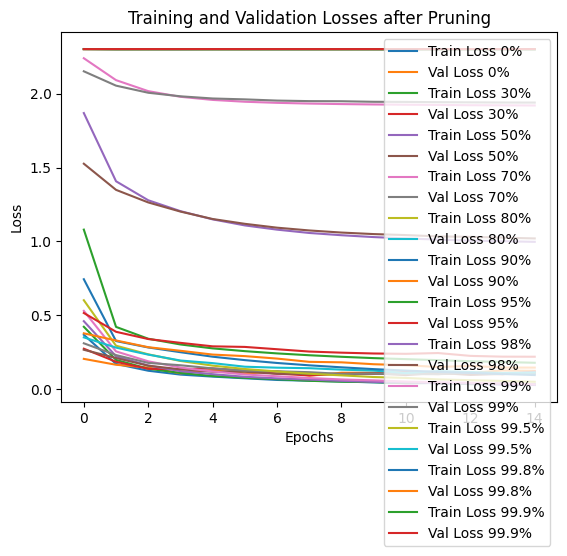

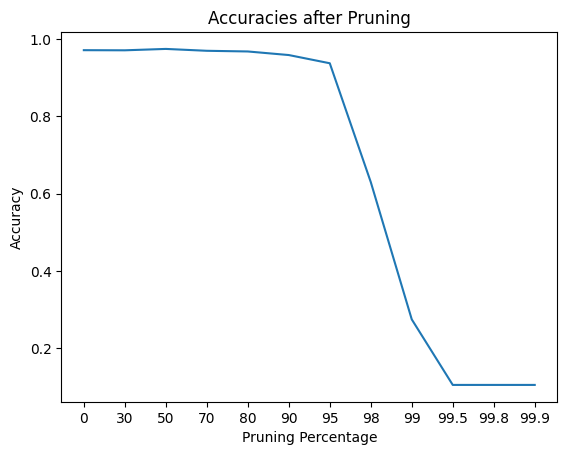

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
pruning_percentages = [0, 30, 50, 70, 80, 90, 95, 98, 99, 99.5, 99.8, 99.9] # 0 is there for the plot, it isn't used in for loop
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    print(f"\nPruning {percent}% of the weights")

    # Prune the current model
    masks = prune_randomly(current_model, percent)

    # Initialize a new model and retrain with masks
    new_model = MLP().to(device)
    optimizer = optim.Adam(new_model.parameters(), lr=0.001)
    # compare_models(new_model,current_model, masks, initial_state)
    retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15)

    # Evaluate the retrained model
    retrained_accuracy = evaluate(retrained_model, val_loader)
    print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
    verify_pruned_model(retrained_model)

    # Save results
    all_train_losses.append(retrain_train_losses)
    all_val_losses.append(retrain_val_losses)
    all_accuracies.append(retrained_accuracy)
    print(f"All accuracies so far: {all_accuracies}")

    # Prepare for the next iteration
    current_model = retrained_model

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

## Testing global percentage masking, rather than stratified by layer
1. Low magnitude, same init
2. Low mag, reinit

I didn't do random pruning here. I figure that's almost identical to random pruning by layer, since random pruning across the model will prune approximately the same percentage in every layer.

### Final Plot
Takeaway: same_init global >~ reinit global > reinit ~ same_init > random

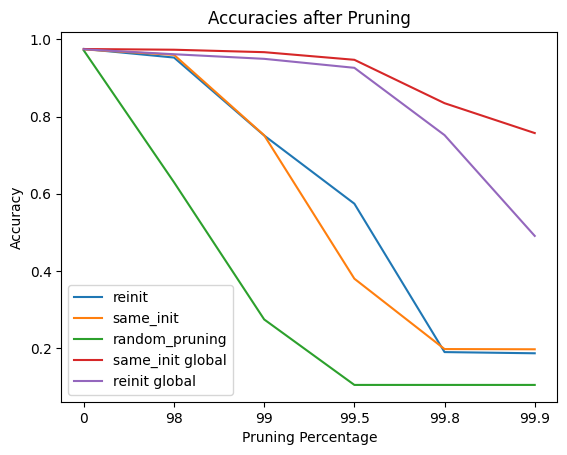

In [ ]:
reinitialized_accuracies = [0.975, 0.9526666666666667, 0.7508333333333334, 0.5743333333333334, 0.19016666666666668, 0.18708333333333332]
same_init_accuracies = [0.9736666666666667, 0.9596666666666667, 0.7513333333333333, 0.38016666666666665, 0.198, 0.19741666666666666]
random_pruning_accs = [0.9709166666666667, 0.6298333333333334, 0.27466666666666667, 0.10516666666666667, 0.10516666666666667, 0.10516666666666667]

same_init_global_prune_accuracies = [0.97475, 0.9729166666666667, 0.9665833333333333, 0.9468333333333333, 0.8345, 0.7571666666666667]
reinitialized_global_prune_accuracies = [0.974, 0.96125, 0.9493333333333334, 0.9260833333333334, 0.7518333333333334, 0.49091666666666667]

 ### Add results from >99.9% pruning runs for the lat ##

pruning_percentages = [0,98,99,99.5,99.8,99.9]
pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,reinitialized_accuracies, label="reinit")
plt.plot(pruning_percentages_as_strs,same_init_accuracies, label="same_init")
plt.plot(pruning_percentages_as_strs,random_pruning_accs, label="random_pruning")
plt.plot(pruning_percentages_as_strs,same_init_global_prune_accuracies, label="same_init global")
plt.plot(pruning_percentages_as_strs,reinitialized_global_prune_accuracies, label="reinit global")
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.legend()
plt.show()

### Experiments

Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Initial Accuracy: 97.47%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%

Pruning 90% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 90% pruning: 97.76%
Total weights: 266610
Zero weights: 239949
Percentage of pruned weights: 90.00%
All accuracies so far: [0.97475, 0.9775833333333334]

Pruning 98% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 98% pruning: 97.29%
Total weights: 266610
Zero weights: 261277
Percentage of pruned weights: 98.00%
All accuracies so far: [0.97475, 0.9775833333333334, 0.9729166666666667]

Pruning 99% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99% pruning: 96.66%
Total weights: 266610
Zero weights: 263943
Percentage of pruned weights: 99.00%
All accuracies so far: [0.97475, 0.9775833333333334, 0.9729166666666667, 0.9665833333333333]

Pruning 99.5% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.5% pruning: 94.68%
Total weights: 266610
Zero weights: 265276
Percentage of pruned weights: 99.50%
All accuracies so far: [0.97475, 0.9775833333333334, 0.9729166666666667, 0.9665833333333333, 0.9468333333333333]

Pruning 99.8% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.8% pruning: 83.45%
Total weights: 266610
Zero weights: 266076
Percentage of pruned weights: 99.80%
All accuracies so far: [0.97475, 0.9775833333333334, 0.9729166666666667, 0.9665833333333333, 0.9468333333333333, 0.8345]

Pruning 99.9% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.9% pruning: 75.72%
Total weights: 266610
Zero weights: 266343
Percentage of pruned weights: 99.90%
All accuracies so far: [0.97475, 0.9775833333333334, 0.9729166666666667, 0.9665833333333333, 0.9468333333333333, 0.8345, 0.7571666666666667]


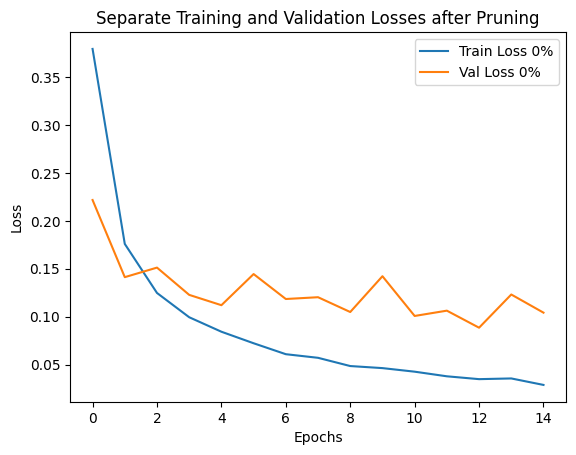

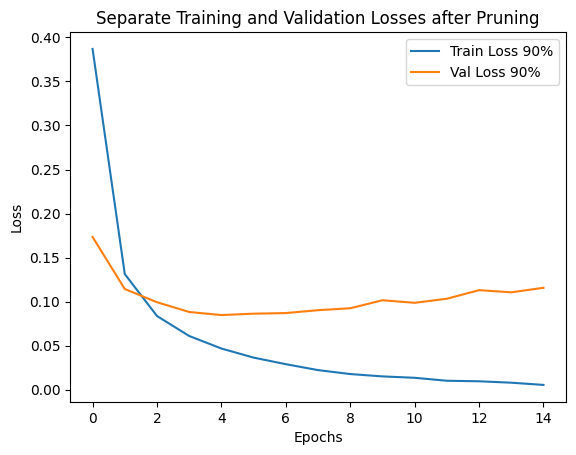

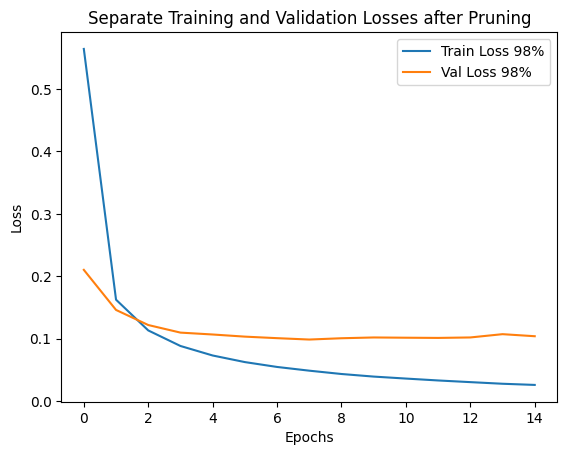

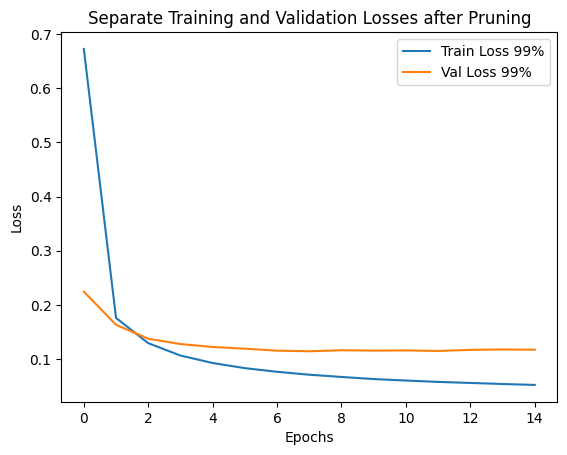

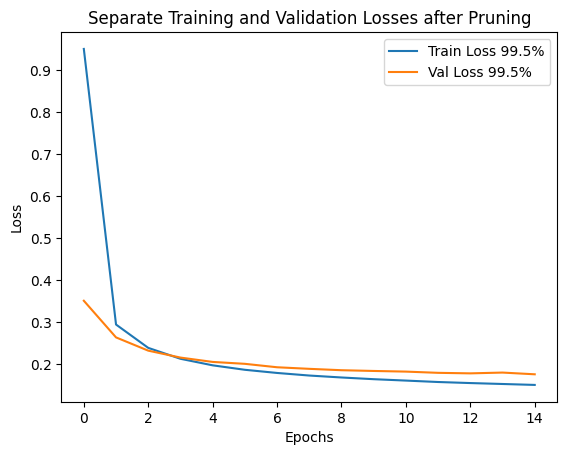

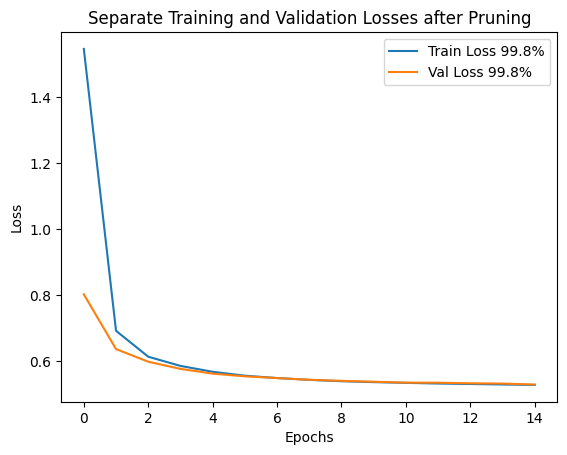

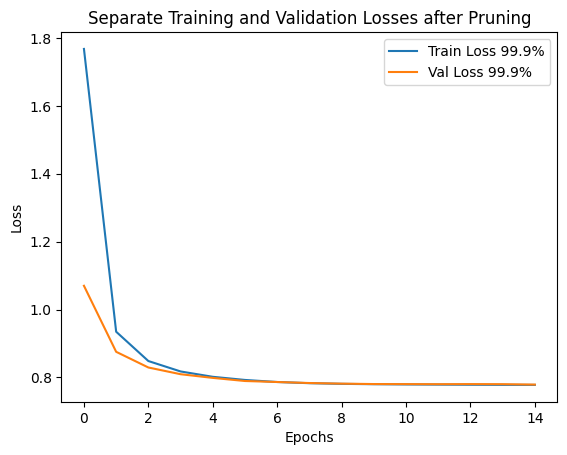

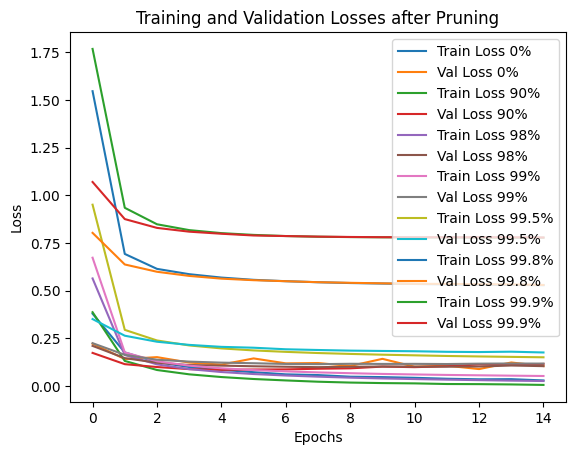

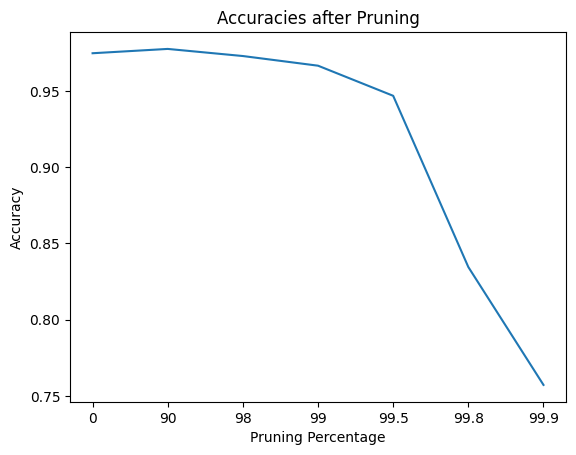

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
pruning_percentages = [0,90,98,99,99.5,99.8,99.9]
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    print(f"\nPruning {percent}% of the weights")

    # Prune the current model
    masks = prune_by_percentage_global(current_model, percent)

    # Initialize a new model and retrain with masks
    new_model = MLP().to(device)
    optimizer = optim.Adam(new_model.parameters(), lr=0.001)
    # compare_models(new_model,current_model, masks, initial_state)
    retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15)

    # Evaluate the retrained model
    retrained_accuracy = evaluate(retrained_model, val_loader)
    print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
    verify_pruned_model(retrained_model)

    # Save results
    all_train_losses.append(retrain_train_losses)
    all_val_losses.append(retrain_val_losses)
    all_accuracies.append(retrained_accuracy)
    print(f"All accuracies so far: {all_accuracies}")

    # Prepare for the next iteration
    current_model = retrained_model

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Initial Accuracy: 97.40%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%

Pruning 90% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 90% pruning: 96.95%
Total weights: 266610
Zero weights: 239949
Percentage of pruned weights: 90.00%
All accuracies so far: [0.974, 0.9695]

Pruning 98% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 98% pruning: 96.12%
Total weights: 266610
Zero weights: 261277
Percentage of pruned weights: 98.00%
All accuracies so far: [0.974, 0.9695, 0.96125]

Pruning 99% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99% pruning: 94.93%
Total weights: 266610
Zero weights: 263943
Percentage of pruned weights: 99.00%
All accuracies so far: [0.974, 0.9695, 0.96125, 0.9493333333333334]

Pruning 99.5% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.5% pruning: 92.61%
Total weights: 266610
Zero weights: 265276
Percentage of pruned weights: 99.50%
All accuracies so far: [0.974, 0.9695, 0.96125, 0.9493333333333334, 0.9260833333333334]

Pruning 99.8% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.8% pruning: 75.18%
Total weights: 266610
Zero weights: 266076
Percentage of pruned weights: 99.80%
All accuracies so far: [0.974, 0.9695, 0.96125, 0.9493333333333334, 0.9260833333333334, 0.7518333333333334]

Pruning 99.9% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.9% pruning: 49.09%
Total weights: 266610
Zero weights: 266343
Percentage of pruned weights: 99.90%
All accuracies so far: [0.974, 0.9695, 0.96125, 0.9493333333333334, 0.9260833333333334, 0.7518333333333334, 0.49091666666666667]


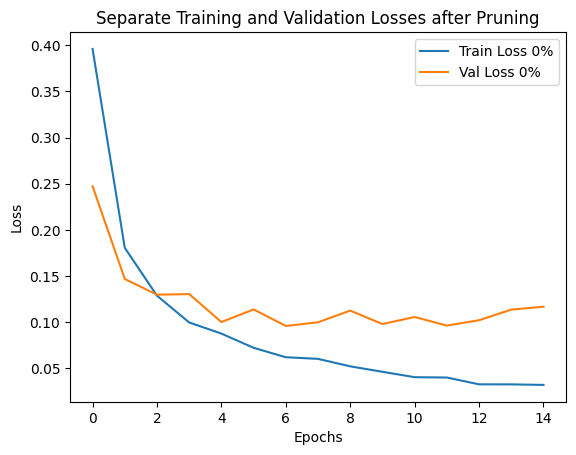

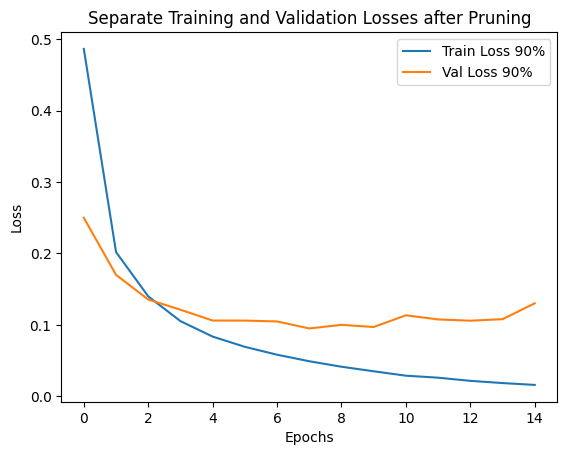

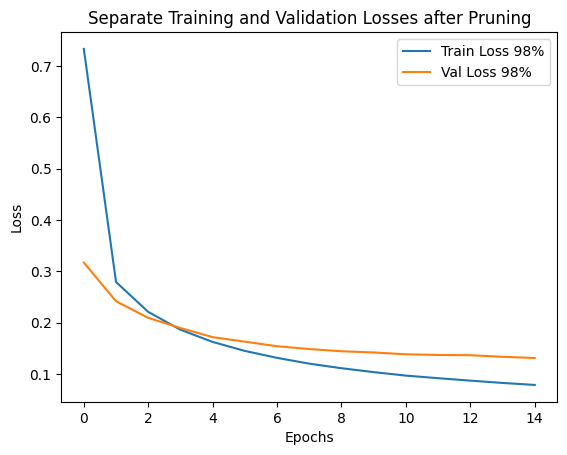

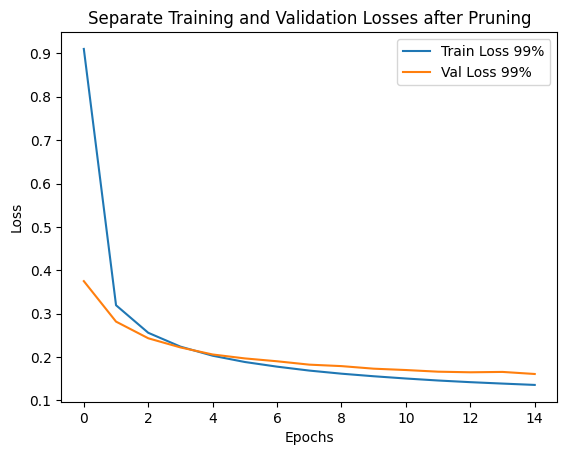

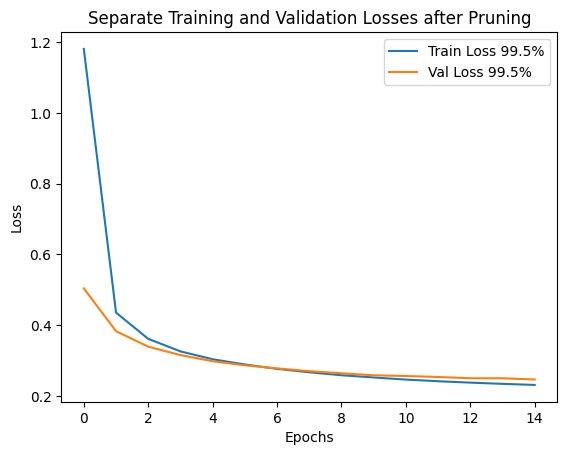

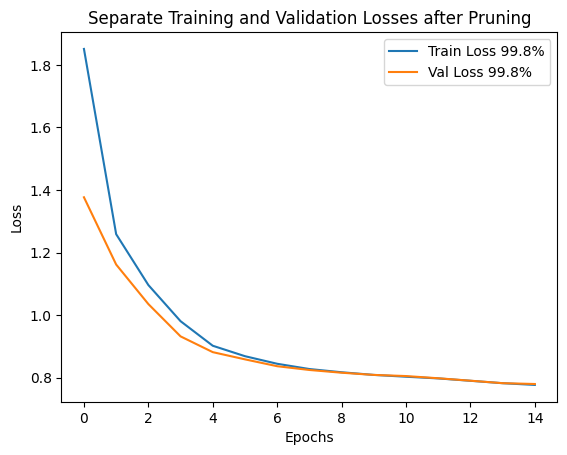

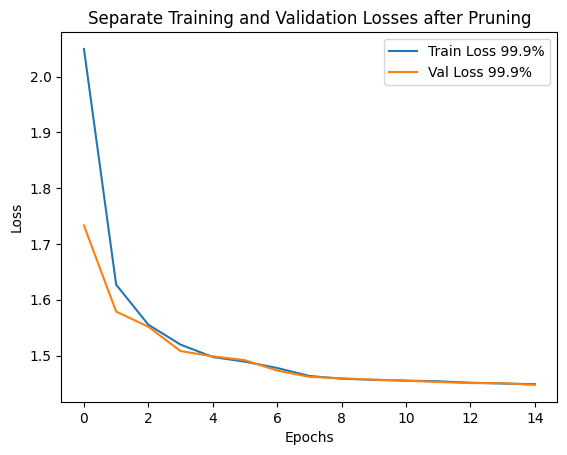

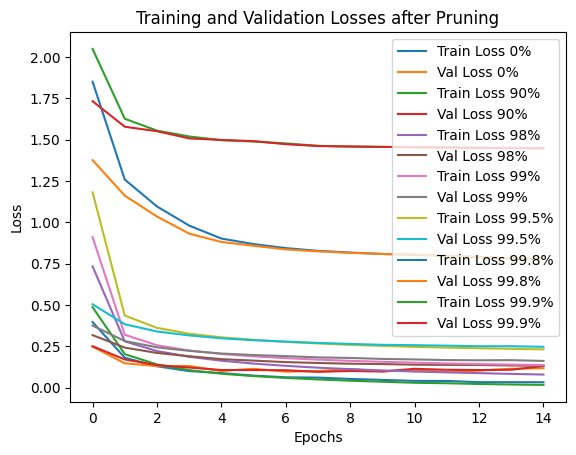

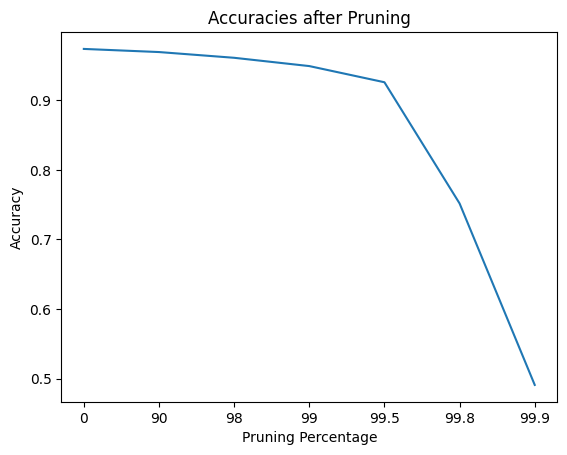

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
pruning_percentages = [0,90,98,99,99.5,99.8,99.9] # First run
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    print(f"\nPruning {percent}% of the weights")

    # Prune the current model
    masks = prune_by_percentage_global(current_model, percent)

    # Initialize a new model and retrain with masks
    new_model = MLP().to(device)
    optimizer = optim.Adam(new_model.parameters(), lr=0.001)
    # compare_models(new_model,current_model, masks, initial_state)
    retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15, rerandomize_initialization=True)

    # Evaluate the retrained model
    retrained_accuracy = evaluate(retrained_model, val_loader)
    print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
    verify_pruned_model(retrained_model)

    # Save results
    all_train_losses.append(retrain_train_losses)
    all_val_losses.append(retrain_val_losses)
    all_accuracies.append(retrained_accuracy)
    print(f"All accuracies so far: {all_accuracies}")

    # Prepare for the next iteration
    current_model = retrained_model

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Initial Accuracy: 97.42%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%

Pruning 95% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 95% pruning: 97.19%
Total weights: 266610
Zero weights: 253279
Percentage of pruned weights: 95.00%
All accuracies so far: [0.9741666666666666, 0.9719166666666667]

Pruning 99.5% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.5% pruning: 92.13%
Total weights: 266610
Zero weights: 265276
Percentage of pruned weights: 99.50%
All accuracies so far: [0.9741666666666666, 0.9719166666666667, 0.9213333333333333]

Pruning 99.9% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.9% pruning: 53.60%
Total weights: 266610
Zero weights: 266343
Percentage of pruned weights: 99.90%
All accuracies so far: [0.9741666666666666, 0.9719166666666667, 0.9213333333333333, 0.536]

Pruning 99.93% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.93% pruning: 53.55%
Total weights: 266610
Zero weights: 266423
Percentage of pruned weights: 99.93%
All accuracies so far: [0.9741666666666666, 0.9719166666666667, 0.9213333333333333, 0.536, 0.5355]

Pruning 99.95% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.95% pruning: 53.49%
Total weights: 266610
Zero weights: 266476
Percentage of pruned weights: 99.95%
All accuracies so far: [0.9741666666666666, 0.9719166666666667, 0.9213333333333333, 0.536, 0.5355, 0.5349166666666667]

Pruning 99.98% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.98% pruning: 23.08%
Total weights: 266610
Zero weights: 266556
Percentage of pruned weights: 99.98%
All accuracies so far: [0.9741666666666666, 0.9719166666666667, 0.9213333333333333, 0.536, 0.5355, 0.5349166666666667, 0.23083333333333333]

Pruning 99.99% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.99% pruning: 24.27%
Total weights: 266610
Zero weights: 266583
Percentage of pruned weights: 99.99%
All accuracies so far: [0.9741666666666666, 0.9719166666666667, 0.9213333333333333, 0.536, 0.5355, 0.5349166666666667, 0.23083333333333333, 0.24275]


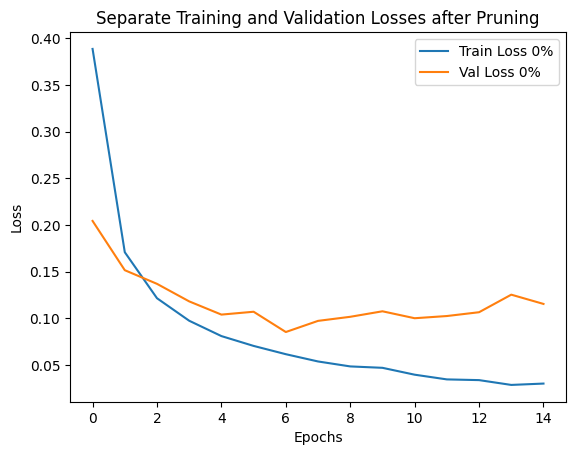

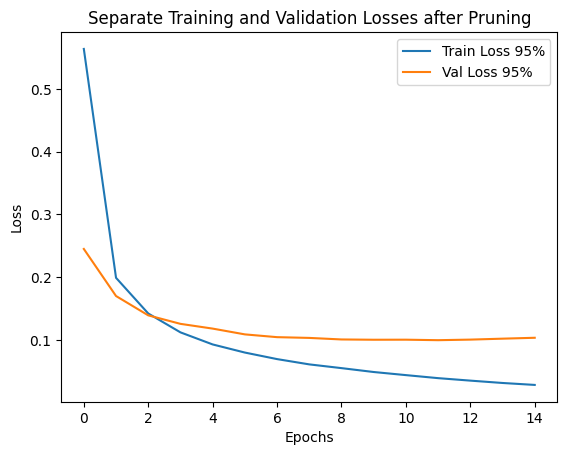

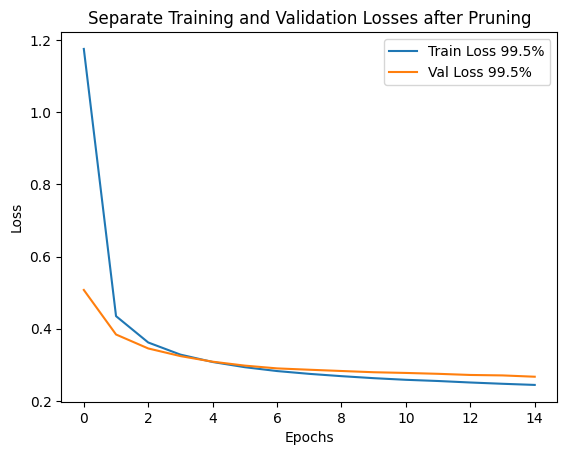

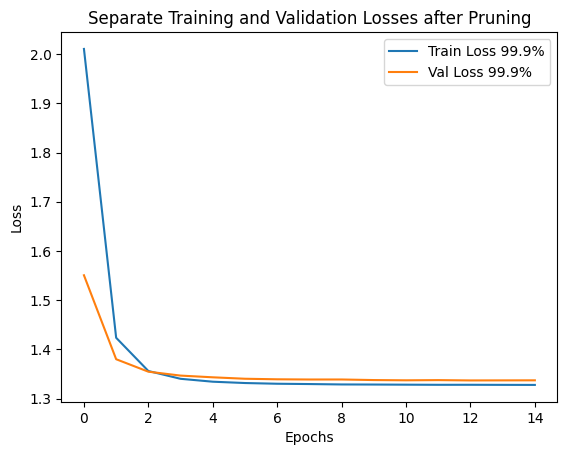

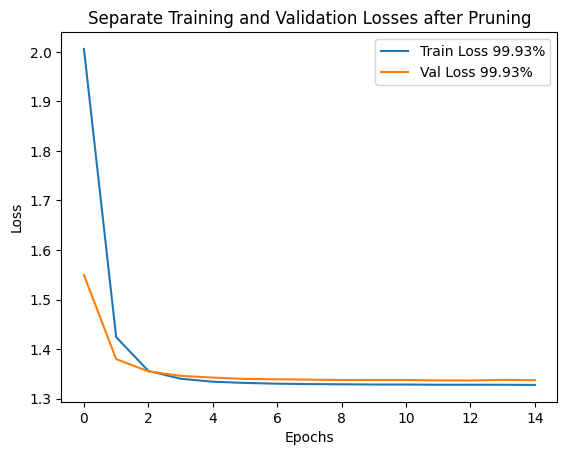

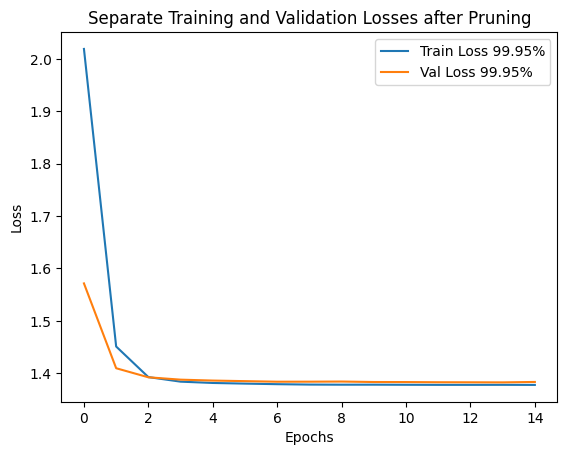

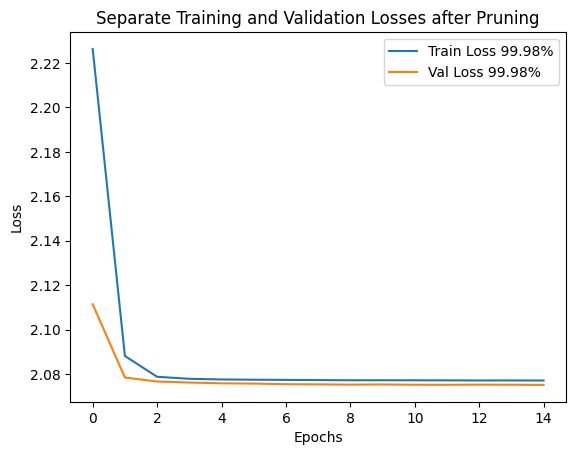

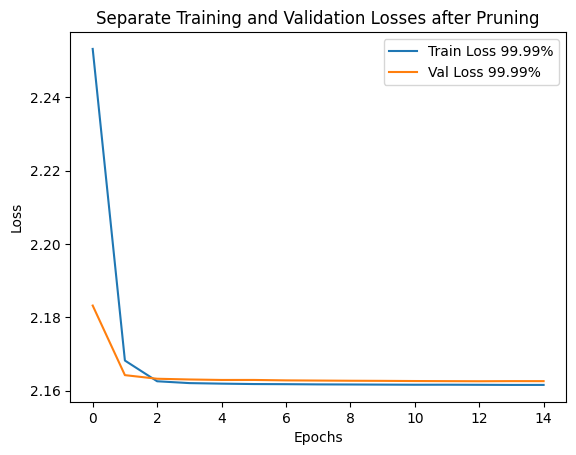

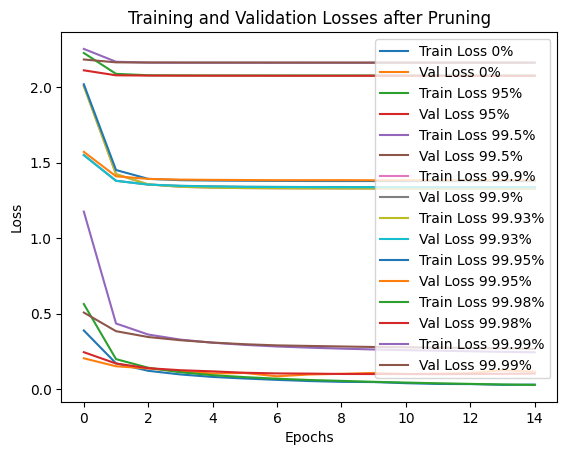

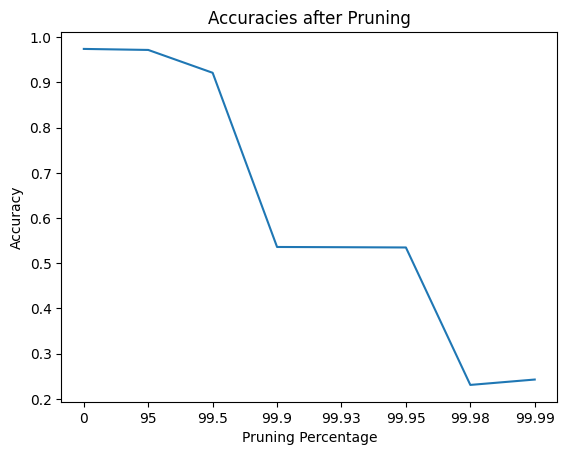

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
# pruning_percentages = [0,90,98,99,99.5,99.8,99.9] # First run
pruning_percentages = [0,95,99.5,99.9,99.93, 99.95, 99.98, 99.99]
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    print(f"\nPruning {percent}% of the weights")

    # Prune the current model
    masks = prune_by_percentage_global(current_model, percent)

    # Initialize a new model and retrain with masks
    new_model = MLP().to(device)
    optimizer = optim.Adam(new_model.parameters(), lr=0.001)
    # compare_models(new_model,current_model, masks, initial_state)
    retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15)

    # Evaluate the retrained model
    retrained_accuracy = evaluate(retrained_model, val_loader)
    print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
    verify_pruned_model(retrained_model)

    # Save results
    all_train_losses.append(retrain_train_losses)
    all_val_losses.append(retrain_val_losses)
    all_accuracies.append(retrained_accuracy)
    print(f"All accuracies so far: {all_accuracies}")

    # Prepare for the next iteration
    current_model = retrained_model

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Initial Accuracy: 97.16%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%

Pruning 95% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 95% pruning: 96.86%
Total weights: 266610
Zero weights: 253279
Percentage of pruned weights: 95.00%
All accuracies so far: [0.9715833333333334, 0.9685833333333334]

Pruning 99.5% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.5% pruning: 90.42%
Total weights: 266610
Zero weights: 265276
Percentage of pruned weights: 99.50%
All accuracies so far: [0.9715833333333334, 0.9685833333333334, 0.90425]

Pruning 99.9% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.9% pruning: 40.60%
Total weights: 266610
Zero weights: 266343
Percentage of pruned weights: 99.90%
All accuracies so far: [0.9715833333333334, 0.9685833333333334, 0.90425, 0.406]

Pruning 99.93% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.93% pruning: 24.93%
Total weights: 266610
Zero weights: 266423
Percentage of pruned weights: 99.93%
All accuracies so far: [0.9715833333333334, 0.9685833333333334, 0.90425, 0.406, 0.24933333333333332]

Pruning 99.95% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.95% pruning: 38.44%
Total weights: 266610
Zero weights: 266476
Percentage of pruned weights: 99.95%
All accuracies so far: [0.9715833333333334, 0.9685833333333334, 0.90425, 0.406, 0.24933333333333332, 0.3844166666666667]

Pruning 99.98% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.98% pruning: 32.36%
Total weights: 266610
Zero weights: 266556
Percentage of pruned weights: 99.98%
All accuracies so far: [0.9715833333333334, 0.9685833333333334, 0.90425, 0.406, 0.24933333333333332, 0.3844166666666667, 0.32358333333333333]

Pruning 99.99% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.99% pruning: 17.23%
Total weights: 266610
Zero weights: 266583
Percentage of pruned weights: 99.99%
All accuracies so far: [0.9715833333333334, 0.9685833333333334, 0.90425, 0.406, 0.24933333333333332, 0.3844166666666667, 0.32358333333333333, 0.17233333333333334]


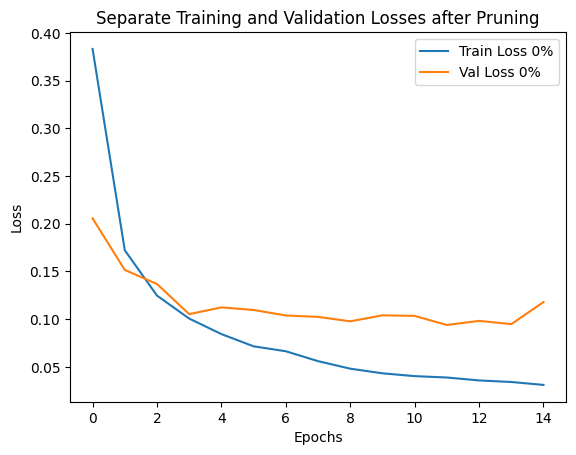

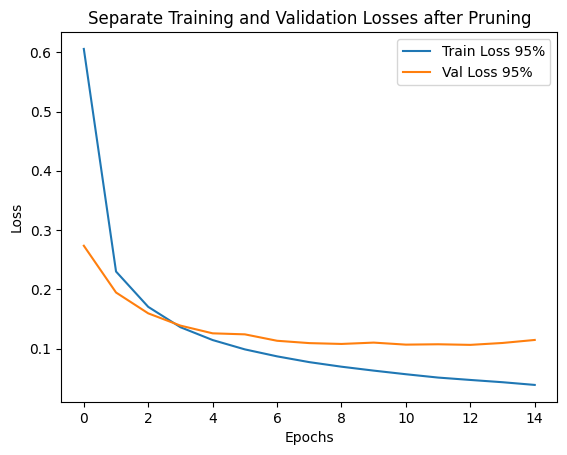

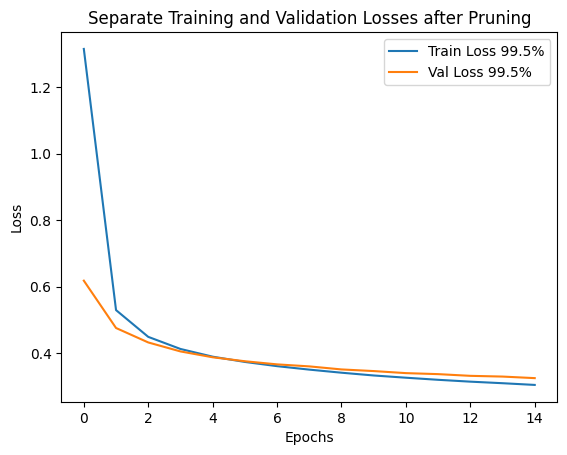

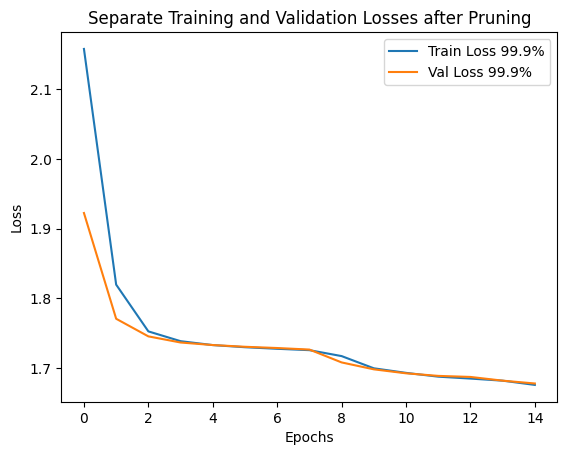

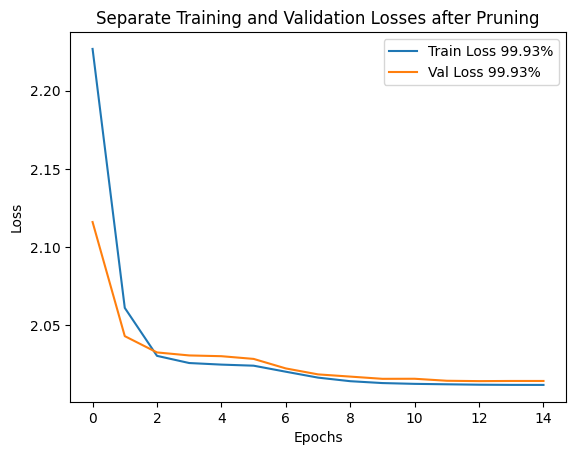

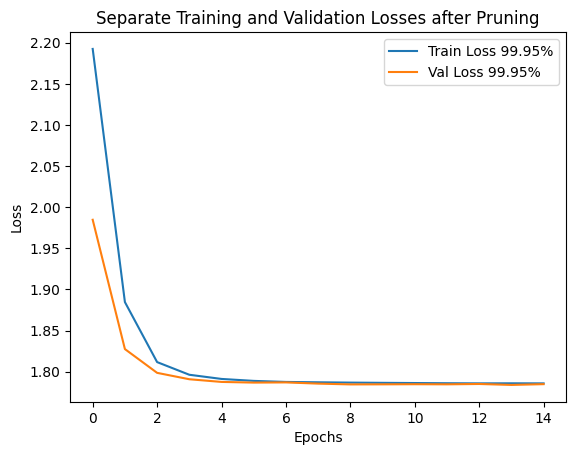

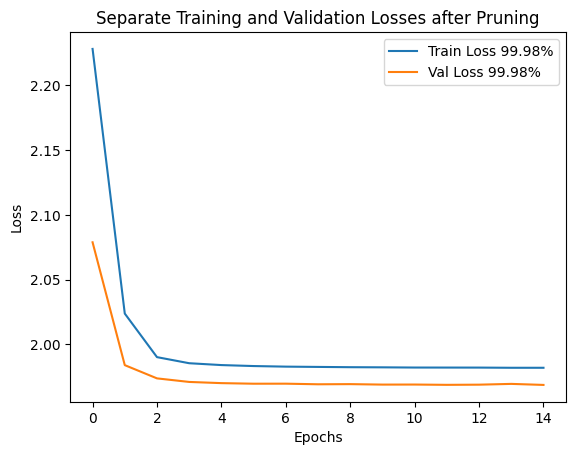

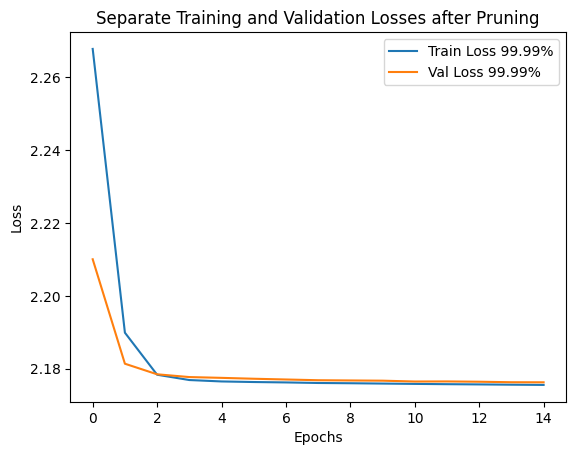

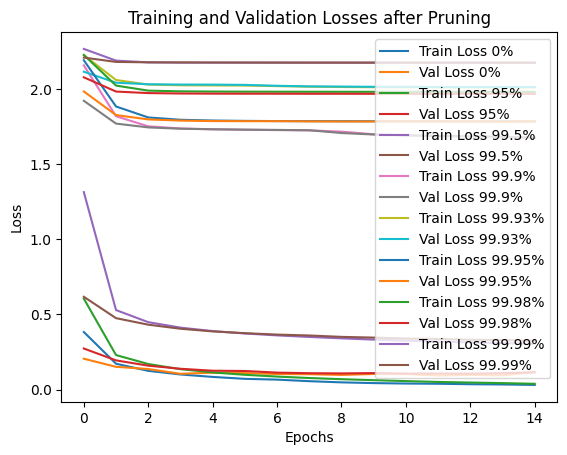

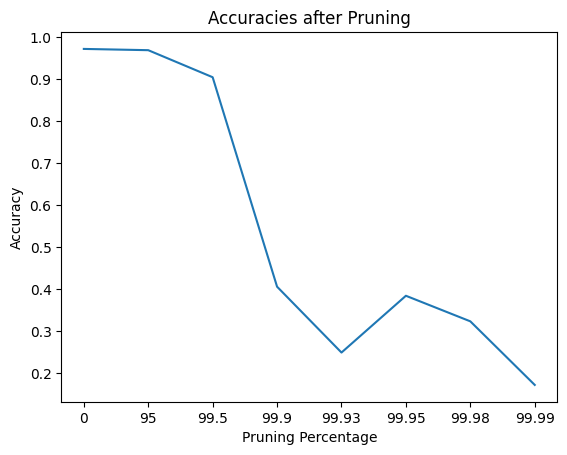

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
# pruning_percentages = [0,90,98,99,99.5,99.8,99.9] # First run
pruning_percentages = [0,95,99.5,99.9,99.93, 99.95, 99.98, 99.99]
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    print(f"\nPruning {percent}% of the weights")

    # Prune the current model
    masks = prune_by_percentage_global(current_model, percent)

    # Initialize a new model and retrain with masks
    new_model = MLP().to(device)
    optimizer = optim.Adam(new_model.parameters(), lr=0.001)
    # compare_models(new_model,current_model, masks, initial_state)
    retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15, rerandomize_initialization=True)

    # Evaluate the retrained model
    retrained_accuracy = evaluate(retrained_model, val_loader)
    print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
    verify_pruned_model(retrained_model)

    # Save results
    all_train_losses.append(retrain_train_losses)
    all_val_losses.append(retrain_val_losses)
    all_accuracies.append(retrained_accuracy)
    print(f"All accuracies so far: {all_accuracies}")

    # Prepare for the next iteration
    current_model = retrained_model

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

## Basic demonstration of what global pruning does across layers and to the input layer
In a minimal example, it seems like more weights are pruned in earlier layers, more biases than weights are pruned, and weights that multiply pixels on the edges of the image are pruned more (which makes sense, because the middle pixels are generally where the digits are).

Epoch 1/1 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/1 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

pruned_proportions=[0.9153911564625851, 1.0, 0.7937333333333333, 0.87, 0.444, 0.6]


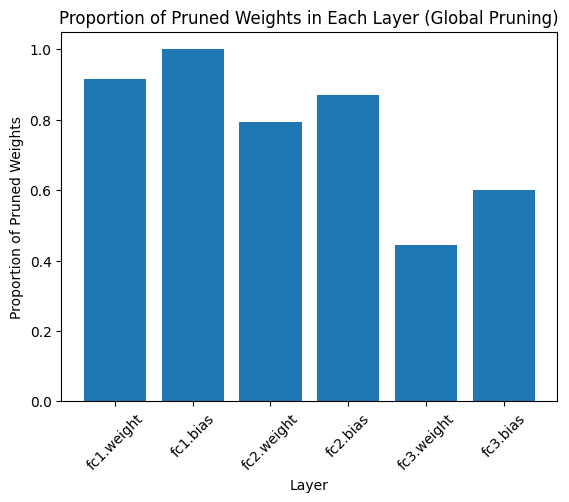

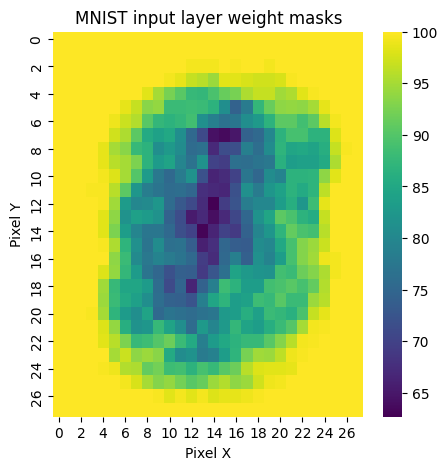

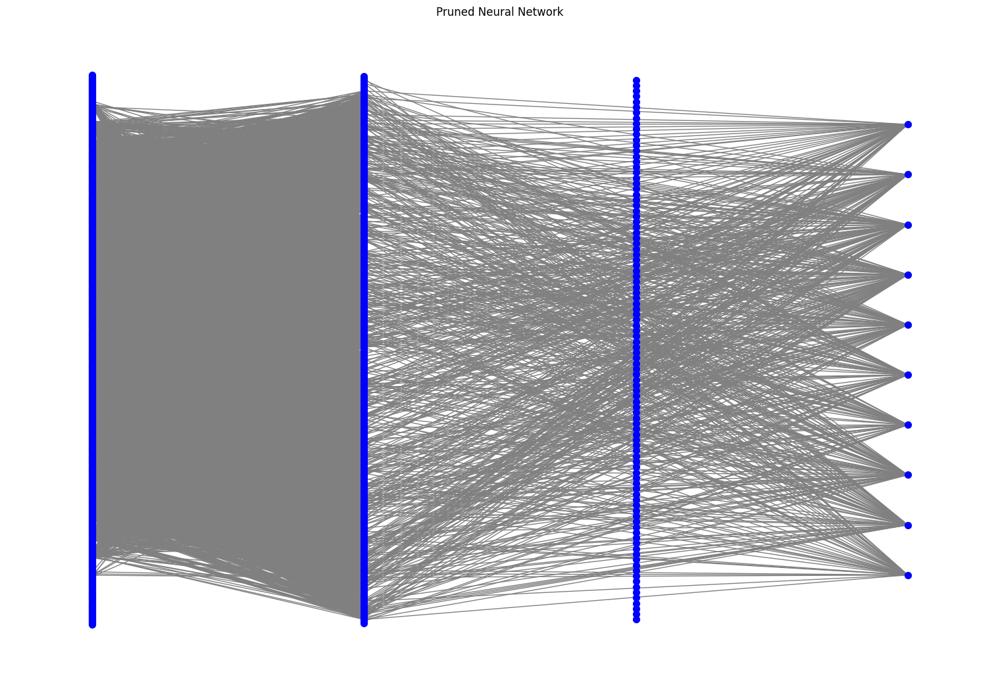

In [ ]:
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
train(model,criterion,optimizer,train_loader,val_loader,epochs=1)
masks = prune_by_percentage_global(model, 90)
print_and_plot_unpruned_proportions_by_layer(model,masks)
visualize_MNIST_layer_weights(model, masks)
visualize_pruned_network(masks)

Epoch 1/1 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/1 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

pruned_proportions=[4.251700680272109e-06, 0.0, 0.0, 0.0, 0.0, 0.0]


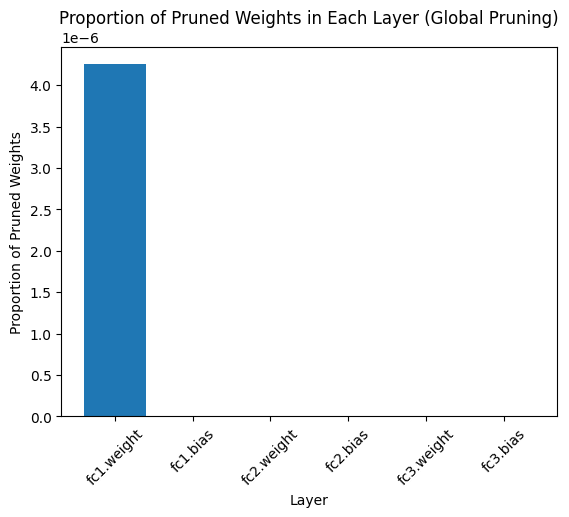

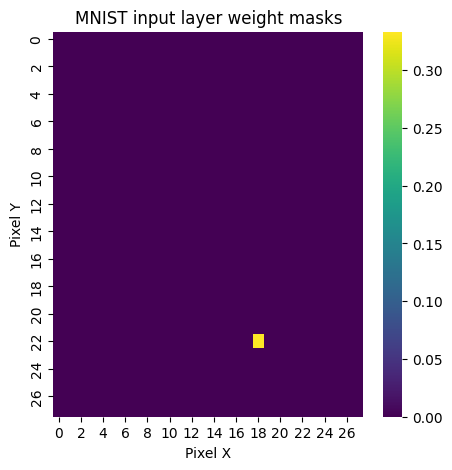

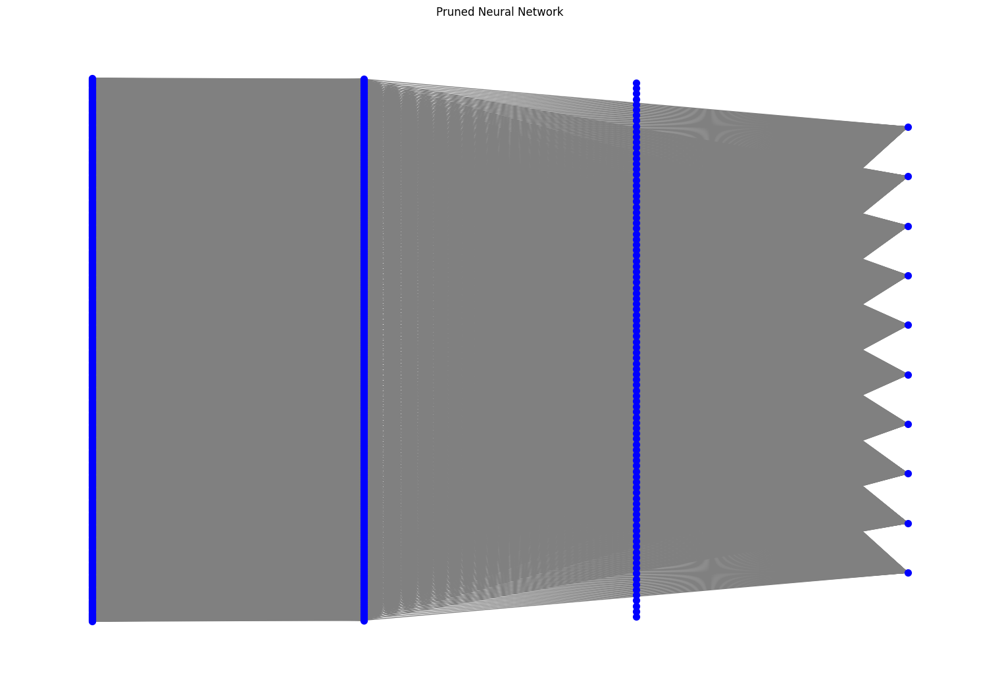

In [ ]:
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
train(model,criterion,optimizer,train_loader,val_loader,epochs=1)
masks = prune_by_percentage_global(model, 0)
print_and_plot_unpruned_proportions_by_layer(model,masks)
visualize_MNIST_layer_weights(model, masks)
visualize_pruned_network(masks)

Epoch 1/1 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/1 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

pruned_proportions=[0.9991156462585034, 1.0, 0.9989333333333333, 1.0, 0.973, 1.0]


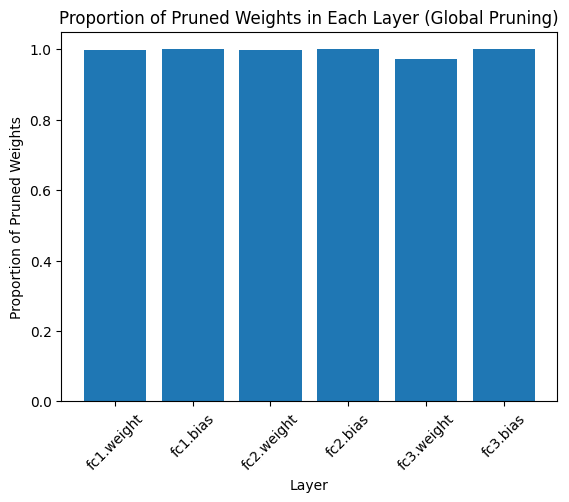

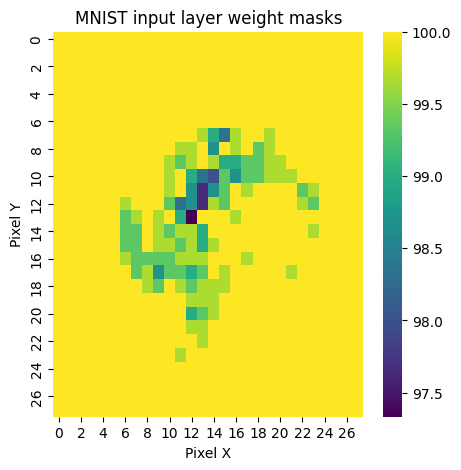

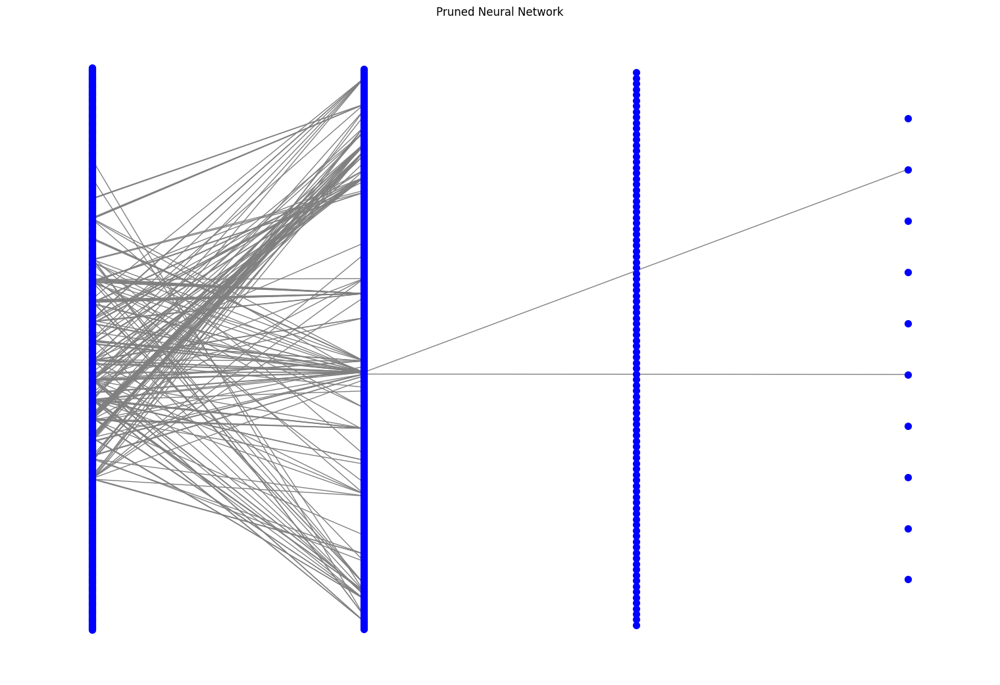

In [ ]:
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
train(model,criterion,optimizer,train_loader,val_loader,epochs=1)
masks = prune_by_percentage_global(model, 99.9)
print_and_plot_unpruned_proportions_by_layer(model,masks)
visualize_MNIST_layer_weights(model, masks)
visualize_pruned_network(masks)

Epoch 1/1 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/1 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

pruned_proportions=[0.9999617346938775, 1.0, 0.9998666666666667, 1.0, 0.999, 1.0]


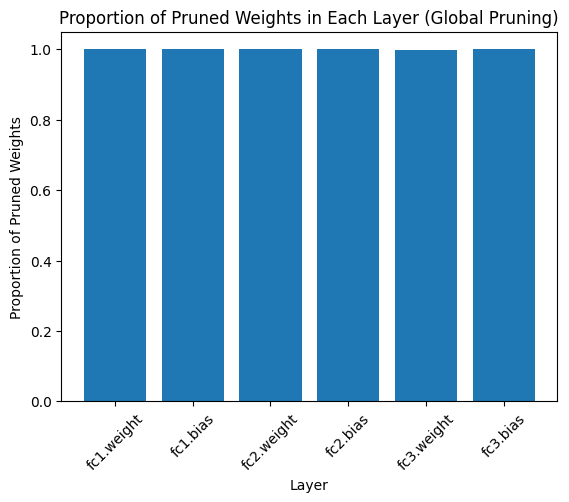

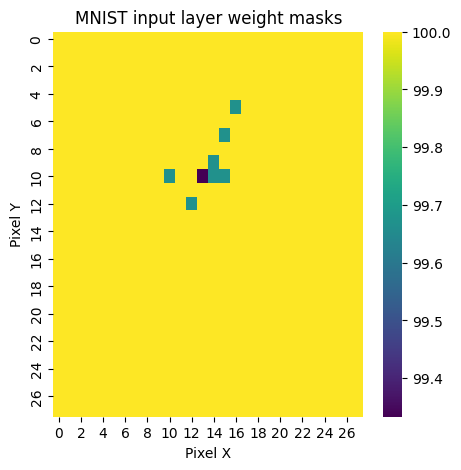

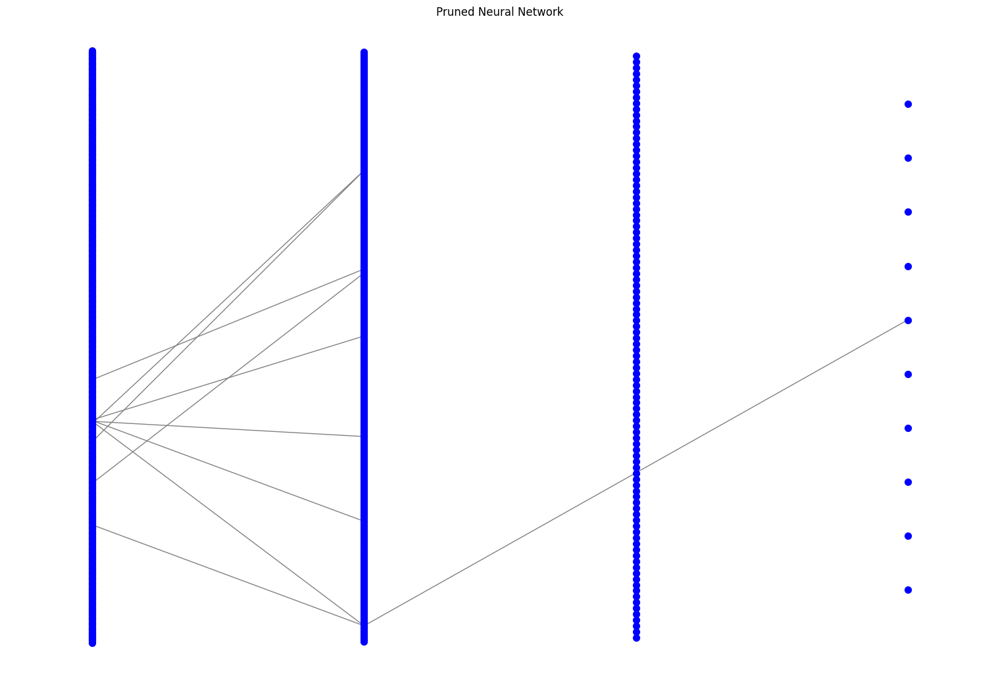

In [ ]:
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
train(model,criterion,optimizer,train_loader,val_loader,epochs=1)
masks = prune_by_percentage_global(model, 99.995)
print_and_plot_unpruned_proportions_by_layer(model,masks)
visualize_MNIST_layer_weights(model, masks)
visualize_pruned_network(masks)

## Repeating main experiments
1. Low mag, same init
2. Low mag, reinit
3. Random prune (same or reinit?)
4. Low mag, same init global
5. Low mag, reinit global

### Final Plot
Takeaway: same_init global > reinit global > same init ~ reinit > random

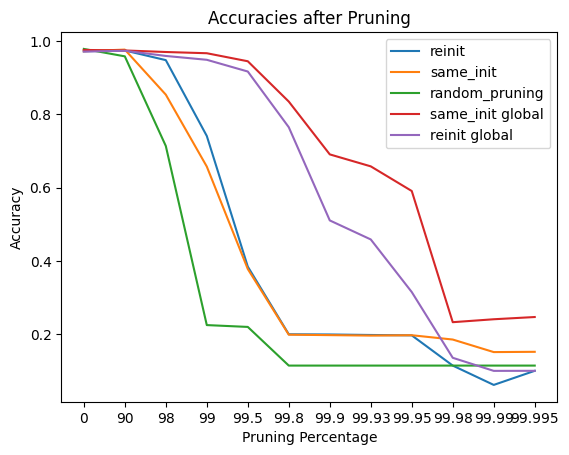

In [ ]:
reinitialized_accuracies = [0.9719166666666667, 0.974, 0.9476666666666667, 0.74075, 0.38425, 0.19966666666666666, 0.19916666666666666, 0.19775, 0.19675, 0.11425, 0.0615]
same_init_accuracies = [0.972, 0.9764166666666667, 0.8535, 0.65725, 0.37775, 0.19858333333333333, 0.19733333333333333, 0.19608333333333333, 0.19708333333333333, 0.18533333333333332, 0.15108333333333332, 0.15183333333333332]
random_pruning_accs = [0.97825, 0.958, 0.7134166666666667, 0.22475, 0.21975, 0.11425, 0.11425, 0.11425, 0.11425, 0.11425, 0.11425, 0.11425]

same_init_global_prune_accuracies = [0.9755, 0.9740833333333333, 0.9698333333333333, 0.9665, 0.9445833333333333, 0.8345833333333333, 0.6905, 0.6578333333333334, 0.5905833333333333, 0.23266666666666666, 0.24066666666666667, 0.24675]
reinitialized_global_prune_accuracies = [0.971, 0.97325, 0.9590833333333333, 0.9485833333333333, 0.9165833333333333, 0.7645833333333333, 0.5103333333333333, 0.45841666666666664, 0.3149166666666667, 0.1355, 0.09983333333333333]

pruning_percentages = [0,90,98,99,99.5,99.8,99.9, 99.93, 99.95, 99.98, 99.99, 99.995]

for accuracies_list in [reinitialized_accuracies, same_init_accuracies, random_pruning_accs, same_init_global_prune_accuracies, reinitialized_global_prune_accuracies]:
    while len(accuracies_list) < len(pruning_percentages):
        accuracies_list.append(0.1)

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,reinitialized_accuracies, label="reinit")
plt.plot(pruning_percentages_as_strs,same_init_accuracies, label="same_init")
plt.plot(pruning_percentages_as_strs,random_pruning_accs, label="random_pruning")
plt.plot(pruning_percentages_as_strs,same_init_global_prune_accuracies, label="same_init global")
plt.plot(pruning_percentages_as_strs,reinitialized_global_prune_accuracies, label="reinit global")
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.legend()
plt.show()

### Experiments

Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Initial Accuracy: 97.20%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%

Pruning 90% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 90% pruning: 97.64%
Total weights: 266610
Zero weights: 239580
Percentage of pruned weights: 89.86%
All accuracies so far: [0.972, 0.9764166666666667]

Pruning 98% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 98% pruning: 85.35%
Total weights: 266610
Zero weights: 260876
Percentage of pruned weights: 97.85%
All accuracies so far: [0.972, 0.9764166666666667, 0.8535]

Pruning 99% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99% pruning: 65.72%
Total weights: 266610
Zero weights: 263538
Percentage of pruned weights: 98.85%
All accuracies so far: [0.972, 0.9764166666666667, 0.8535, 0.65725]

Pruning 99.5% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.5% pruning: 37.77%
Total weights: 266610
Zero weights: 264869
Percentage of pruned weights: 99.35%
All accuracies so far: [0.972, 0.9764166666666667, 0.8535, 0.65725, 0.37775]

Pruning 99.8% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.8% pruning: 19.86%
Total weights: 266610
Zero weights: 265667
Percentage of pruned weights: 99.65%
All accuracies so far: [0.972, 0.9764166666666667, 0.8535, 0.65725, 0.37775, 0.19858333333333333]

Pruning 99.9% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.9% pruning: 19.73%
Total weights: 266610
Zero weights: 265933
Percentage of pruned weights: 99.75%
All accuracies so far: [0.972, 0.9764166666666667, 0.8535, 0.65725, 0.37775, 0.19858333333333333, 0.19733333333333333]

Pruning 99.93% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.93% pruning: 19.61%
Total weights: 266610
Zero weights: 266013
Percentage of pruned weights: 99.78%
All accuracies so far: [0.972, 0.9764166666666667, 0.8535, 0.65725, 0.37775, 0.19858333333333333, 0.19733333333333333, 0.19608333333333333]

Pruning 99.95% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.95% pruning: 19.71%
Total weights: 266610
Zero weights: 266066
Percentage of pruned weights: 99.80%
All accuracies so far: [0.972, 0.9764166666666667, 0.8535, 0.65725, 0.37775, 0.19858333333333333, 0.19733333333333333, 0.19608333333333333, 0.19708333333333333]

Pruning 99.98% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.98% pruning: 18.53%
Total weights: 266610
Zero weights: 266145
Percentage of pruned weights: 99.83%
All accuracies so far: [0.972, 0.9764166666666667, 0.8535, 0.65725, 0.37775, 0.19858333333333333, 0.19733333333333333, 0.19608333333333333, 0.19708333333333333, 0.18533333333333332]

Pruning 99.99% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.99% pruning: 15.11%
Total weights: 266610
Zero weights: 266172
Percentage of pruned weights: 99.84%
All accuracies so far: [0.972, 0.9764166666666667, 0.8535, 0.65725, 0.37775, 0.19858333333333333, 0.19733333333333333, 0.19608333333333333, 0.19708333333333333, 0.18533333333333332, 0.15108333333333332]

Pruning 99.995% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.995% pruning: 15.18%
Total weights: 266610
Zero weights: 266185
Percentage of pruned weights: 99.84%
All accuracies so far: [0.972, 0.9764166666666667, 0.8535, 0.65725, 0.37775, 0.19858333333333333, 0.19733333333333333, 0.19608333333333333, 0.19708333333333333, 0.18533333333333332, 0.15108333333333332, 0.15183333333333332]
all_accuracies = [0.972, 0.9764166666666667, 0.8535, 0.65725, 0.37775, 0.19858333333333333, 0.19733333333333333, 0.19608333333333333, 0.19708333333333333, 0.18533333333333332, 0.15108333333333332, 0.15183333333333332]


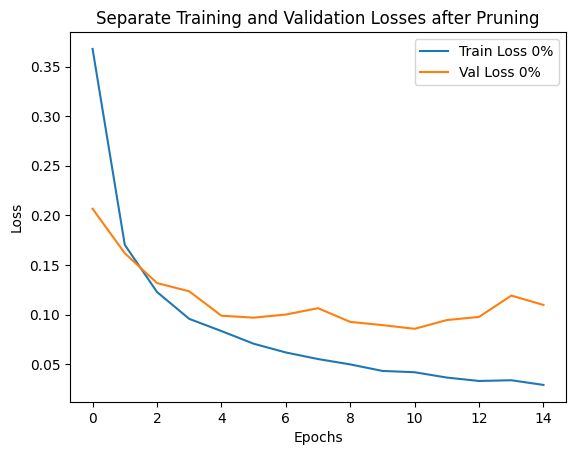

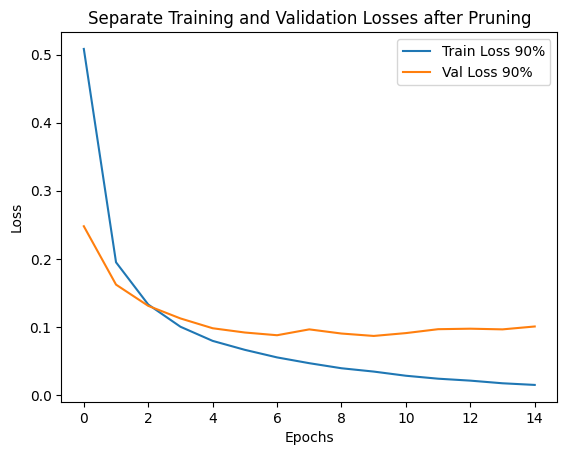

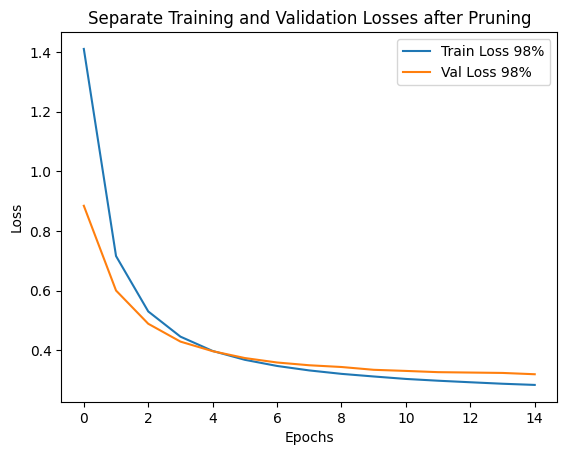

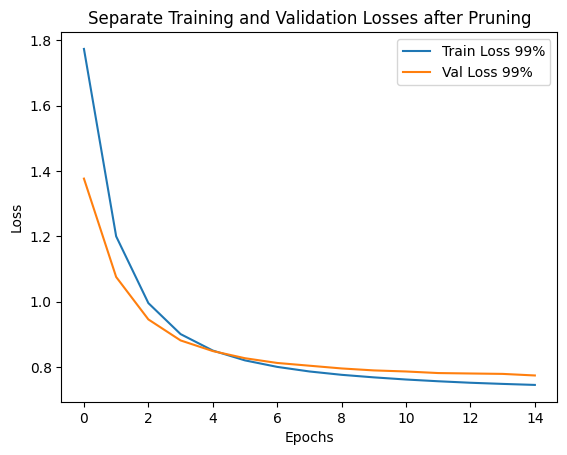

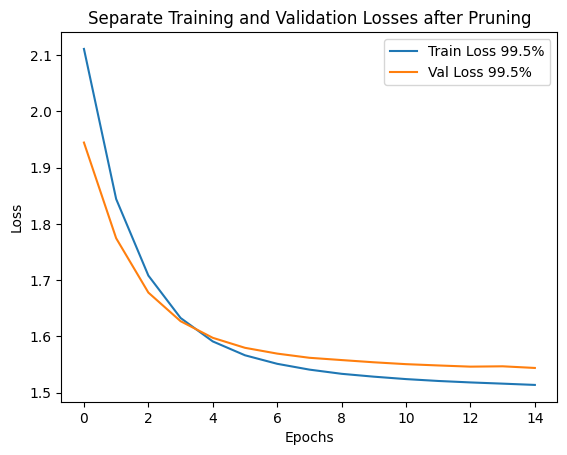

...

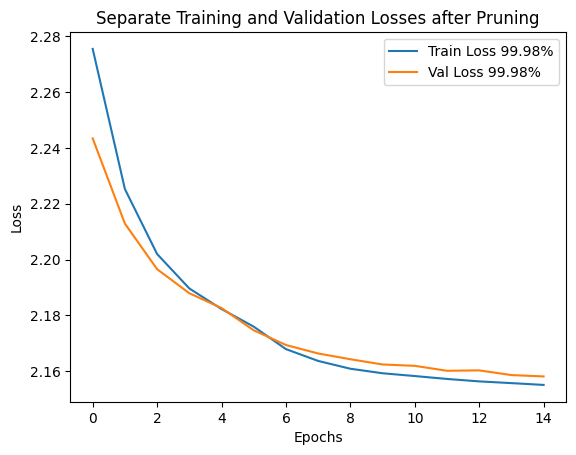

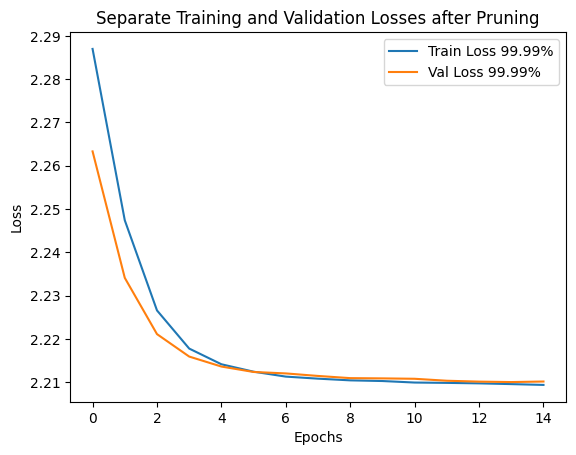

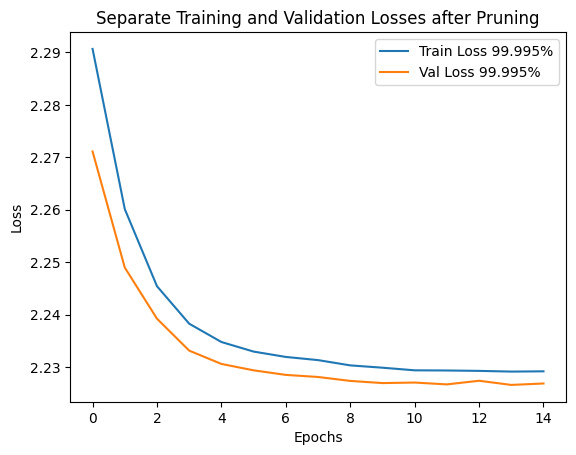

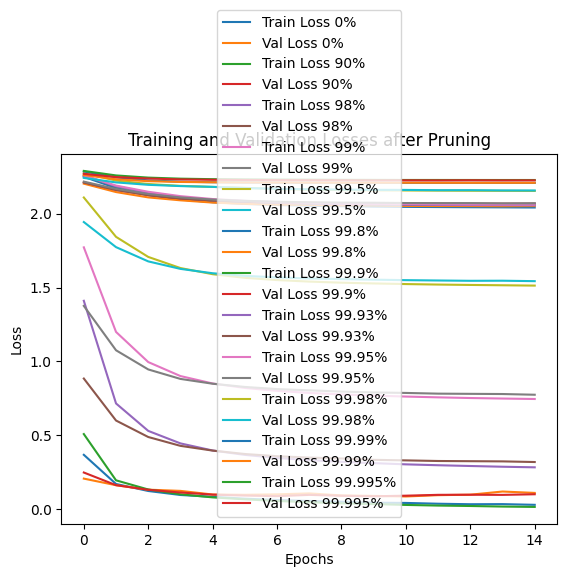

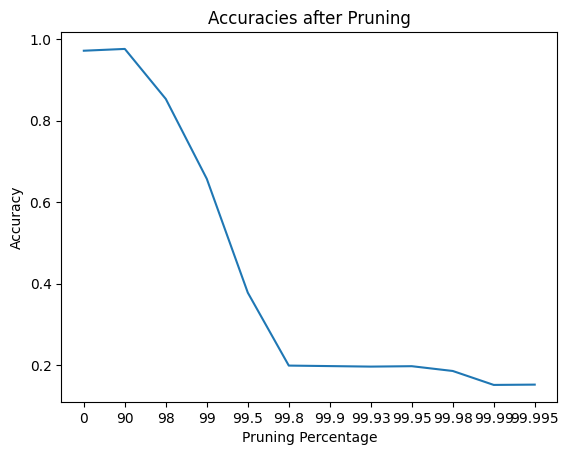

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
pruning_percentages = [0,90,98,99,99.5,99.8,99.9, 99.93, 99.95, 99.98, 99.99, 99.995]
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

# all_accuracies.append(.105666666667) # Used for initial testing, to skip all the pruning steps

for percent in pruning_percentages[1:]:
    if all_accuracies[-1] >= 0.11:
        print(f"\nPruning {percent}% of the weights")

        # Prune the current model
        masks = prune_by_percentage(current_model, percent)

        # Initialize a new model and retrain with masks
        new_model = MLP().to(device)
        optimizer = optim.Adam(new_model.parameters(), lr=0.001)
        # compare_models(new_model,current_model, masks, initial_state)
        retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15)

        # Evaluate the retrained model
        retrained_accuracy = evaluate(retrained_model, val_loader)
        print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
        verify_pruned_model(retrained_model)

        # Save results
        all_train_losses.append(retrain_train_losses)
        all_val_losses.append(retrain_val_losses)
        all_accuracies.append(retrained_accuracy)
        print(f"All accuracies so far: {all_accuracies}")


        # Prepare for the next iteration
        current_model = retrained_model

while len(all_accuracies) < len(pruning_percentages):
    all_accuracies.append(0.1)

print(f"all_accuracies = {all_accuracies}")

# Plot the training and validation losses for each iteration
for i in range(len(all_train_losses)):
    plt.plot(all_train_losses[i], label=f'Train Loss {pruning_percentages[i]}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {pruning_percentages[i]}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i in range(len(all_train_losses)):
    percent = pruning_percentages[i]
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Initial Accuracy: 97.19%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%

Pruning 90% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 90% pruning: 97.40%
Total weights: 266610
Zero weights: 239580
Percentage of pruned weights: 89.86%
All accuracies so far: [0.9719166666666667, 0.974]

Pruning 98% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 98% pruning: 94.77%
Total weights: 266610
Zero weights: 260876
Percentage of pruned weights: 97.85%
All accuracies so far: [0.9719166666666667, 0.974, 0.9476666666666667]

Pruning 99% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99% pruning: 74.08%
Total weights: 266610
Zero weights: 263538
Percentage of pruned weights: 98.85%
All accuracies so far: [0.9719166666666667, 0.974, 0.9476666666666667, 0.74075]

Pruning 99.5% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.5% pruning: 38.42%
Total weights: 266610
Zero weights: 264869
Percentage of pruned weights: 99.35%
All accuracies so far: [0.9719166666666667, 0.974, 0.9476666666666667, 0.74075, 0.38425]

Pruning 99.8% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.8% pruning: 19.97%
Total weights: 266610
Zero weights: 265667
Percentage of pruned weights: 99.65%
All accuracies so far: [0.9719166666666667, 0.974, 0.9476666666666667, 0.74075, 0.38425, 0.19966666666666666]

Pruning 99.9% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.9% pruning: 19.92%
Total weights: 266610
Zero weights: 265933
Percentage of pruned weights: 99.75%
All accuracies so far: [0.9719166666666667, 0.974, 0.9476666666666667, 0.74075, 0.38425, 0.19966666666666666, 0.19916666666666666]

Pruning 99.93% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.93% pruning: 19.78%
Total weights: 266610
Zero weights: 266013
Percentage of pruned weights: 99.78%
All accuracies so far: [0.9719166666666667, 0.974, 0.9476666666666667, 0.74075, 0.38425, 0.19966666666666666, 0.19916666666666666, 0.19775]

Pruning 99.95% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.95% pruning: 19.68%
Total weights: 266610
Zero weights: 266066
Percentage of pruned weights: 99.80%
All accuracies so far: [0.9719166666666667, 0.974, 0.9476666666666667, 0.74075, 0.38425, 0.19966666666666666, 0.19916666666666666, 0.19775, 0.19675]

Pruning 99.98% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.98% pruning: 11.43%
Total weights: 266610
Zero weights: 266145
Percentage of pruned weights: 99.83%
All accuracies so far: [0.9719166666666667, 0.974, 0.9476666666666667, 0.74075, 0.38425, 0.19966666666666666, 0.19916666666666666, 0.19775, 0.19675, 0.11425]

Pruning 99.99% of the weights
Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.99% pruning: 6.15%
Total weights: 266610
Zero weights: 266172
Percentage of pruned weights: 99.84%
All accuracies so far: [0.9719166666666667, 0.974, 0.9476666666666667, 0.74075, 0.38425, 0.19966666666666666, 0.19916666666666666, 0.19775, 0.19675, 0.11425, 0.0615]


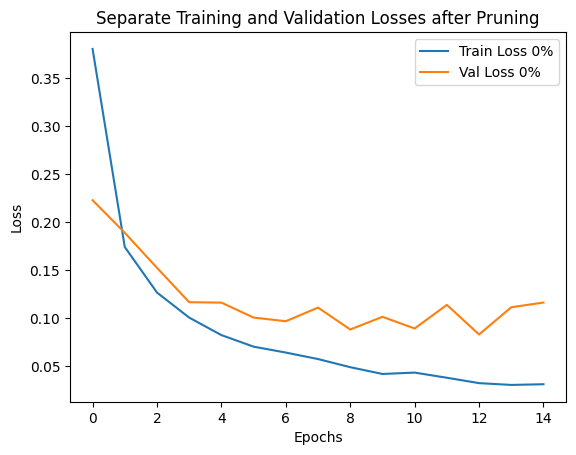

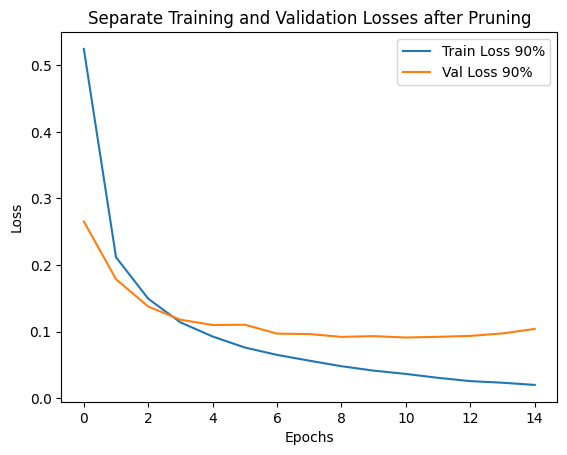

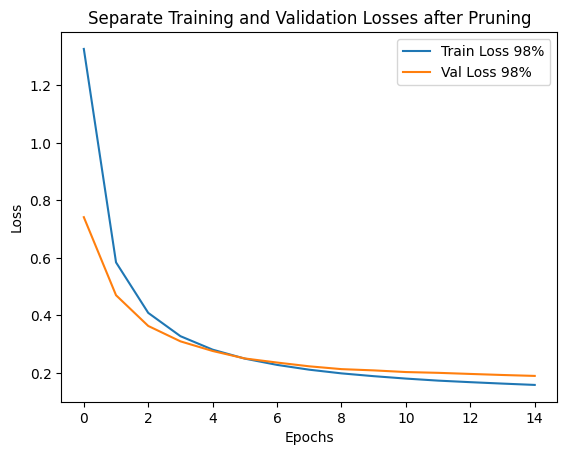

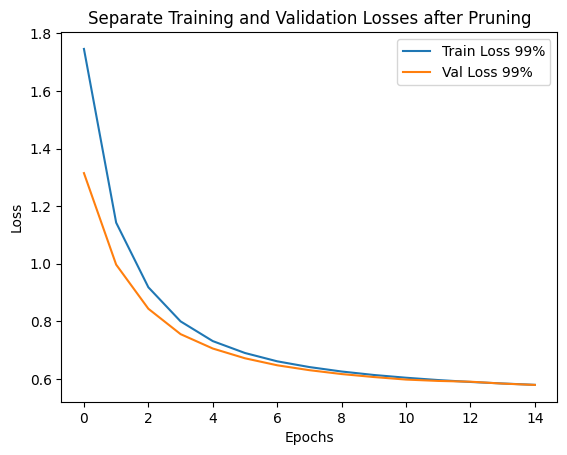

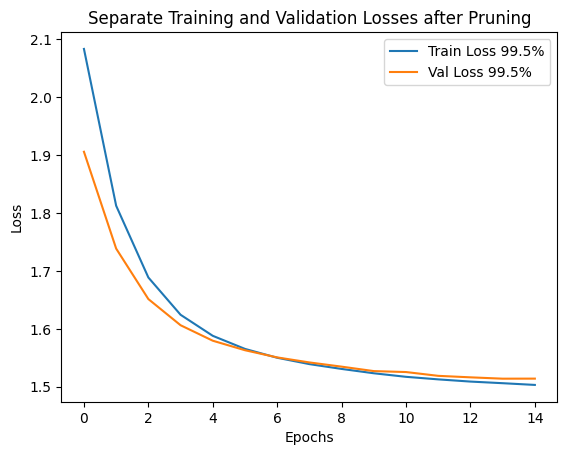

...

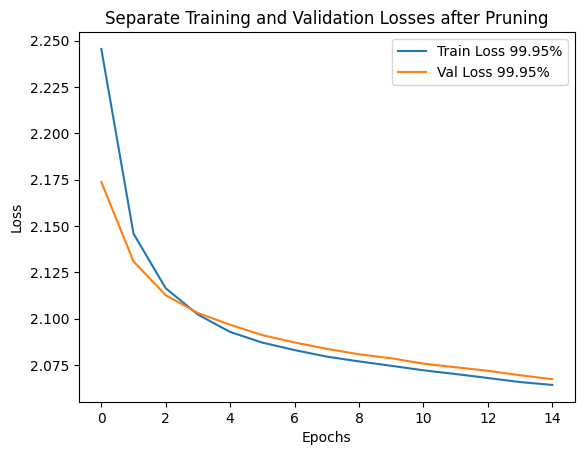

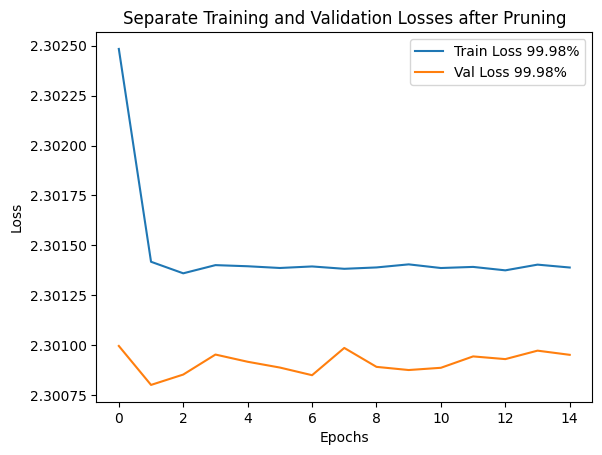

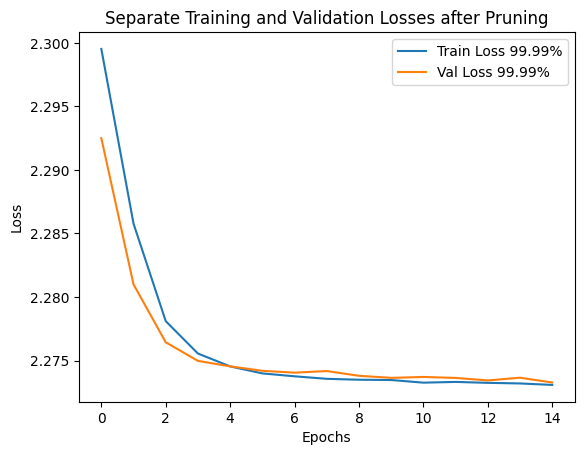

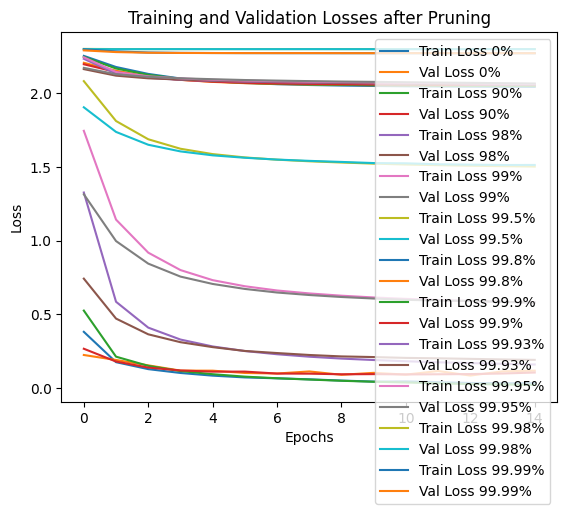

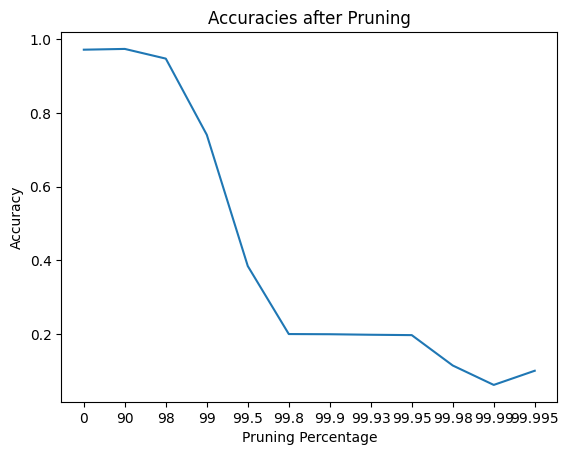

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
pruning_percentages = [0,90,98,99,99.5,99.8,99.9, 99.93, 99.95, 99.98, 99.99, 99.995]
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    if all_accuracies[-1] >= 0.11:
        print(f"\nPruning {percent}% of the weights")

        # Prune the current model
        masks = prune_by_percentage(current_model, percent)

        # Initialize a new model and retrain with masks
        new_model = MLP().to(device)
        optimizer = optim.Adam(new_model.parameters(), lr=0.001)
        # compare_models(new_model,current_model, masks, initial_state)
        retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15, rerandomize_initialization=True)

        # Evaluate the retrained model
        retrained_accuracy = evaluate(retrained_model, val_loader)
        print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
        verify_pruned_model(retrained_model)

        # Save results
        all_train_losses.append(retrain_train_losses)
        all_val_losses.append(retrain_val_losses)
        all_accuracies.append(retrained_accuracy)
        print(f"All accuracies so far: {all_accuracies}")

        # Prepare for the next iteration
        current_model = retrained_model

while len(all_accuracies) < len(pruning_percentages):
    all_accuracies.append(0.1)

# Plot the training and validation losses for each iteration
for i in range(len(all_train_losses)):
    plt.plot(all_train_losses[i], label=f'Train Loss {pruning_percentages[i]}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {pruning_percentages[i]}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i in range(len(all_train_losses)):
    percent = pruning_percentages[i]
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Initial Accuracy: 97.82%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%

Pruning 90% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 90% pruning: 95.80%
Total weights: 266610
Zero weights: 239580
Percentage of pruned weights: 89.86%
All accuracies so far: [0.97825, 0.958]

Pruning 98% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 98% pruning: 71.34%
Total weights: 266610
Zero weights: 260876
Percentage of pruned weights: 97.85%
All accuracies so far: [0.97825, 0.958, 0.7134166666666667]

Pruning 99% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99% pruning: 22.48%
Total weights: 266610
Zero weights: 263538
Percentage of pruned weights: 98.85%
All accuracies so far: [0.97825, 0.958, 0.7134166666666667, 0.22475]

Pruning 99.5% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.5% pruning: 21.98%
Total weights: 266610
Zero weights: 264869
Percentage of pruned weights: 99.35%
All accuracies so far: [0.97825, 0.958, 0.7134166666666667, 0.22475, 0.21975]

Pruning 99.8% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.8% pruning: 11.43%
Total weights: 266610
Zero weights: 265667
Percentage of pruned weights: 99.65%
All accuracies so far: [0.97825, 0.958, 0.7134166666666667, 0.22475, 0.21975, 0.11425]

Pruning 99.9% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.9% pruning: 11.43%
Total weights: 266610
Zero weights: 265933
Percentage of pruned weights: 99.75%
All accuracies so far: [0.97825, 0.958, 0.7134166666666667, 0.22475, 0.21975, 0.11425, 0.11425]

Pruning 99.93% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.93% pruning: 11.43%
Total weights: 266610
Zero weights: 266013
Percentage of pruned weights: 99.78%
All accuracies so far: [0.97825, 0.958, 0.7134166666666667, 0.22475, 0.21975, 0.11425, 0.11425, 0.11425]

Pruning 99.95% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.95% pruning: 11.43%
Total weights: 266610
Zero weights: 266066
Percentage of pruned weights: 99.80%
All accuracies so far: [0.97825, 0.958, 0.7134166666666667, 0.22475, 0.21975, 0.11425, 0.11425, 0.11425, 0.11425]

Pruning 99.98% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.98% pruning: 11.43%
Total weights: 266610
Zero weights: 266145
Percentage of pruned weights: 99.83%
All accuracies so far: [0.97825, 0.958, 0.7134166666666667, 0.22475, 0.21975, 0.11425, 0.11425, 0.11425, 0.11425, 0.11425]

Pruning 99.99% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.99% pruning: 11.43%
Total weights: 266610
Zero weights: 266171
Percentage of pruned weights: 99.84%
All accuracies so far: [0.97825, 0.958, 0.7134166666666667, 0.22475, 0.21975, 0.11425, 0.11425, 0.11425, 0.11425, 0.11425, 0.11425]

Pruning 99.995% of the weights
Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.995% pruning: 11.43%
Total weights: 266610
Zero weights: 266185
Percentage of pruned weights: 99.84%
All accuracies so far: [0.97825, 0.958, 0.7134166666666667, 0.22475, 0.21975, 0.11425, 0.11425, 0.11425, 0.11425, 0.11425, 0.11425, 0.11425]


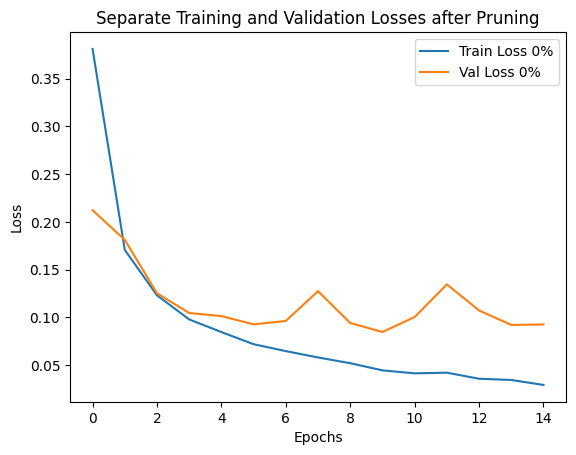

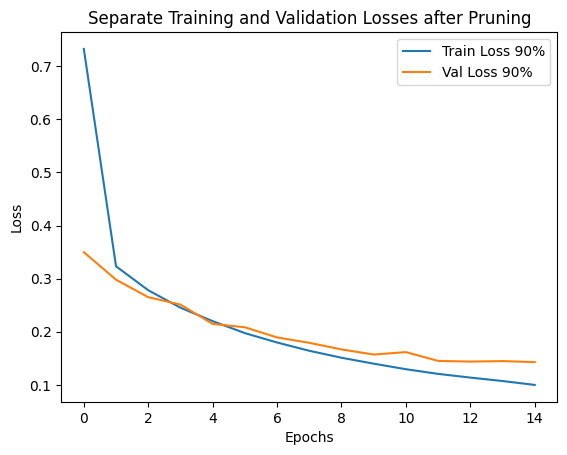

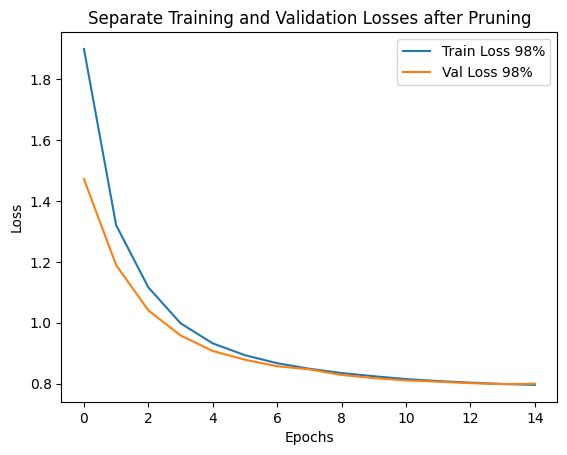

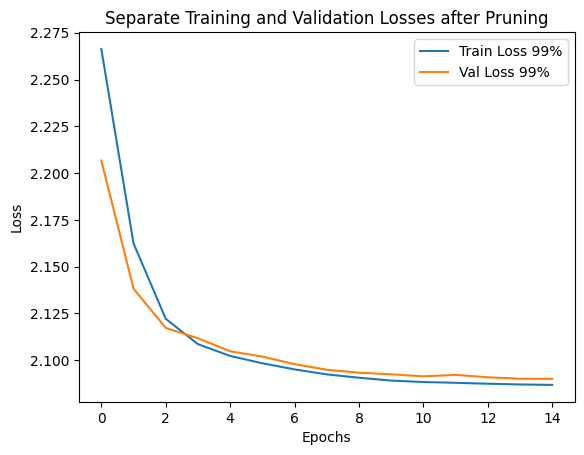

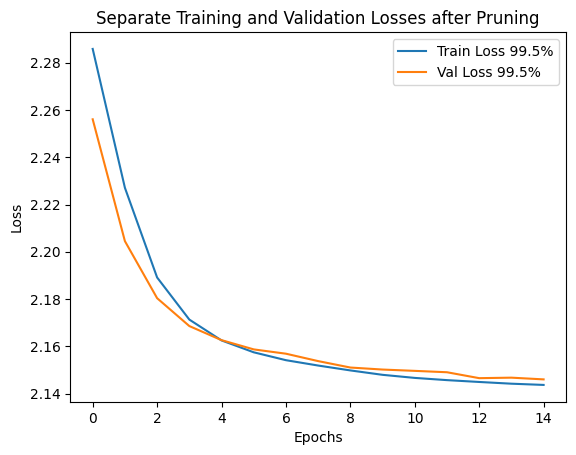

...

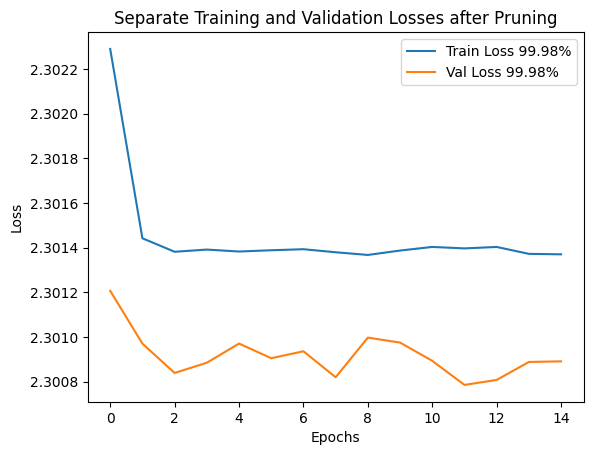

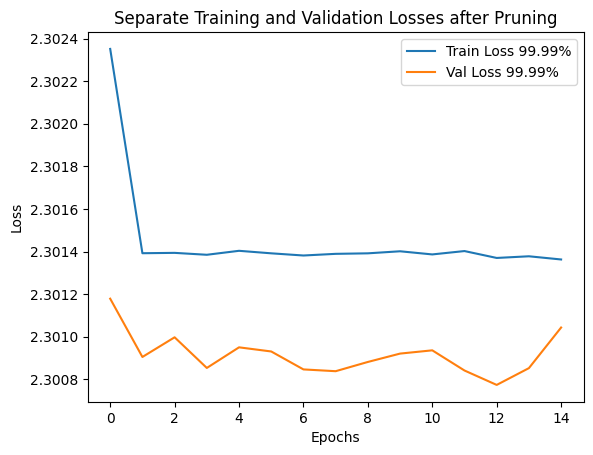

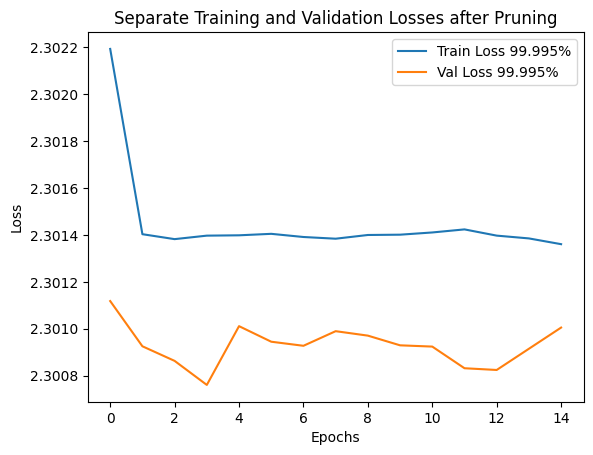

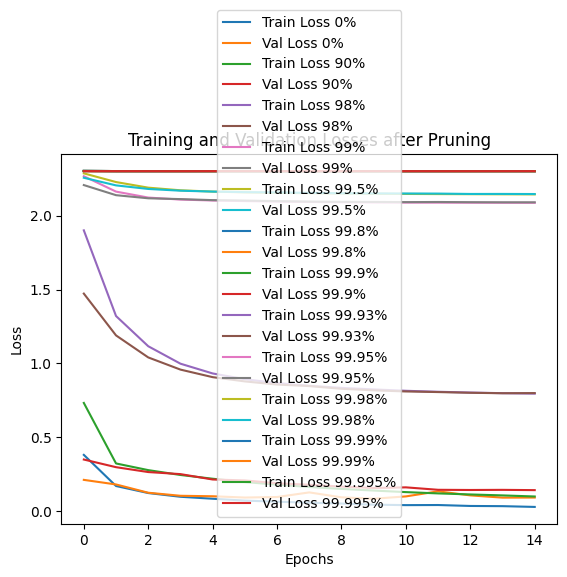

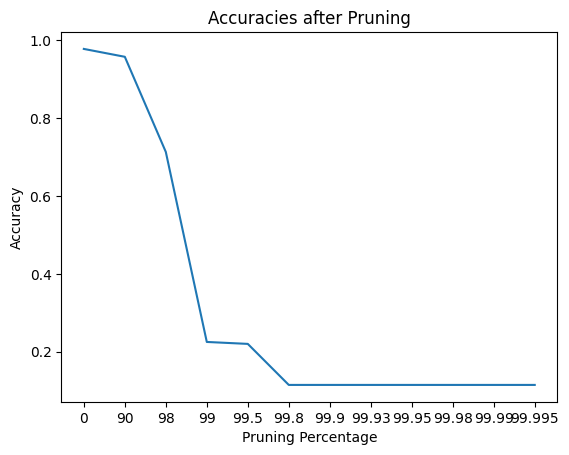

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
pruning_percentages = [0,90,98,99,99.5,99.8,99.9, 99.93, 99.95, 99.98, 99.99, 99.995]
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    if all_accuracies[-1] >= 0.11:
        print(f"\nPruning {percent}% of the weights")

        # Prune the current model
        masks = prune_randomly(current_model, percent)

        # Initialize a new model and retrain with masks
        new_model = MLP().to(device)
        optimizer = optim.Adam(new_model.parameters(), lr=0.001)
        # compare_models(new_model,current_model, masks, initial_state)
        retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15)

        # Evaluate the retrained model
        retrained_accuracy = evaluate(retrained_model, val_loader)
        print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
        verify_pruned_model(retrained_model)

        # Save results
        all_train_losses.append(retrain_train_losses)
        all_val_losses.append(retrain_val_losses)
        all_accuracies.append(retrained_accuracy)
        print(f"All accuracies so far: {all_accuracies}")

        # Prepare for the next iteration
        current_model = retrained_model

while len(all_accuracies) < len(pruning_percentages):
    all_accuracies.append(0.1)

# Plot the training and validation losses for each iteration
for i in range(len(all_train_losses)):
    plt.plot(all_train_losses[i], label=f'Train Loss {pruning_percentages[i]}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {pruning_percentages[i]}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i in range(len(all_train_losses)):
    percent = pruning_percentages[i]
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Initial Accuracy: 97.55%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%

Pruning 90% of the weights
pruned_proportions=[0.9042602040816327, 1.0, 0.8756333333333334, 0.73, 0.618, 0.7]


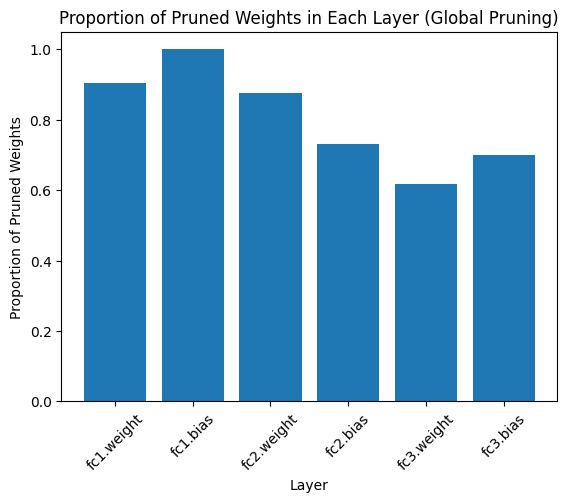

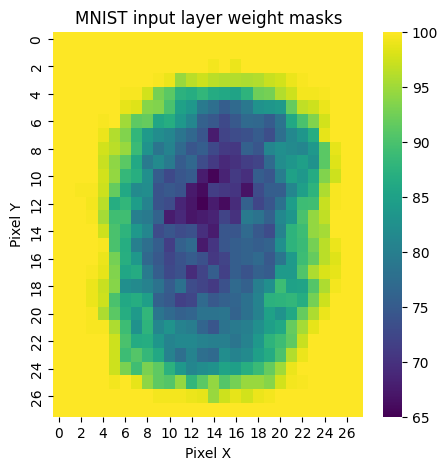

Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 90% pruning: 97.41%
Total weights: 266610
Zero weights: 239949
Percentage of pruned weights: 90.00%
All accuracies so far: [0.9755, 0.9740833333333333]

Pruning 98% of the weights
pruned_proportions=[0.9837329931972789, 1.0, 0.9591333333333333, 0.96, 0.724, 0.9]


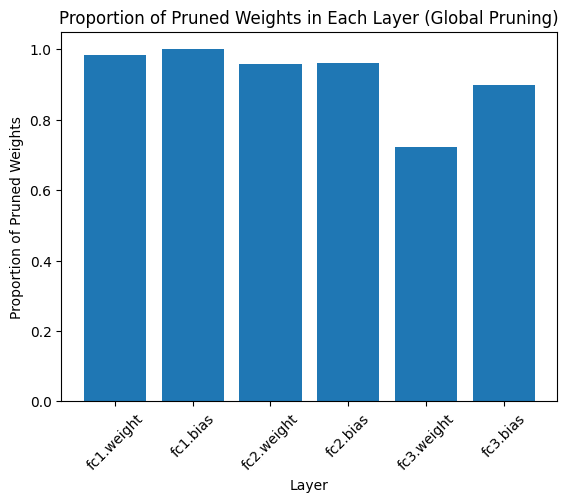

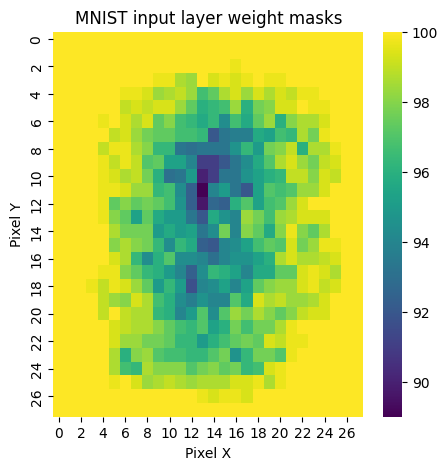

Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 98% pruning: 96.98%
Total weights: 266610
Zero weights: 261277
Percentage of pruned weights: 98.00%
All accuracies so far: [0.9755, 0.9740833333333333, 0.9698333333333333]

Pruning 99% of the weights
pruned_proportions=[0.9930527210884353, 1.0, 0.974, 0.96, 0.752, 0.9]


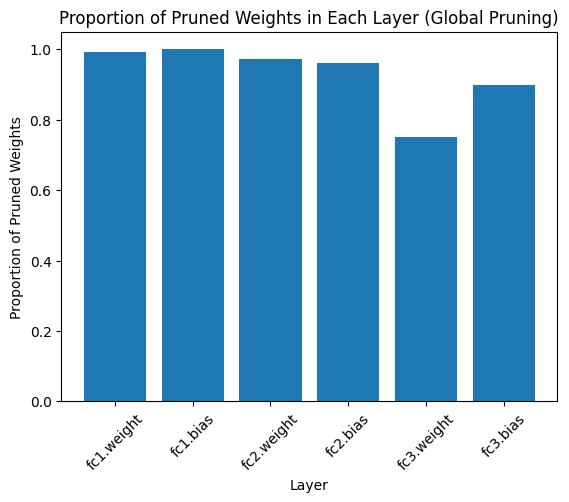

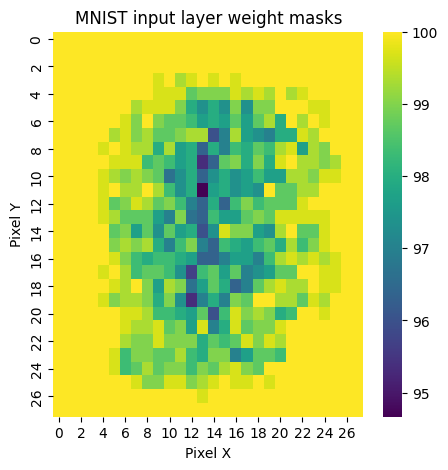

Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99% pruning: 96.65%
Total weights: 266610
Zero weights: 263943
Percentage of pruned weights: 99.00%
All accuracies so far: [0.9755, 0.9740833333333333, 0.9698333333333333, 0.9665]

Pruning 99.5% of the weights
pruned_proportions=[0.9973044217687075, 1.0, 0.9837333333333333, 0.97, 0.792, 0.9]


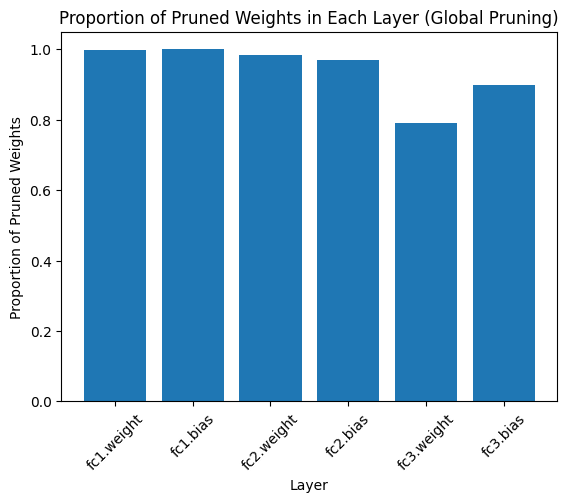

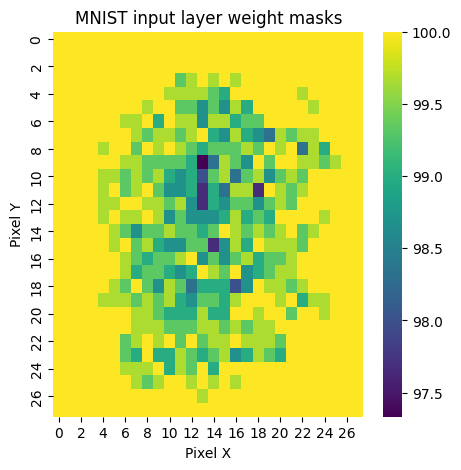

Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.5% pruning: 94.46%
Total weights: 266610
Zero weights: 265276
Percentage of pruned weights: 99.50%
All accuracies so far: [0.9755, 0.9740833333333333, 0.9698333333333333, 0.9665, 0.9445833333333333]

Pruning 99.8% of the weights
pruned_proportions=[0.9992049319727891, 1.0, 0.9927333333333334, 1.0, 0.871, 1.0]


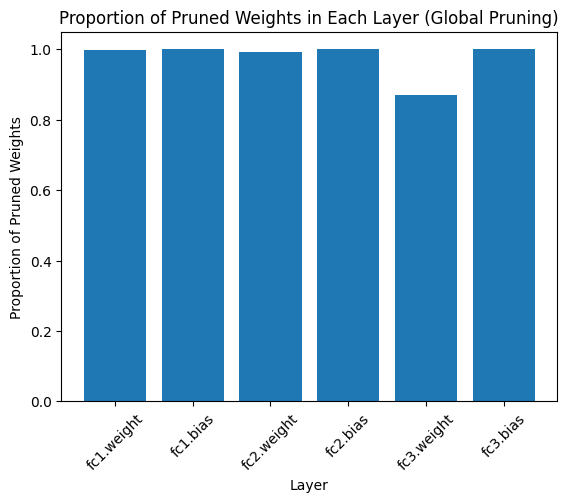

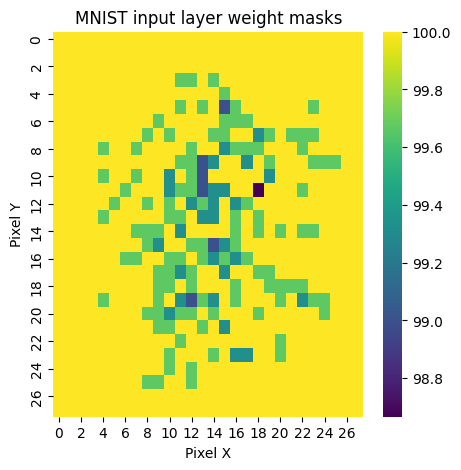

Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.8% pruning: 83.46%
Total weights: 266610
Zero weights: 266076
Percentage of pruned weights: 99.80%
All accuracies so far: [0.9755, 0.9740833333333333, 0.9698333333333333, 0.9665, 0.9445833333333333, 0.8345833333333333]

Pruning 99.9% of the weights
pruned_proportions=[0.9996130952380953, 1.0, 0.9965666666666667, 1.0, 0.927, 1.0]


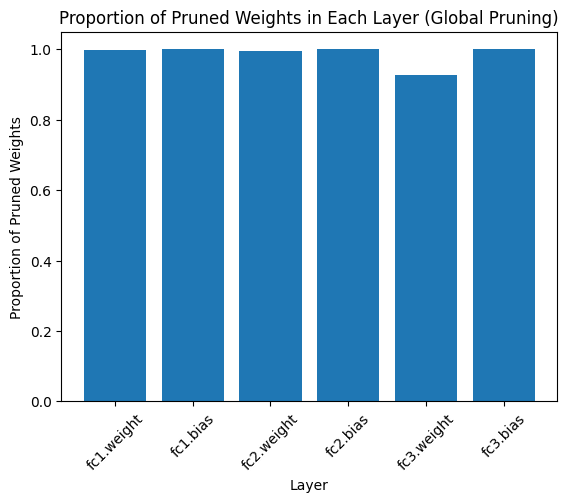

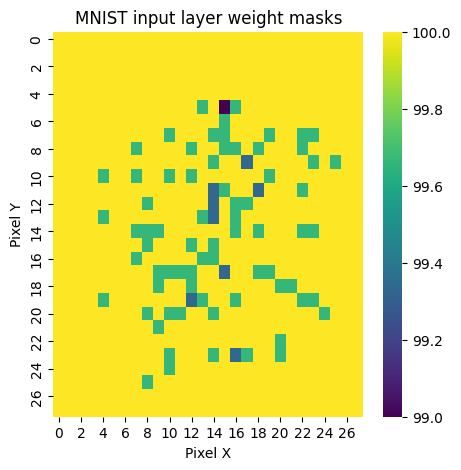

Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.9% pruning: 69.05%
Total weights: 266610
Zero weights: 266343
Percentage of pruned weights: 99.90%
All accuracies so far: [0.9755, 0.9740833333333333, 0.9698333333333333, 0.9665, 0.9445833333333333, 0.8345833333333333, 0.6905]

Pruning 99.93% of the weights
pruned_proportions=[0.9997108843537414, 1.0, 0.9977666666666667, 1.0, 0.948, 1.0]


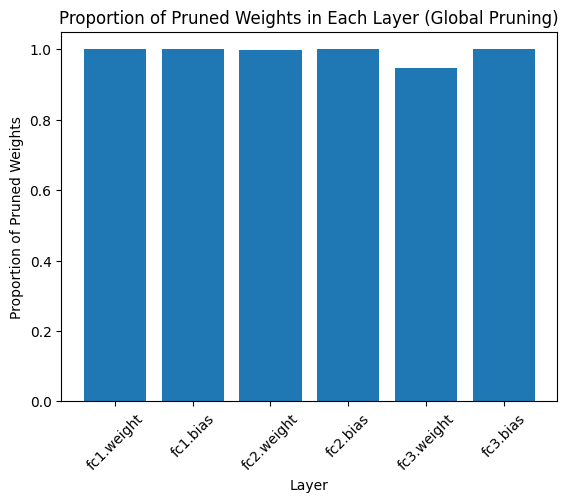

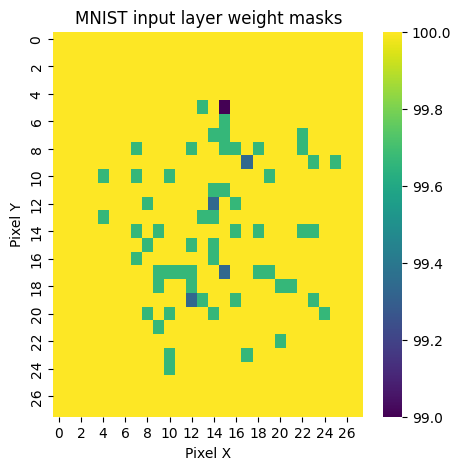

Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.93% pruning: 65.78%
Total weights: 266610
Zero weights: 266423
Percentage of pruned weights: 99.93%
All accuracies so far: [0.9755, 0.9740833333333333, 0.9698333333333333, 0.9665, 0.9445833333333333, 0.8345833333333333, 0.6905, 0.6578333333333334]

Pruning 99.95% of the weights
pruned_proportions=[0.9997959183673469, 1.0, 0.9984333333333333, 1.0, 0.961, 1.0]


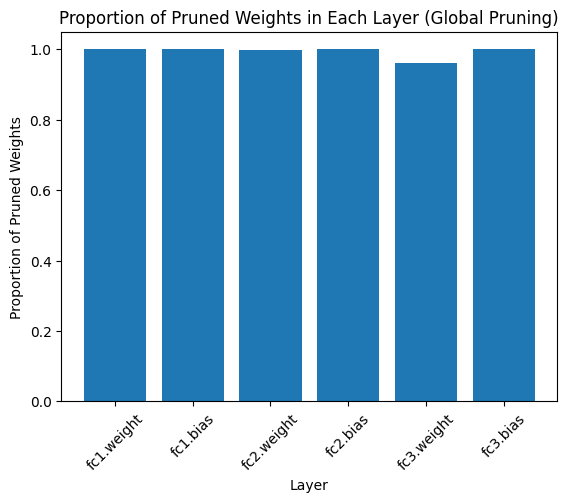

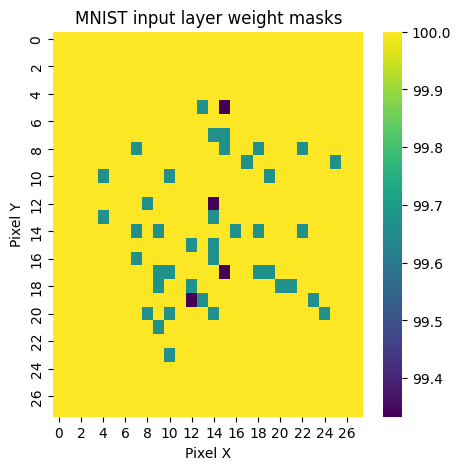

Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.95% pruning: 59.06%
Total weights: 266610
Zero weights: 266476
Percentage of pruned weights: 99.95%
All accuracies so far: [0.9755, 0.9740833333333333, 0.9698333333333333, 0.9665, 0.9445833333333333, 0.8345833333333333, 0.6905, 0.6578333333333334, 0.5905833333333333]

Pruning 99.98% of the weights
pruned_proportions=[0.9999404761904762, 1.0, 0.9993666666666666, 1.0, 0.979, 1.0]


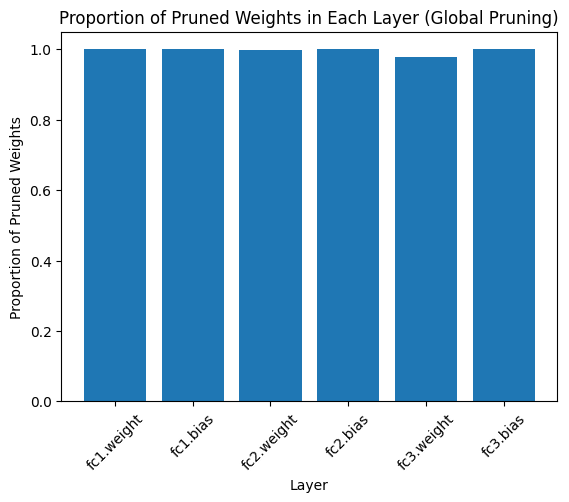

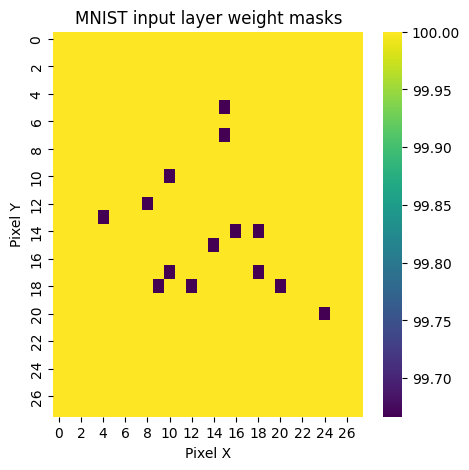

Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.98% pruning: 23.27%
Total weights: 266610
Zero weights: 266556
Percentage of pruned weights: 99.98%
All accuracies so far: [0.9755, 0.9740833333333333, 0.9698333333333333, 0.9665, 0.9445833333333333, 0.8345833333333333, 0.6905, 0.6578333333333334, 0.5905833333333333, 0.23266666666666666]

Pruning 99.99% of the weights
pruned_proportions=[0.9999617346938775, 1.0, 0.9996666666666667, 1.0, 0.992, 1.0]


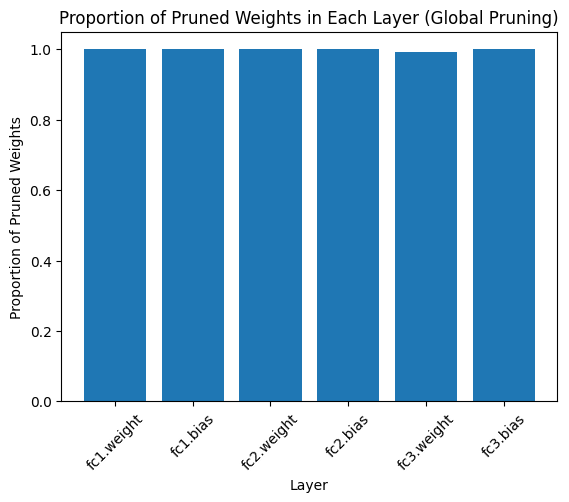

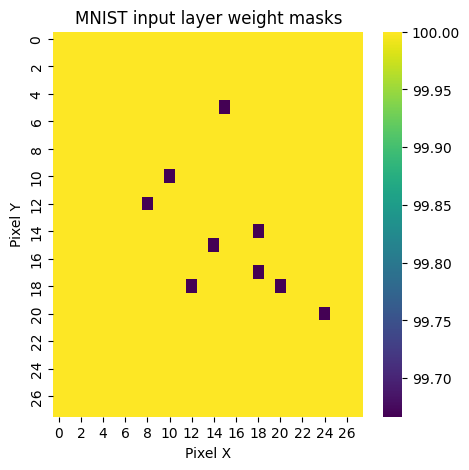

Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.99% pruning: 24.07%
Total weights: 266610
Zero weights: 266583
Percentage of pruned weights: 99.99%
All accuracies so far: [0.9755, 0.9740833333333333, 0.9698333333333333, 0.9665, 0.9445833333333333, 0.8345833333333333, 0.6905, 0.6578333333333334, 0.5905833333333333, 0.23266666666666666, 0.24066666666666667]

Pruning 99.995% of the weights
pruned_proportions=[0.9999787414965986, 1.0, 0.9998666666666667, 1.0, 0.995, 1.0]


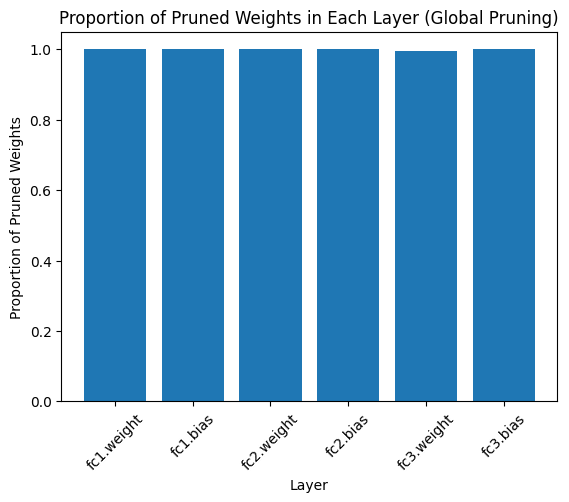

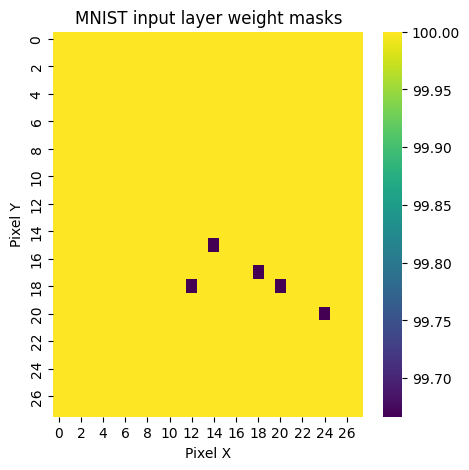

Initial state loaded


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.995% pruning: 24.68%
Total weights: 266610
Zero weights: 266596
Percentage of pruned weights: 99.99%
All accuracies so far: [0.9755, 0.9740833333333333, 0.9698333333333333, 0.9665, 0.9445833333333333, 0.8345833333333333, 0.6905, 0.6578333333333334, 0.5905833333333333, 0.23266666666666666, 0.24066666666666667, 0.24675]


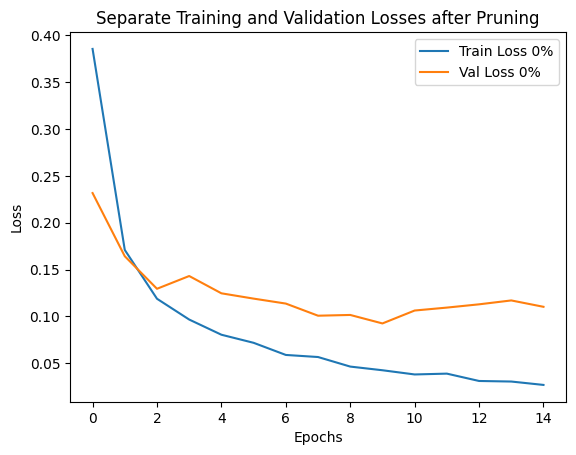

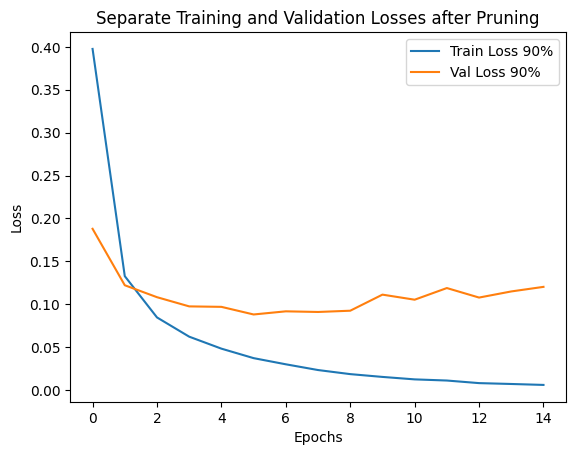

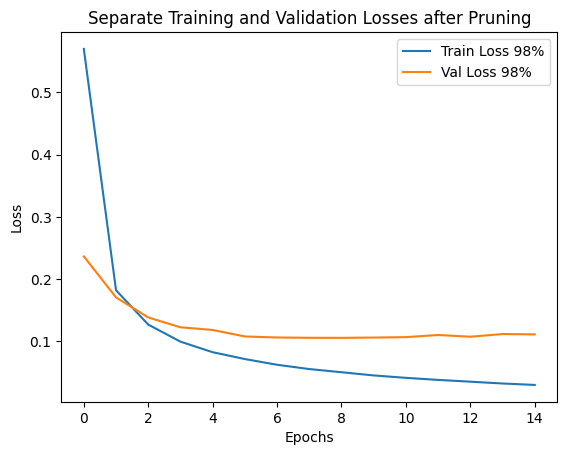

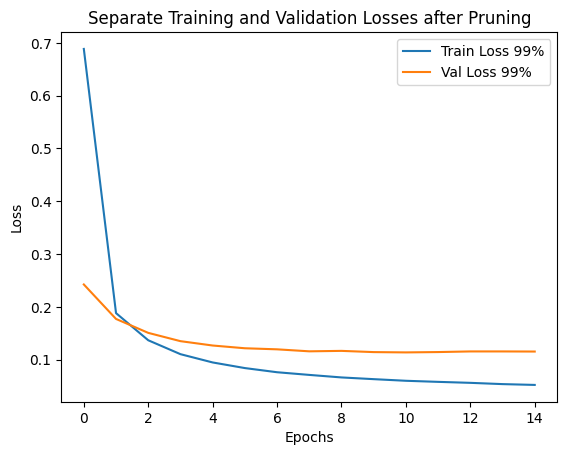

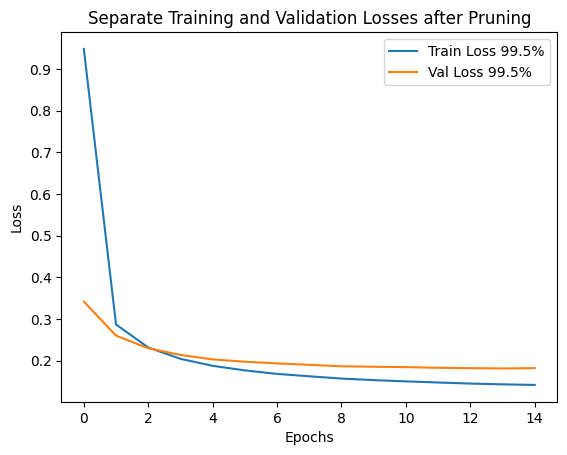

...

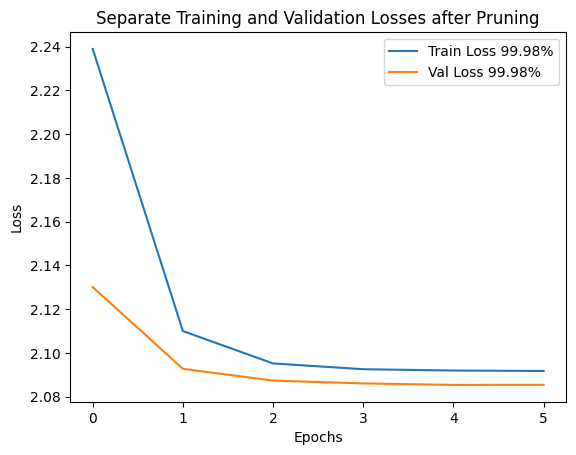

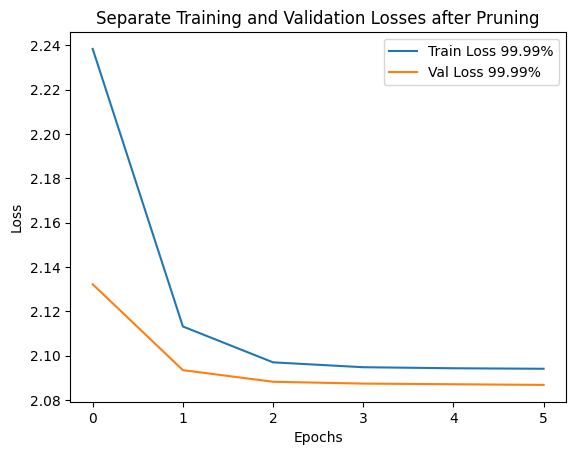

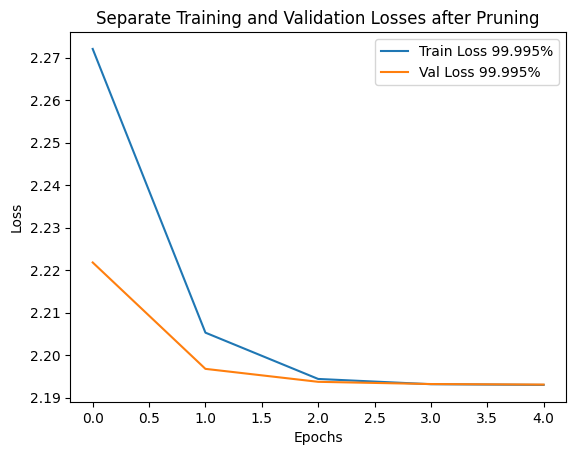

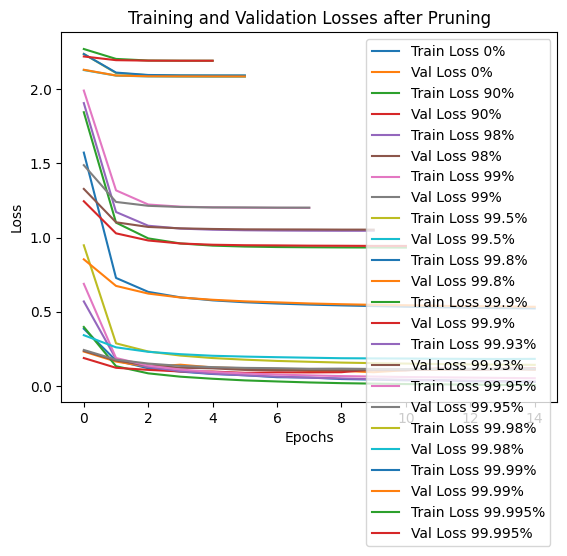

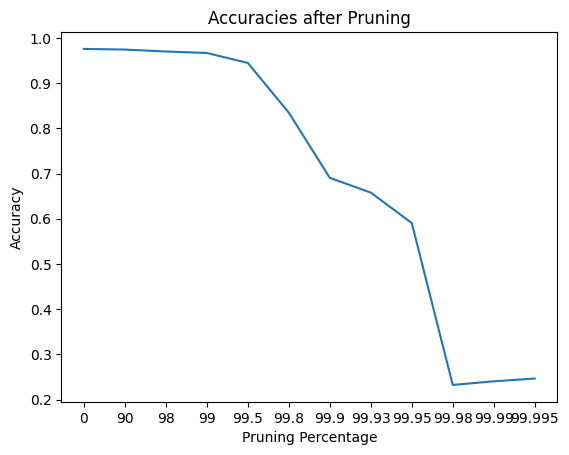

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
pruning_percentages = [0,90,98,99,99.5,99.8,99.9, 99.93, 99.95, 99.98, 99.99, 99.995]
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    if all_accuracies[-1] >= 0.11:
        print(f"\nPruning {percent}% of the weights")

        # Prune the current model
        masks = prune_by_percentage_global(current_model, percent)

        print_and_plot_unpruned_proportions_by_layer(current_model,masks)
        visualize_MNIST_layer_weights(current_model, masks)

        # Initialize a new model and retrain with masks
        new_model = MLP().to(device)
        optimizer = optim.Adam(new_model.parameters(), lr=0.001)
        # compare_models(new_model,current_model, masks, initial_state)
        retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15)

        # Evaluate the retrained model
        retrained_accuracy = evaluate(retrained_model, val_loader)
        print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
        verify_pruned_model(retrained_model)

        # Save results
        all_train_losses.append(retrain_train_losses)
        all_val_losses.append(retrain_val_losses)
        all_accuracies.append(retrained_accuracy)
        print(f"All accuracies so far: {all_accuracies}")

        # Prepare for the next iteration
        current_model = retrained_model

while len(all_accuracies) < len(pruning_percentages):
    all_accuracies.append(0.1)

# Plot the training and validation losses for each iteration
for i in range(len(all_train_losses)):
    plt.plot(all_train_losses[i], label=f'Train Loss {pruning_percentages[i]}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {pruning_percentages[i]}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i in range(len(all_train_losses)):
    percent = pruning_percentages[i]
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

# Percentage of pruned weights: 99.90%
# All accuracies so far: [0.9704166666666667, 0.9774166666666667, 0.9715, 0.9709166666666667, 0.9480833333333333, 0.8183333333333334, 0.7349166666666667] # Add results, but not a new 0% one. That's already here.

Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Initial Accuracy: 97.10%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%

Pruning 90% of the weights
pruned_proportions=[0.9038690476190476, 1.0, 0.8770333333333333, 0.75, 0.666, 0.7]


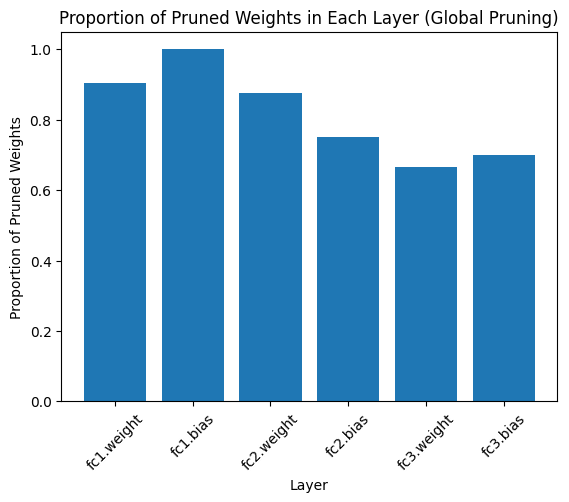

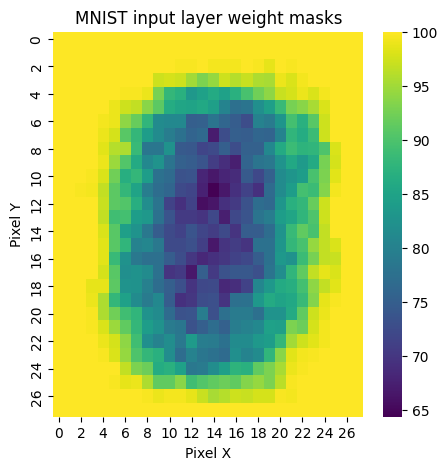

Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 90% pruning: 97.32%
Total weights: 266610
Zero weights: 239949
Percentage of pruned weights: 90.00%
All accuracies so far: [0.971, 0.97325]

Pruning 98% of the weights
pruned_proportions=[0.983014455782313, 1.0, 0.9619666666666666, 0.99, 0.805, 0.9]


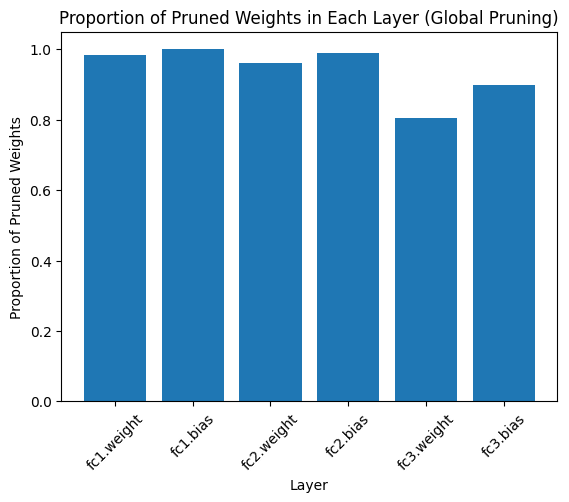

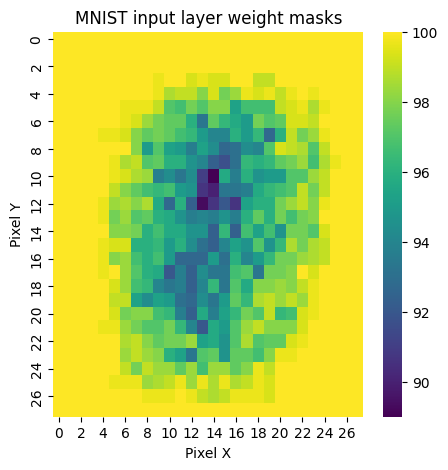

Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 98% pruning: 95.91%
Total weights: 266610
Zero weights: 261277
Percentage of pruned weights: 98.00%
All accuracies so far: [0.971, 0.97325, 0.9590833333333333]

Pruning 99% of the weights
pruned_proportions=[0.9922151360544218, 1.0, 0.9777333333333333, 0.99, 0.834, 0.9]


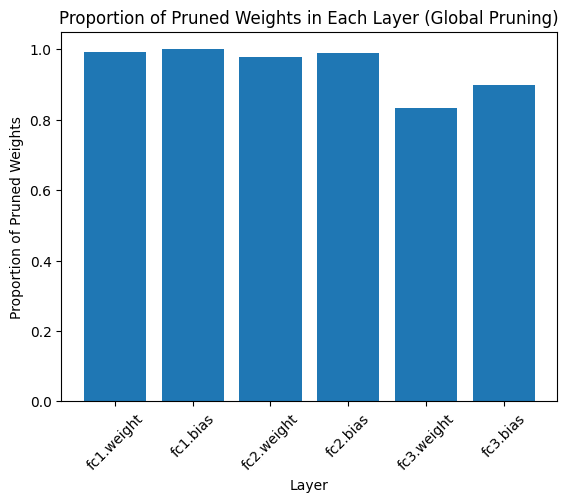

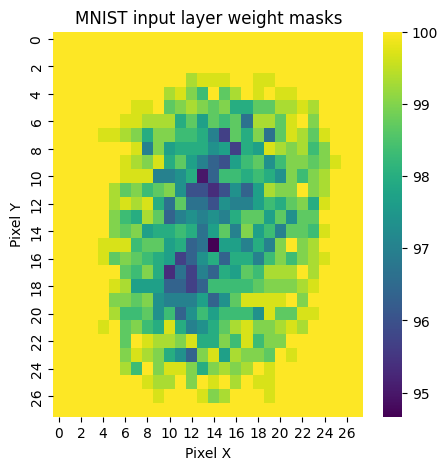

Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99% pruning: 94.86%
Total weights: 266610
Zero weights: 263943
Percentage of pruned weights: 99.00%
All accuracies so far: [0.971, 0.97325, 0.9590833333333333, 0.9485833333333333]

Pruning 99.5% of the weights
pruned_proportions=[0.99640731292517, 1.0, 0.9876333333333334, 1.0, 0.882, 1.0]


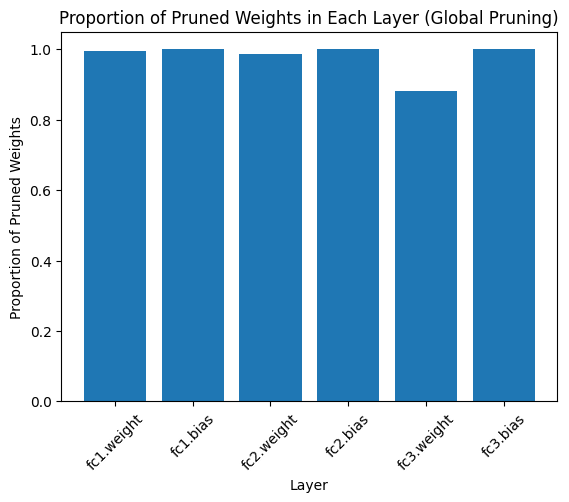

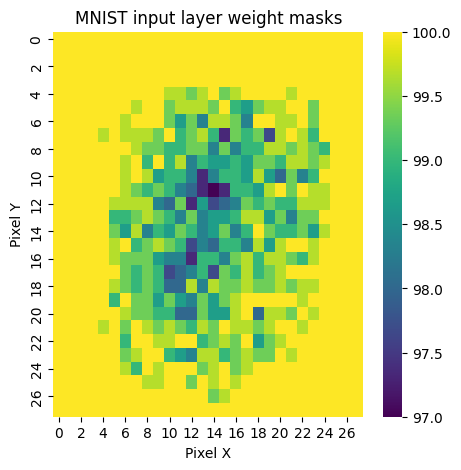

Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.5% pruning: 91.66%
Total weights: 266610
Zero weights: 265276
Percentage of pruned weights: 99.50%
All accuracies so far: [0.971, 0.97325, 0.9590833333333333, 0.9485833333333333, 0.9165833333333333]

Pruning 99.8% of the weights
pruned_proportions=[0.9988265306122449, 1.0, 0.9937666666666667, 1.0, 0.929, 1.0]


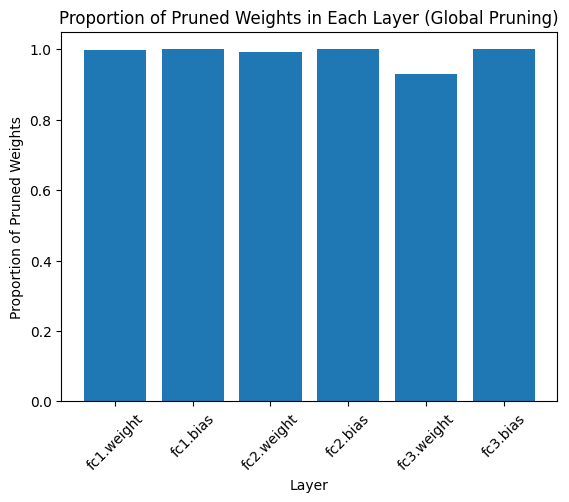

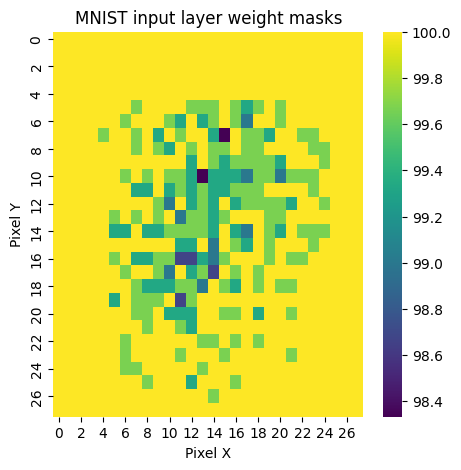

Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.8% pruning: 76.46%
Total weights: 266610
Zero weights: 266076
Percentage of pruned weights: 99.80%
All accuracies so far: [0.971, 0.97325, 0.9590833333333333, 0.9485833333333333, 0.9165833333333333, 0.7645833333333333]

Pruning 99.9% of the weights
pruned_proportions=[0.9995068027210884, 1.0, 0.9966, 1.0, 0.951, 1.0]


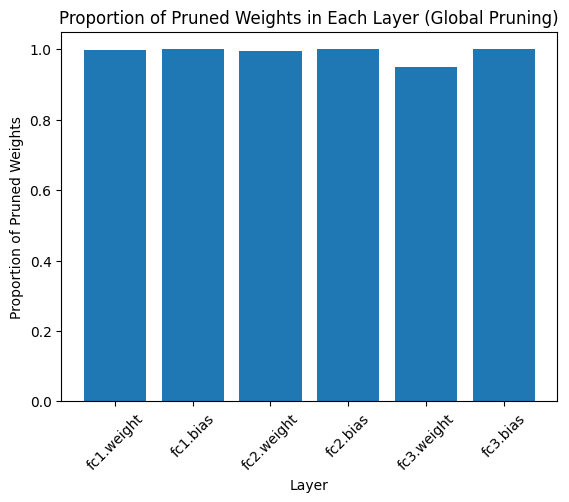

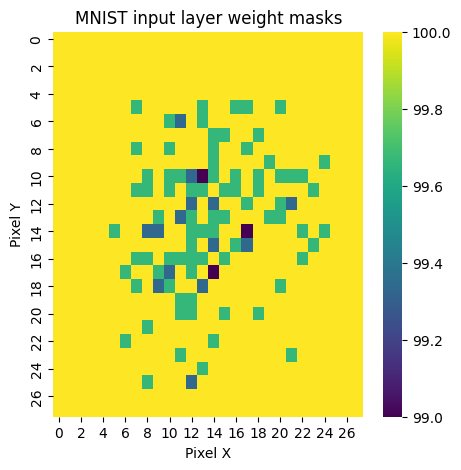

Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 11/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 11/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 12/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 12/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 13/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 13/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 14/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 14/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 15/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 15/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.9% pruning: 51.03%
Total weights: 266610
Zero weights: 266343
Percentage of pruned weights: 99.90%
All accuracies so far: [0.971, 0.97325, 0.9590833333333333, 0.9485833333333333, 0.9165833333333333, 0.7645833333333333, 0.5103333333333333]

Pruning 99.93% of the weights
pruned_proportions=[0.999655612244898, 1.0, 0.9976333333333334, 1.0, 0.965, 1.0]


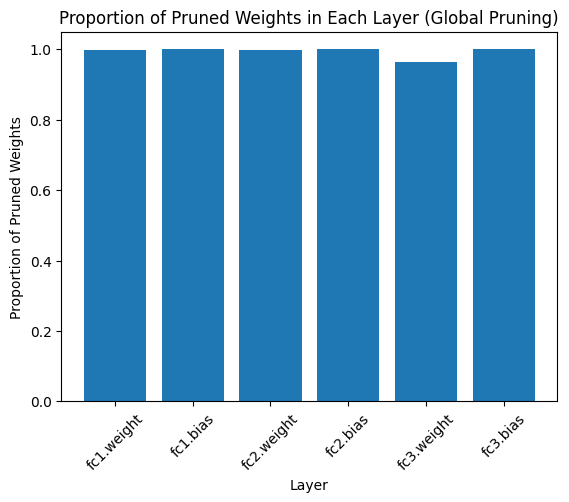

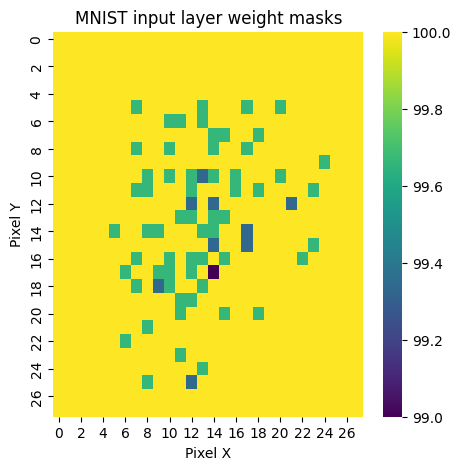

Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.93% pruning: 45.84%
Total weights: 266610
Zero weights: 266423
Percentage of pruned weights: 99.93%
All accuracies so far: [0.971, 0.97325, 0.9590833333333333, 0.9485833333333333, 0.9165833333333333, 0.7645833333333333, 0.5103333333333333, 0.45841666666666664]

Pruning 99.95% of the weights
pruned_proportions=[0.9997534013605442, 1.0, 0.9982666666666666, 1.0, 0.976, 1.0]


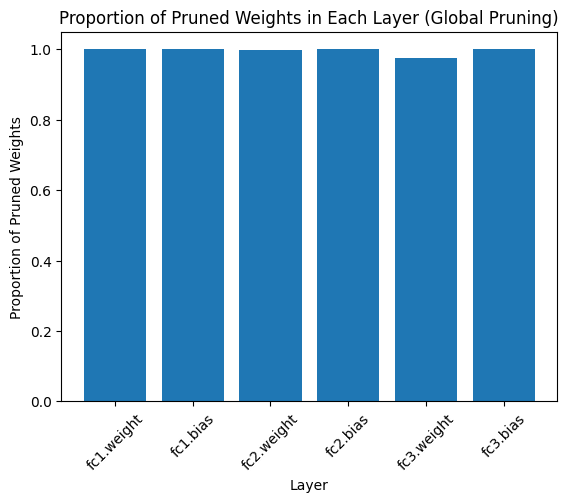

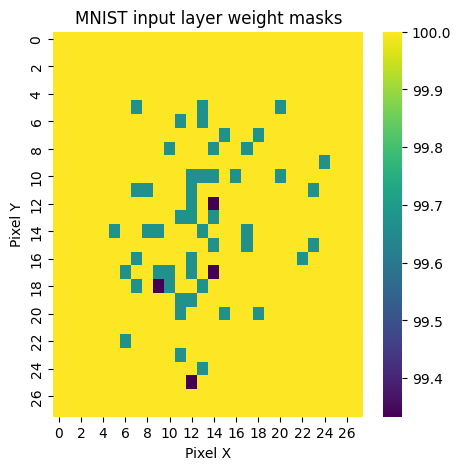

Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.95% pruning: 31.49%
Total weights: 266610
Zero weights: 266476
Percentage of pruned weights: 99.95%
All accuracies so far: [0.971, 0.97325, 0.9590833333333333, 0.9485833333333333, 0.9165833333333333, 0.7645833333333333, 0.5103333333333333, 0.45841666666666664, 0.3149166666666667]

Pruning 99.98% of the weights
pruned_proportions=[0.9999192176870748, 1.0, 0.9993, 1.0, 0.986, 1.0]


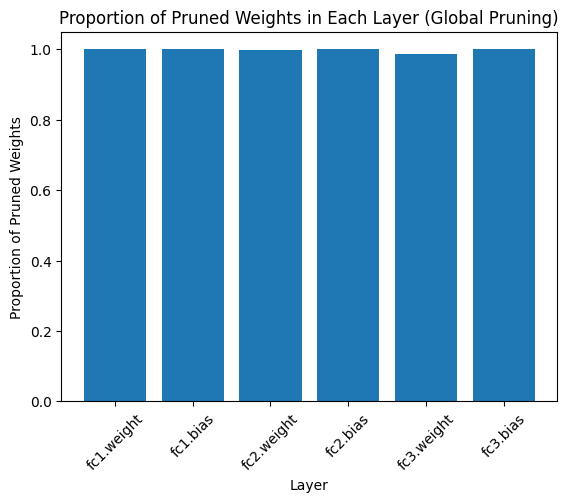

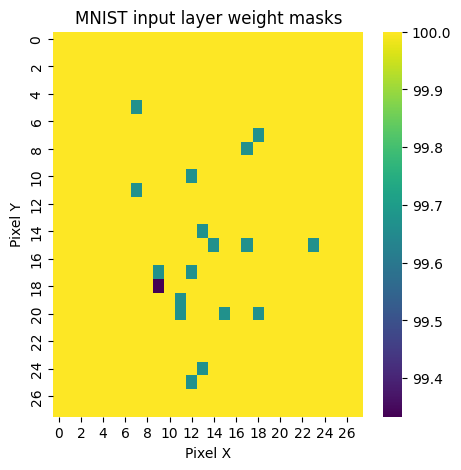

Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.98% pruning: 13.55%
Total weights: 266610
Zero weights: 266556
Percentage of pruned weights: 99.98%
All accuracies so far: [0.971, 0.97325, 0.9590833333333333, 0.9485833333333333, 0.9165833333333333, 0.7645833333333333, 0.5103333333333333, 0.45841666666666664, 0.3149166666666667, 0.1355]

Pruning 99.99% of the weights
pruned_proportions=[0.9999702380952381, 1.0, 0.9997333333333334, 1.0, 0.988, 1.0]


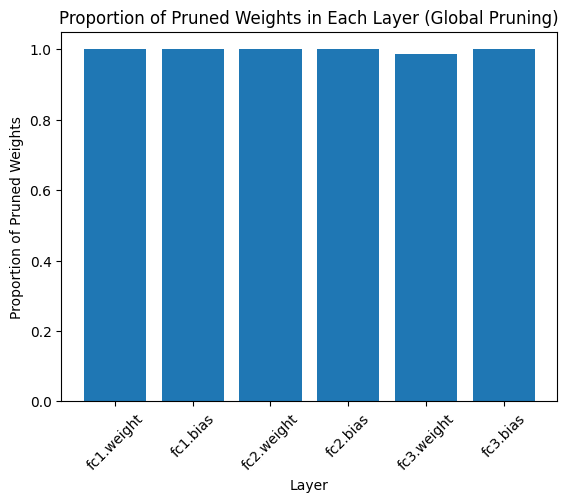

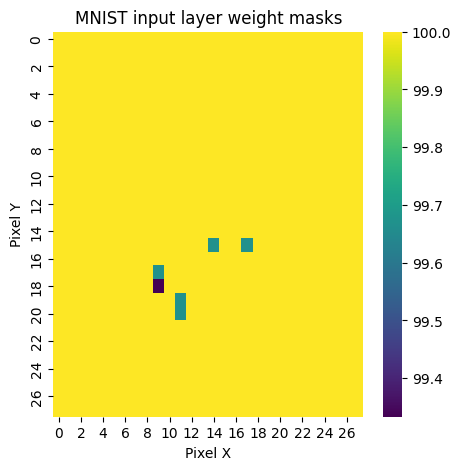

Model reinitialized


Epoch 1/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/15 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/15 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Retrained Accuracy after 99.99% pruning: 9.98%
Total weights: 266610
Zero weights: 266583
Percentage of pruned weights: 99.99%
All accuracies so far: [0.971, 0.97325, 0.9590833333333333, 0.9485833333333333, 0.9165833333333333, 0.7645833333333333, 0.5103333333333333, 0.45841666666666664, 0.3149166666666667, 0.1355, 0.09983333333333333]


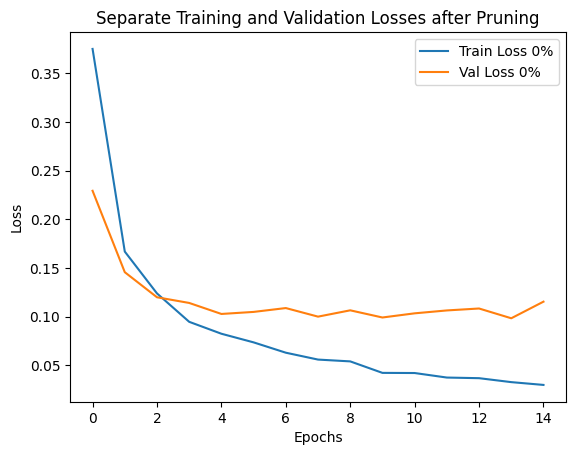

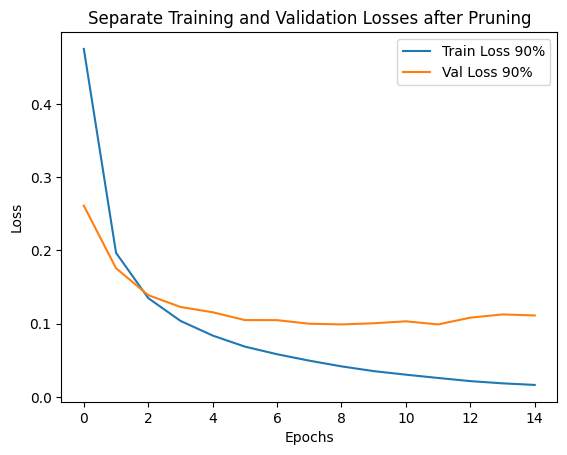

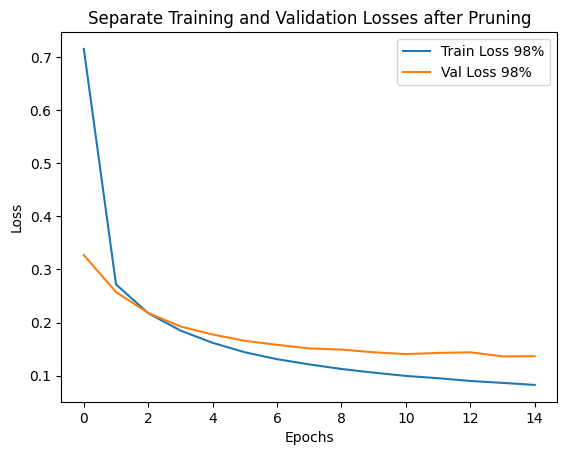

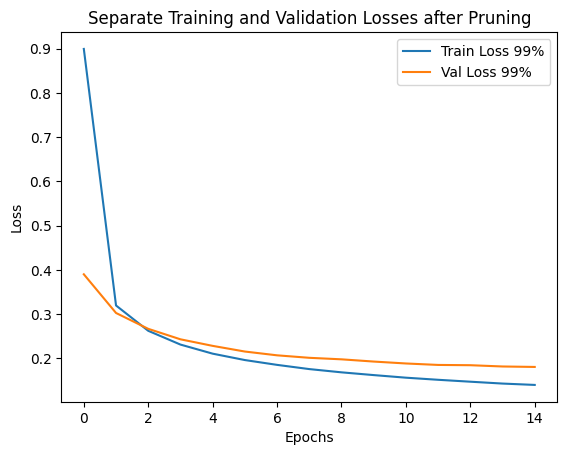

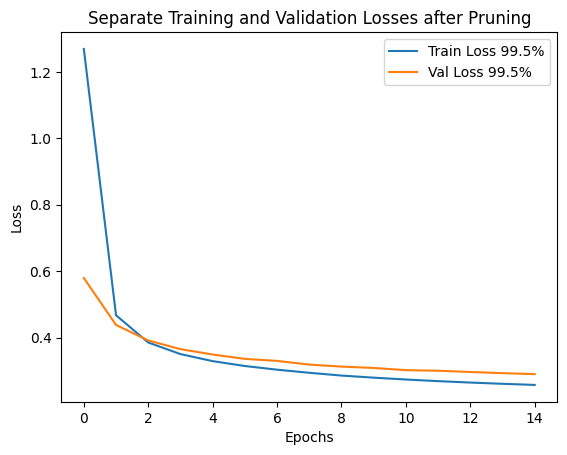

...

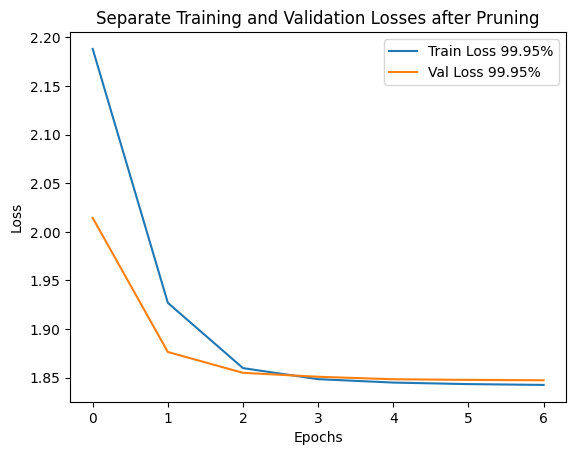

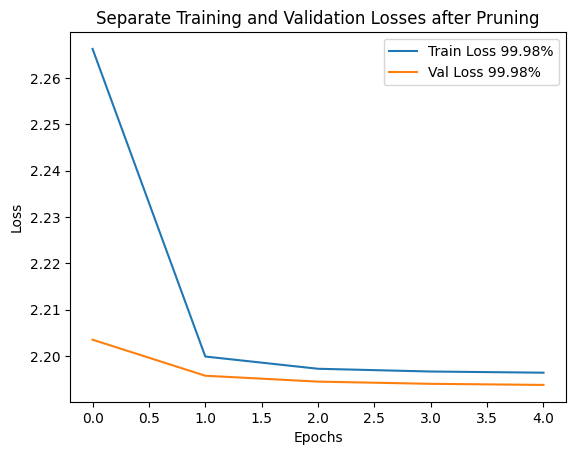

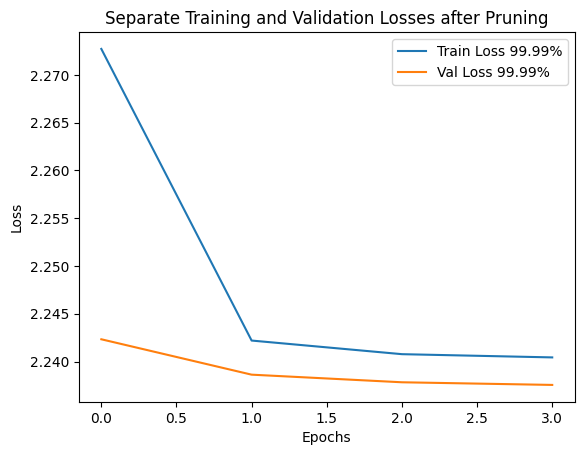

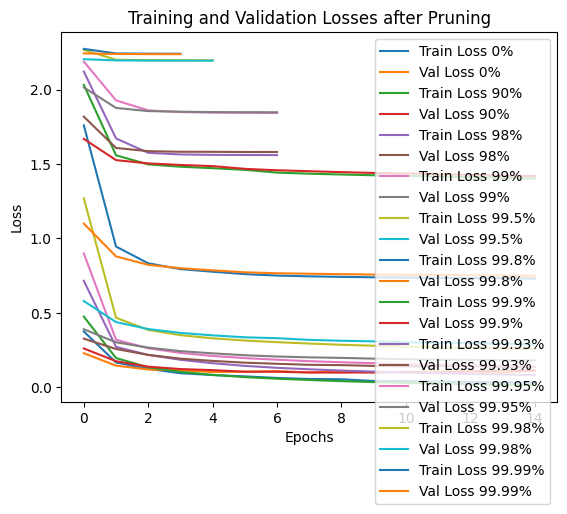

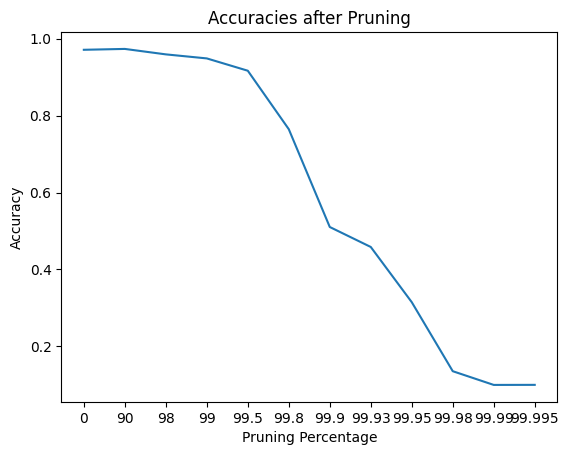

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
pruning_percentages = [0,90,98,99,99.5,99.8,99.9, 99.93, 99.95, 99.98, 99.99, 99.995]
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    if all_accuracies[-1] >= 0.11:
        print(f"\nPruning {percent}% of the weights")

        # Prune the current model
        masks = prune_by_percentage_global(current_model, percent)

        print_and_plot_unpruned_proportions_by_layer(current_model,masks)
        visualize_MNIST_layer_weights(current_model, masks)

        # Initialize a new model and retrain with masks
        new_model = MLP().to(device)
        optimizer = optim.Adam(new_model.parameters(), lr=0.001)
        # compare_models(new_model,current_model, masks, initial_state)
        retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15, rerandomize_initialization=True)

        # Evaluate the retrained model
        retrained_accuracy = evaluate(retrained_model, val_loader)
        print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
        verify_pruned_model(retrained_model)

        # Save results
        all_train_losses.append(retrain_train_losses)
        all_val_losses.append(retrain_val_losses)
        all_accuracies.append(retrained_accuracy)
        print(f"All accuracies so far: {all_accuracies}")

        # Prepare for the next iteration
        current_model = retrained_model

while len(all_accuracies) < len(pruning_percentages):
    all_accuracies.append(0.1)

# Plot the training and validation losses for each iteration
for i in range(len(all_train_losses)):
    plt.plot(all_train_losses[i], label=f'Train Loss {pruning_percentages[i]}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {pruning_percentages[i]}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i in range(len(all_train_losses)):
    percent = pruning_percentages[i]
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

## Repeating experiments with test data, network visualizations, and better pruning-by-layer visualizations.
1. Low mag, same init global
2. Low mag, reinit global
3. Low mag, same init
4. Low mag, reinit  
5. Random prune (same or reinit?)

### Final Plot

### Experiments

Epoch 1/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

All predictions ever: [tensor(0), tensor(1), tensor(2), tensor(3), tensor(4), tensor(5), tensor(6), tensor(7), tensor(8), tensor(9)]
Initial Accuracy: 97.04%
Total weights: 266610
Zero weights: 0
Percentage of pruned weights: 0.00%

Pruning 90% of the weights
unpruned_proportions=[0.09671343537414966, 0.0, 0.1185, 0.15, 0.342, 0.2]


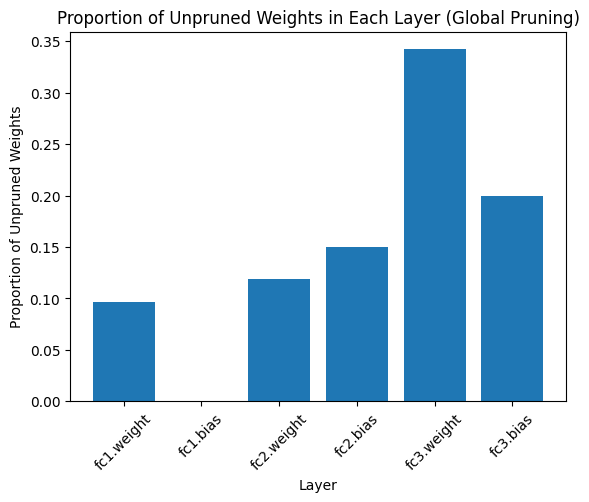

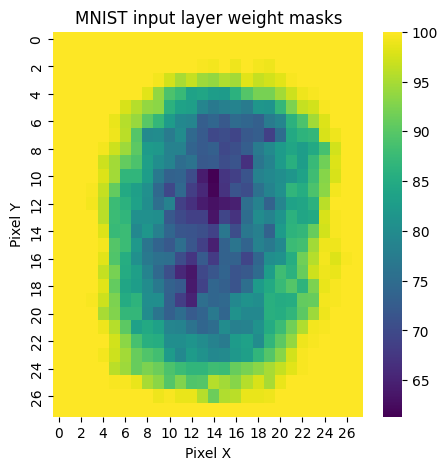

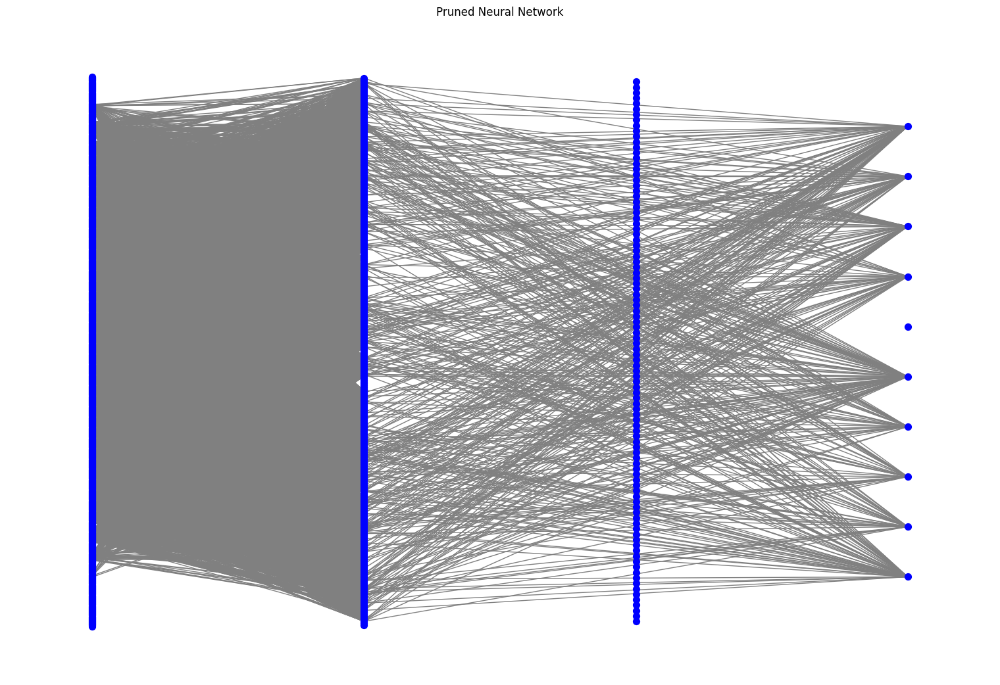

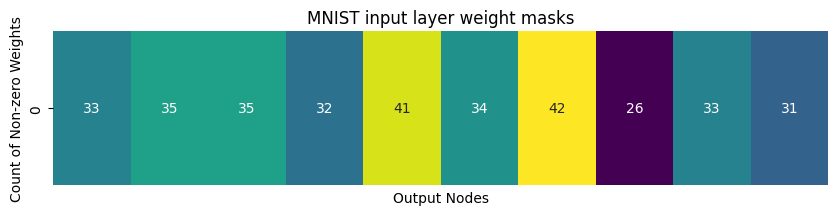

Initial state loaded


Epoch 1/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

All predictions ever: [tensor(0), tensor(1), tensor(2), tensor(3), tensor(4), tensor(5), tensor(6), tensor(7), tensor(8), tensor(9)]
Retrained Accuracy after 90% pruning: 97.93%
Total weights: 266610
Zero weights: 239949
Percentage of pruned weights: 90.00%
All accuracies so far: [0.9704, 0.9793]

Pruning 98% of the weights
unpruned_proportions=[0.016641156462585033, 0.0, 0.0385, 0.06, 0.257, 0.1]


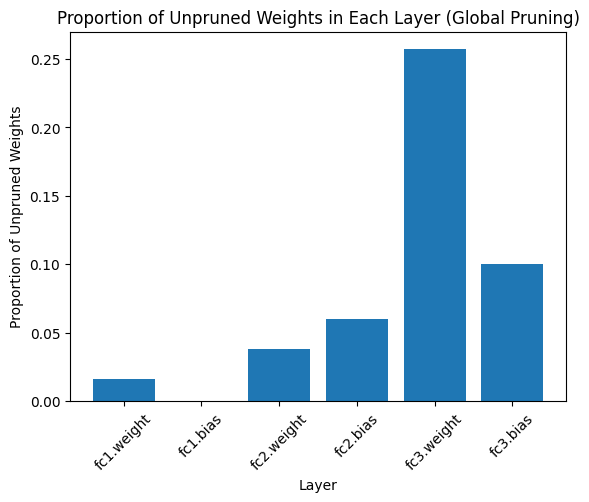

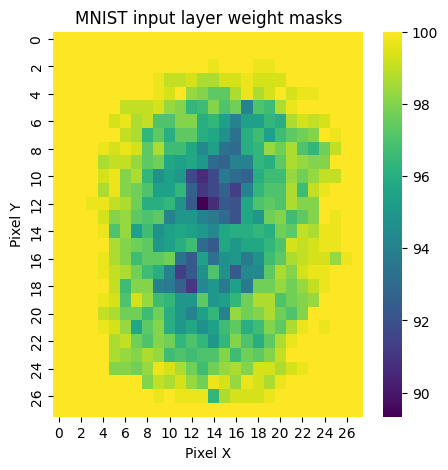

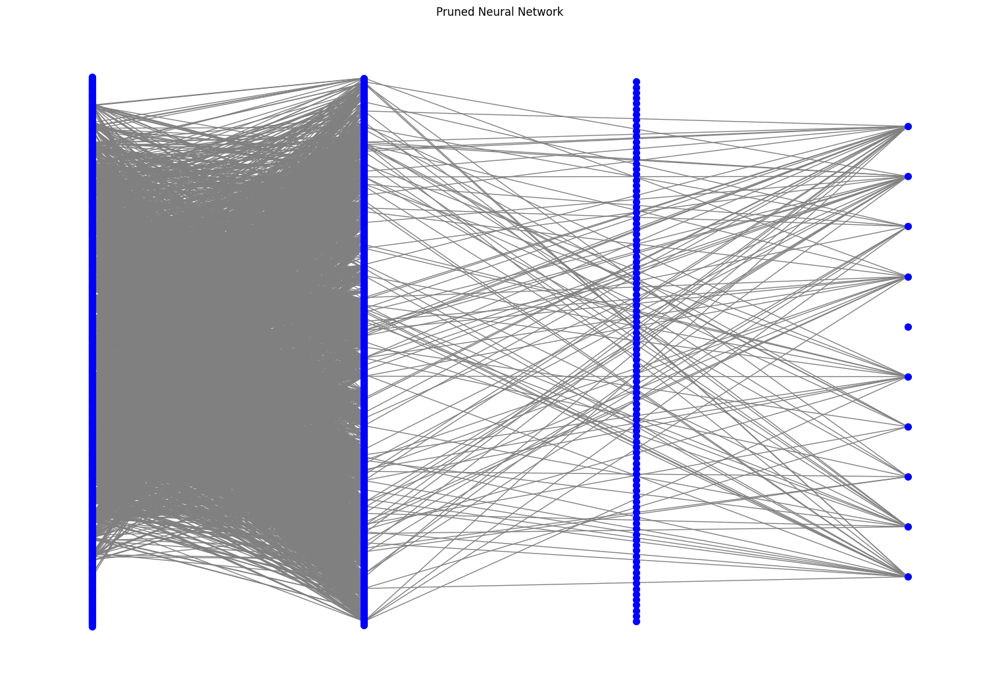

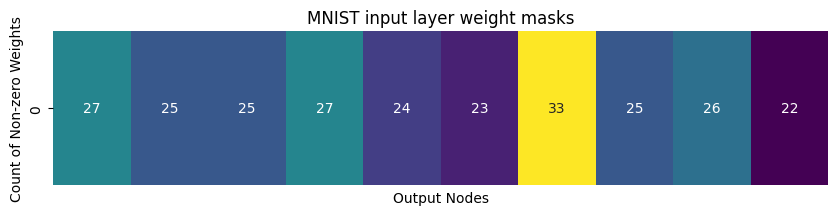

Initial state loaded


Epoch 1/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

All predictions ever: [tensor(0), tensor(1), tensor(2), tensor(3), tensor(4), tensor(5), tensor(6), tensor(7), tensor(8), tensor(9)]
Retrained Accuracy after 98% pruning: 97.33%
Total weights: 266610
Zero weights: 261277
Percentage of pruned weights: 98.00%
All accuracies so far: [0.9704, 0.9793, 0.9733]

Pruning 99% of the weights
unpruned_proportions=[0.007181122448979592, 0.0, 0.0245, 0.05, 0.237, 0.1]


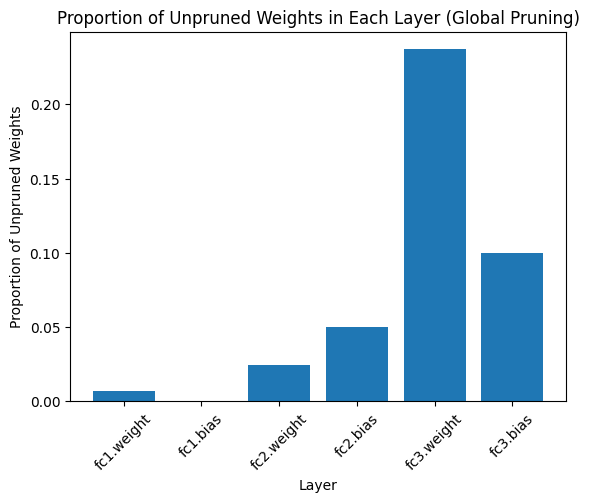

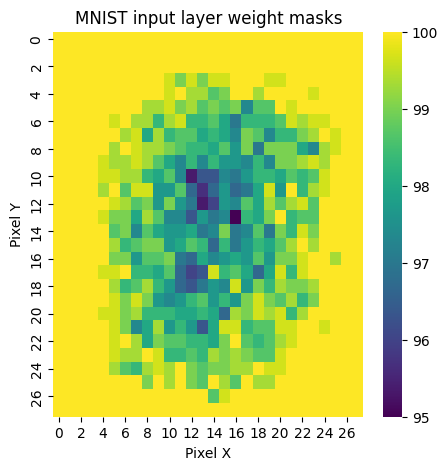

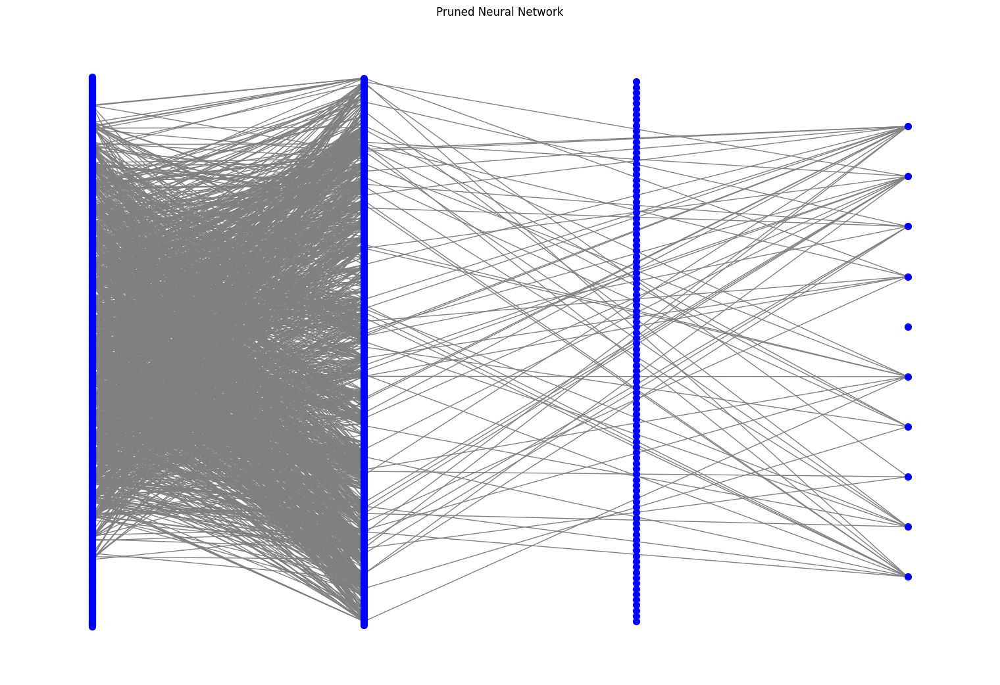

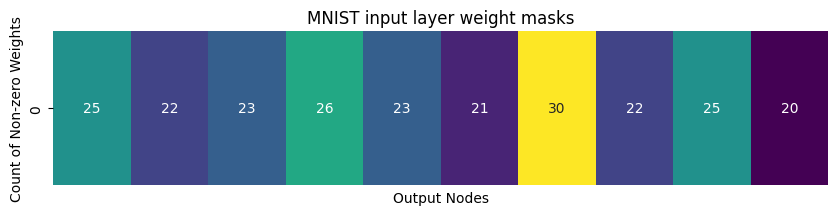

Initial state loaded


Epoch 1/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

All predictions ever: [tensor(0), tensor(1), tensor(2), tensor(3), tensor(4), tensor(5), tensor(6), tensor(7), tensor(8), tensor(9)]
Retrained Accuracy after 99% pruning: 96.99%
Total weights: 266610
Zero weights: 263943
Percentage of pruned weights: 99.00%
All accuracies so far: [0.9704, 0.9793, 0.9733, 0.9699]

Pruning 99.5% of the weights
unpruned_proportions=[0.002899659863945578, 0.0, 0.0154, 0.0, 0.19, 0.0]


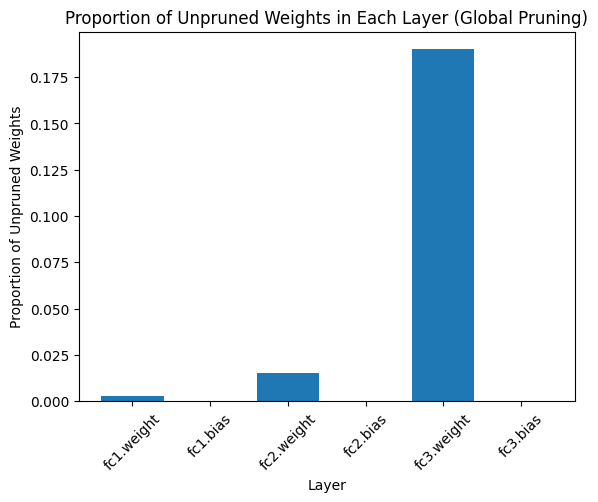

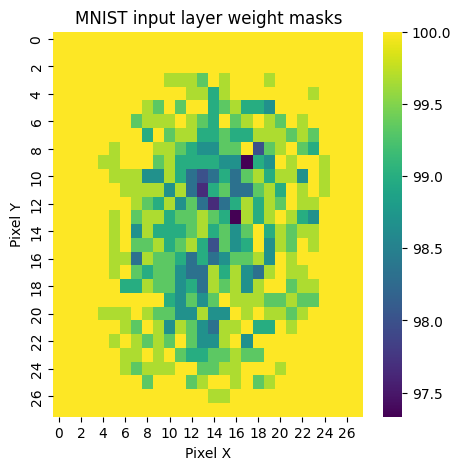

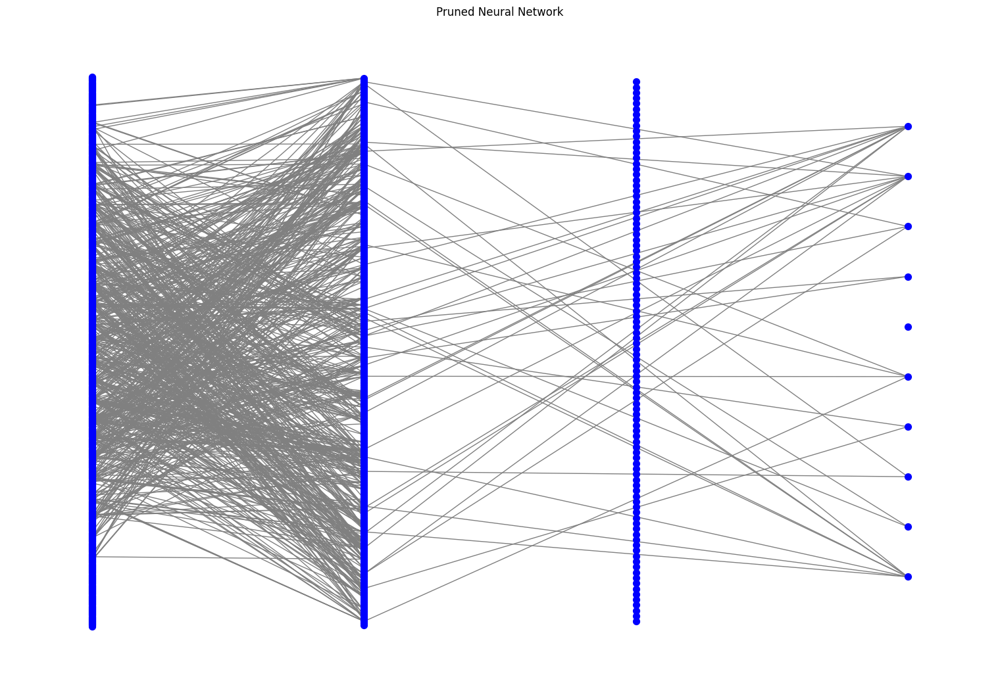

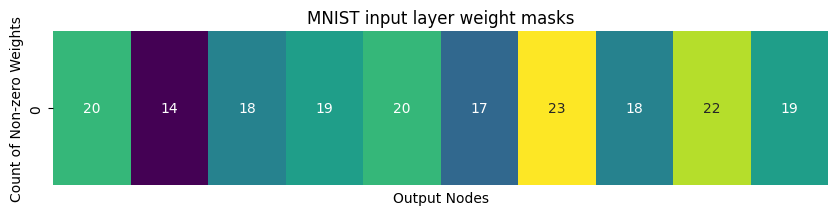

Initial state loaded


Epoch 1/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 4/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 5/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 5/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 6/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 6/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 7/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 7/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 8/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 8/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 9/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 9/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 10/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 10/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

All predictions ever: [tensor(0), tensor(1), tensor(2), tensor(3), tensor(4), tensor(5), tensor(6), tensor(7), tensor(8), tensor(9)]
Retrained Accuracy after 99.5% pruning: 94.89%
Total weights: 266610
Zero weights: 265276
Percentage of pruned weights: 99.50%
All accuracies so far: [0.9704, 0.9793, 0.9733, 0.9699, 0.9489]

Pruning 99.8% of the weights
unpruned_proportions=[0.0008886054421768707, 0.0, 0.0067666666666666665, 0.0, 0.122, 0.0]


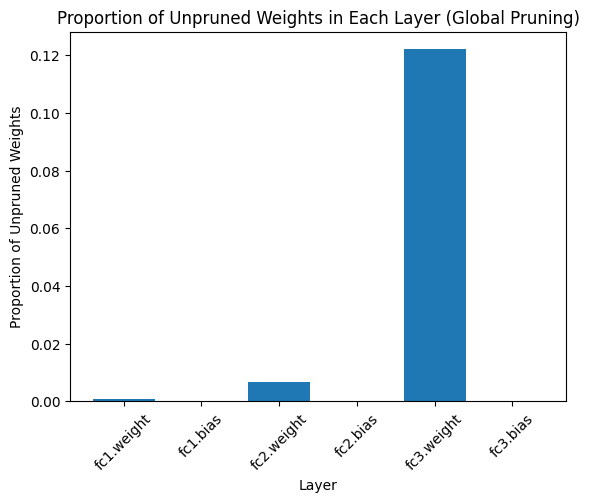

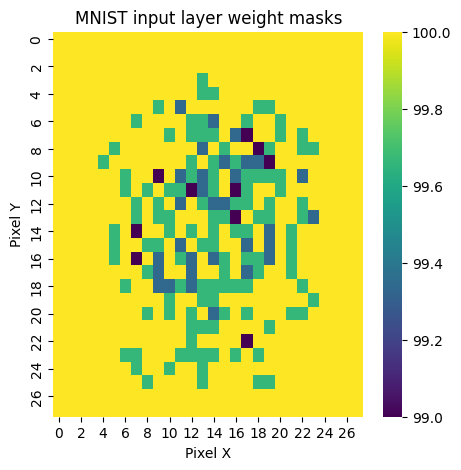

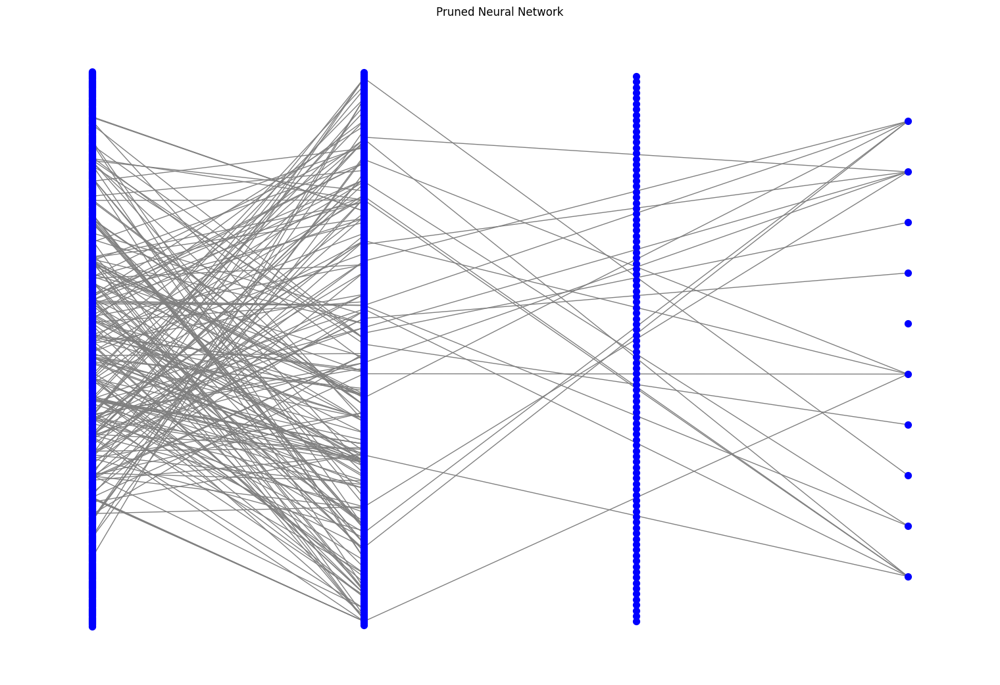

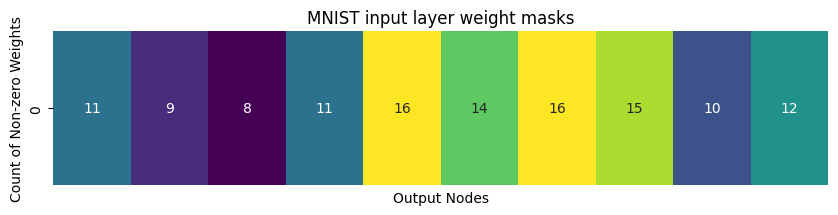

Initial state loaded


Epoch 1/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 1/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 2/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 2/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 3/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

Epoch 3/10 - Val:   0%|          | 0/188 [00:00<?, ?batch/s]

Epoch 4/10 - Train:   0%|          | 0/750 [00:00<?, ?batch/s]

In [ ]:
# full_run(pruning_function=prune_by_percentage_global, criterion = nn.CrossEntropyLoss(),lr=0.001,epochs=3,pruning_percentages = [0,90,99.5,99.995])
full_run()

In [ ]:
full_run(reinit=True)

In [ ]:
full_run(pruning_function=prune_by_percentage)

In [ ]:
full_run(pruning_function=prune_by_percentage,reinit=True)

In [ ]:
full_run(pruning_function=prune_randomly)

# Code

In [ ]:
import torch as t
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import datasets,transforms
import numpy as np
import copy
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import seaborn as sns
import networkx as nx

In [ ]:
class MLP(nn.Module):
  def __init__(self):
    super(MLP,self).__init__()
    self.fc1 = nn.Linear(28*28,300)
    self.fc2 = nn.Linear(300,100)
    self.fc3 = nn.Linear(100,10)

  def forward(self,x):
    x = x.view(-1,28*28)
    x = t.relu(self.fc1(x))
    x = t.relu(self.fc2(x))
    x = self.fc3(x)
    return x

In [ ]:
device = t.device("cuda" if t.cuda.is_available() else "cpu")

transform = transforms.Compose([transforms.ToTensor(),transforms.Normalize((0.5,),(0.5,))])
dataset = datasets.MNIST(root="./data",train=True,download=True,transform=transform)

train_len = int(0.8*len(dataset))
val_len = len(dataset) - train_len

train_set,val_set = random_split(dataset,[train_len,val_len])

train_loader = DataLoader(train_set,shuffle=True,batch_size=64)
val_loader = DataLoader(val_set,shuffle=False,batch_size=64)

test_set = datasets.MNIST(root="./data", train=False, download=True, transform=transform)

# Create DataLoader for the test set
test_loader = DataLoader(test_set, shuffle=False, batch_size=64)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:00<00:00, 11971536.95it/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 1785950.93it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:00<00:00, 14449589.44it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 6996154.52it/s]


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [ ]:
def train(model, criterion, optimizer, train_loader, val_loader, epochs=5):
    model.train()
    train_losses = []
    val_losses = []

    for epoch in range(epochs):
        running_train_loss = 0.0
        running_val_loss = 0.0

        # Training phase
        model.train()
        with tqdm(total=len(train_loader), desc=f"Epoch {epoch+1}/{epochs} - Train", unit="batch", leave=False) as pbar:
            for images, labels in train_loader:
                images, labels = images.to(device), labels.to(device)
                optimizer.zero_grad()
                outputs = model(images)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()
                running_train_loss += loss.item()
                pbar.set_postfix({"Train Loss": f"{running_train_loss / (pbar.n + 1):.4f}"})
                pbar.update(1)
        epoch_train_loss = running_train_loss / len(train_loader)
        train_losses.append(epoch_train_loss)

        # Validation phase
        model.eval()
        with tqdm(total=len(val_loader), desc=f"Epoch {epoch+1}/{epochs} - Val", unit="batch", leave=False) as pbar:
            with t.no_grad():
                for images, labels in val_loader:
                    images, labels = images.to(device), labels.to(device)
                    outputs = model(images)
                    loss = criterion(outputs, labels)
                    running_val_loss += loss.item()
                    pbar.set_postfix({"Val Loss": f"{running_val_loss / (pbar.n + 1):.4f}"})
                    pbar.update(1)
        epoch_val_loss = running_val_loss / len(val_loader)
        val_losses.append(epoch_val_loss)

    return model, train_losses, val_losses


In [ ]:
def prune_by_percentage(model,percentage):
  masks = {}
  for name,param in model.named_parameters():
    if "weight" in name:
      abs_param = np.abs(param.detach().cpu().numpy())
      threshold = np.percentile(abs_param,percentage)
      mask = (t.abs(param)>threshold).float().to(device)
      masks[name] = mask
      # param.data.mul_(mask)
  return masks

In [ ]:
def prune_randomly(model, percentage):
    masks = {}
    for name, param in model.named_parameters():
        if 'weight' in name:
            # Create a random mask
            num_elements = param.numel()
            num_prune = int(num_elements * (percentage / 100))
            mask = t.ones(num_elements, device=param.device)
            indices_to_prune = np.random.choice(num_elements, num_prune, replace=False)
            mask[indices_to_prune] = 0
            mask = mask.view(param.shape)
            masks[name] = mask
            # param.data.mul_(mask)
    return masks

In [ ]:
def prune_by_percentage_global(model, percentage):
    all_weights = []

    # Collect all weights in a single list
    for param in model.parameters():
        if param.requires_grad:
            all_weights.extend(param.data.cpu().numpy().flatten())

    # Determine the global threshold
    threshold = np.percentile(np.abs(all_weights), percentage)

    masks = {}
    # Create masks based on the global threshold
    for name, param in model.named_parameters():
        if param.requires_grad:
            mask = (np.abs(param.data) > threshold).float().to(param.device)
            masks[name] = mask
            # param.data.mul_(mask)

    return masks

In [ ]:
def prune_randomly_global(model, percentage):
    # Collect all weights in a single list
    all_weights = []
    for param in model.parameters():
        if param.requires_grad:
            all_weights.extend(param.data.cpu().numpy().flatten())

    # Determine the number of weights to prune
    num_elements = len(all_weights)
    num_prune = int(num_elements * (percentage / 100))

    # Create a random mask
    mask = np.ones(num_elements)
    indices_to_prune = np.random.choice(num_elements, num_prune, replace=False)
    mask[indices_to_prune] = 0

    # Apply the mask to the model's parameters
    current_index = 0
    masks = {}
    for name, param in model.named_parameters():
        if param.requires_grad:
            param_mask = mask[current_index:current_index + param.numel()].reshape(param.shape)
            param_mask = t.tensor(param_mask, dtype=t.float32).to(param.device)
            masks[name] = param_mask
            # param.data.mul_(param_mask)
            current_index += param.numel()

    return masks


In [ ]:
def retrain_with_masks(model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=5, rerandomize_initialization=False):
    # Load the initial state of the model
    if not rerandomize_initialization:
      model.load_state_dict(initial_state)
      print("Initial state loaded")

    if rerandomize_initialization:
      # model = MLP().to(device)
      # lr = vars(optimizer)['defaults']['lr']
      # optimizer = optim.Adam(model.parameters(),lr=lr)
      print("Model reinitialized")

    # Apply the masks to the parameters
    for name, param in model.named_parameters():
        if name in masks:
            param.data.mul_(masks[name])

    # model, train_losses, val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs)

    # return model, train_losses, val_losses

    train_losses = []
    val_losses = []

    # Training loop with loss tracking
    for epoch in range(epochs):
        running_train_loss = 0.0
        running_val_loss = 0.0

        # Training phase
        model.train()
        with tqdm(total=len(train_loader), desc=f"Epoch {epoch+1}/{epochs} - Train", unit="batch", leave=False) as pbar:
            for images, labels in train_loader:
                images, labels = images.to(device), labels.to(device)
                optimizer.zero_grad()
                outputs = model(images)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                # Re-apply masks to keep the pruned parameters zeroed out
                with t.no_grad():
                    for name, param in model.named_parameters():
                        if name in masks:
                            param.data.mul_(masks[name])

                running_train_loss += loss.item()
                pbar.set_postfix({"Train Loss": f"{running_train_loss / (pbar.n + 1):.4f}"})
                pbar.update(1)
        epoch_train_loss = running_train_loss / len(train_loader)
        train_losses.append(epoch_train_loss)

        # Validation phase
        model.eval()
        with tqdm(total=len(val_loader), desc=f"Epoch {epoch+1}/{epochs} - Val", unit="batch", leave=False) as pbar:
            with t.no_grad():
                for images, labels in val_loader:
                    images, labels = images.to(device), labels.to(device)
                    outputs = model(images)
                    loss = criterion(outputs, labels)
                    running_val_loss += loss.item()
                    pbar.set_postfix({"Val Loss": f"{running_val_loss / (pbar.n + 1):.4f}"})
                    pbar.update(1)
        epoch_val_loss = running_val_loss / len(val_loader)
        val_losses.append(epoch_val_loss)

        if epoch > 2:
            if train_losses[-1] > 0.995*train_losses[-2] and train_losses[-2] > 0.995*train_losses[-3]:
                break

    return model, train_losses, val_losses

In [ ]:
def evaluate(model,dataloader):
  model.eval()
  correct = 0.0
  total = 0.0

  all_predictions_ever = []

  with t.no_grad():
    for images,labels in dataloader:
      images,labels = images.to(device),labels.to(device)
      outputs = model(images)
      _,predictions = t.max(outputs,dim=-1)
      for prediction in predictions:
        if prediction not in all_predictions_ever:
          all_predictions_ever.append(prediction)
      total += labels.size(0)
      correct += (predictions == labels).sum().item()
    accuracy = correct / total

  sorted_all_predictions_ever = sorted(all_predictions_ever)
  print(f"All predictions ever: {sorted_all_predictions_ever}")

  return accuracy

In [ ]:
def verify_pruned_model(model):
    total_weights = 0
    zero_weights = 0
    for param in model.parameters():
        total_weights += param.numel()
        zero_weights += t.sum(param == 0).item()

    zero_percentage = (zero_weights / total_weights) * 100
    print(f'Total weights: {total_weights}')
    print(f'Zero weights: {zero_weights}')
    print(f'Percentage of pruned weights: {zero_percentage:.2f}%')

    return zero_percentage

In [ ]:
def compare_models(model1,model2, masks, initial_state,tolerance=1e-5):
    model1.load_state_dict(initial_state)
    for name, param in model1.named_parameters():
        if name in masks:
            param.data.mul_(masks[name])

    model2.load_state_dict(initial_state)
    for name, param in model2.named_parameters():
        if name in masks:
            param.data.mul_(masks[name])

    if type(model1) != type(model2):
        print("Models have different architectures.")
        return False

    # Check if both models have the same number of parameters
    model1_params = list(model1.parameters())
    model2_params = list(model2.parameters())

    if len(model1_params) != len(model2_params):
        print("Models have different numbers of parameters.")
        return False

    # Compare parameters
    for param1, param2 in zip(model1_params, model2_params):
        if not t.allclose(param1, param2, atol=tolerance):
            print("Models differ in parameters.")
            return False

    print("Models are approximately the same.")

In [ ]:
def calculate_unpruned_proportions_by_layer(model,masks):
    unpruned_proportions = []

    for name, param in model.named_parameters():
        if name in masks:
            # print(name)
            total_weights = param.numel()
            unpruned_weights = (masks[name] == 1).sum().item()
            unpruned_proportion = unpruned_weights / total_weights
            unpruned_proportions.append(unpruned_proportion)

    return unpruned_proportions

In [ ]:
def print_and_plot_unpruned_proportions_by_layer(model,masks):
    unpruned_proportions = calculate_unpruned_proportions_by_layer(model,masks)
    print(f"unpruned_proportions={unpruned_proportions}")
    layer_names = [name for name, _ in model.named_parameters()]
    plt.bar(layer_names, unpruned_proportions)
    plt.xlabel('Layer')
    plt.ylabel('Proportion of Unpruned Weights')
    plt.title('Proportion of Unpruned Weights in Each Layer (Global Pruning)')
    plt.xticks(rotation=45)
    plt.show()

In [ ]:
def visualize_MNIST_layer_weights(model, masks, title="MNIST input layer weight masks",layer=1):
    # Assuming the input layer weights are stored in fc1
    weights = model.fc1.weight.data
    mask = masks[f'fc{layer}.weight']

    # Calculate the percentage of masked weights for each pixel
    masked_weights = mask.cpu().numpy()

    if layer == 1:
        percentage_masked = (masked_weights == 0).sum(axis=0).reshape(28, 28) / masked_weights.shape[0] * 100

        plt.figure(figsize=(5, 5))
        sns.heatmap(percentage_masked, cmap="viridis", annot=False, fmt=".1f")
        plt.title(title)
        plt.xlabel("Pixel X")
        plt.ylabel("Pixel Y")
        plt.show()

    if layer == 3:
        # Count the number of non-zero weights entering each output node
        non_zero_weights_count = (masked_weights != 0).sum(axis=1)

        plt.figure(figsize=(10, 2))
        sns.heatmap(non_zero_weights_count.reshape(1, -1), cmap="viridis", annot=True, cbar=False, xticklabels=False)
        plt.title(title)
        plt.xlabel("Output Nodes")
        plt.ylabel("Count of Non-zero Weights")
        plt.show()

In [ ]:
def visualize_pruned_network(masks, input_shape=(28, 28), hidden_layers=[300, 100], output_size=10, title="Pruned Neural Network"):
    # Create the graph
    G = nx.Graph()

    # Input layer nodes
    input_nodes = [(0, i, j) for i in range(input_shape[0]) for j in range(input_shape[1])]
    G.add_nodes_from(input_nodes, layer=0)

    # Hidden layer nodes
    hidden_layer_nodes = []
    for layer_idx, layer_size in enumerate(hidden_layers):
        layer_nodes = [(layer_idx + 1, i) for i in range(layer_size)]
        hidden_layer_nodes.append(layer_nodes)
        G.add_nodes_from(layer_nodes, layer=layer_idx + 1)

    # Output layer nodes
    output_nodes = [(len(hidden_layers) + 1, i) for i in range(output_size)]
    G.add_nodes_from(output_nodes, layer=len(hidden_layers) + 1)

    # Add edges according to the masks
    prev_layer_nodes = input_nodes
    for layer_idx, (layer_nodes, (layer_name, mask)) in enumerate(zip(hidden_layer_nodes + [output_nodes], masks.items())):
        if 'bias' in layer_name:
            continue  # Skip bias layers
        flat_mask = mask.flatten()
        prev_layer_size = len(prev_layer_nodes)
        for prev_node_idx, prev_node in enumerate(prev_layer_nodes):
            for curr_node_idx, curr_node in enumerate(layer_nodes):
                if flat_mask[curr_node_idx * prev_layer_size + prev_node_idx] != 0:
                    G.add_edge(prev_node, curr_node)
        prev_layer_nodes = layer_nodes

    # Position nodes using a custom layout
    pos = {}
    layer_sizes = [input_shape[0] * input_shape[1]] + hidden_layers + [output_size]
    for layer_idx, layer_nodes in enumerate([input_nodes] + hidden_layer_nodes + [output_nodes]):
        x_pos = layer_idx
        y_pos_increment = 1 / (len(layer_nodes) + 1)
        for node_idx, node in enumerate(layer_nodes):
            y_pos = (node_idx + 1) * y_pos_increment
            pos[node] = (x_pos, y_pos)

    # Draw the network
    plt.figure(figsize=(15, 10))
    nx.draw(G, pos, with_labels=False, node_size=50, node_color='blue', edge_color='gray')
    plt.title(title)
    plt.show()

In [ ]:
def full_run(pruning_function=prune_by_percentage_global,reinit=False,criterion = nn.CrossEntropyLoss(),lr=0.001,epochs=10,pruning_percentages = [0,90,98,99,99.5,99.8,99.9, 99.93, 99.95, 99.98, 99.99, 99.995]):
    # Initial training and evaluation
    model = MLP().to(device)

    optimizer = optim.Adam(model.parameters(), lr=lr)
    initial_state = copy.deepcopy(model.state_dict())

    trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=epochs)
    initial_accuracy = evaluate(trained_model, test_loader)
    print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
    verify_pruned_model(trained_model)

    # Pruning and retraining iteratively
    current_model = trained_model

    all_train_losses = [initial_train_losses]
    all_val_losses = [initial_val_losses]
    all_accuracies = [initial_accuracy]

    # all_accuracies.append(.105666666667) # Used for initial testing, to skip all the pruning steps

    for percent in pruning_percentages[1:]:
        if all_accuracies[-1] >= 0.11:
            print(f"\nPruning {percent}% of the weights")

            # Prune the current model
            masks = pruning_function(current_model, percent)

            if pruning_function == prune_by_percentage_global:
                print_and_plot_unpruned_proportions_by_layer(current_model,masks)

            visualize_MNIST_layer_weights(current_model, masks)
            visualize_pruned_network(masks)
            visualize_MNIST_layer_weights(current_model, masks,layer=3)

            # Initialize a new model and retrain with masks
            new_model = MLP().to(device)
            optimizer = optim.Adam(new_model.parameters(), lr=lr)
            # compare_models(new_model,current_model, masks, initial_state)
            retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=epochs, rerandomize_initialization=reinit)

            # Evaluate the retrained model
            retrained_accuracy = evaluate(retrained_model, test_loader)
            print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
            verify_pruned_model(retrained_model)

            # Save results
            all_train_losses.append(retrain_train_losses)
            all_val_losses.append(retrain_val_losses)
            all_accuracies.append(retrained_accuracy)
            print(f"All accuracies so far: {all_accuracies}")


            # Prepare for the next iteration
            current_model = retrained_model

    while len(all_accuracies) < len(pruning_percentages):
        all_accuracies.append(0.1)

    print(f"all_accuracies = {all_accuracies}")

    # Plot the training and validation losses for each iteration
    for i in range(len(all_train_losses)):
        plt.plot(all_train_losses[i], label=f'Train Loss {pruning_percentages[i]}%')
        plt.plot(all_val_losses[i], label=f'Val Loss {pruning_percentages[i]}%')

        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title('Separate Training and Validation Losses after Pruning')
        plt.legend()
        plt.show()

    # Plot the training and validation losses for each iteration
    for i in range(len(all_train_losses)):
        percent = pruning_percentages[i]
        plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
        plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

    pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
    plt.plot(pruning_percentages_as_strs,all_accuracies)
    plt.xlabel('Pruning Percentage')
    plt.ylabel('Accuracy')
    plt.title('Accuracies after Pruning')
    plt.show()

# Experiment Template

In [ ]:
# Initial training and evaluation
model = MLP().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
initial_state = copy.deepcopy(model.state_dict())

trained_model, initial_train_losses, initial_val_losses = train(model, criterion, optimizer, train_loader, val_loader, epochs=15)
initial_accuracy = evaluate(trained_model, val_loader)
print(f'Initial Accuracy: {initial_accuracy * 100:.2f}%')
verify_pruned_model(trained_model)

# Pruning and retraining iteratively
pruning_percentages = [0,90,98,99,99.5,99.8,99.9]
current_model = trained_model

all_train_losses = [initial_train_losses]
all_val_losses = [initial_val_losses]
all_accuracies = [initial_accuracy]

for percent in pruning_percentages[1:]:
    print(f"\nPruning {percent}% of the weights")

    # Prune the current model
    masks = prune_by_percentage_global(current_model, percent)

    # Initialize a new model and retrain with masks
    new_model = MLP().to(device)
    optimizer = optim.Adam(new_model.parameters(), lr=0.001)
    # compare_models(new_model,current_model, masks, initial_state)
    retrained_model, retrain_train_losses, retrain_val_losses = retrain_with_masks(new_model, masks, initial_state, criterion, optimizer, train_loader, val_loader, epochs=15)

    # Evaluate the retrained model
    retrained_accuracy = evaluate(retrained_model, val_loader)
    print(f'Retrained Accuracy after {percent}% pruning: {retrained_accuracy * 100:.2f}%')
    verify_pruned_model(retrained_model)

    # Save results
    all_train_losses.append(retrain_train_losses)
    all_val_losses.append(retrain_val_losses)
    all_accuracies.append(retrained_accuracy)
    print(f"All accuracies so far: {all_accuracies}")

    # Prepare for the next iteration
    current_model = retrained_model

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Separate Training and Validation Losses after Pruning')
    plt.legend()
    plt.show()

# Plot the training and validation losses for each iteration
for i, percent in enumerate(pruning_percentages):
    plt.plot(all_train_losses[i], label=f'Train Loss {percent}%')
    plt.plot(all_val_losses[i], label=f'Val Loss {percent}%')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses after Pruning')
plt.legend()
plt.show()

pruning_percentages_as_strs = [str(perc) for perc in pruning_percentages]
plt.plot(pruning_percentages_as_strs,all_accuracies)
plt.xlabel('Pruning Percentage')
plt.ylabel('Accuracy')
plt.title('Accuracies after Pruning')
plt.show()

# Counting lines of code

In [ ]:
import json

def count_code_lines(notebook_path):
    with open(notebook_path, 'r') as f:
        notebook = json.load(f)

    code_lines = 0
    for cell in notebook['cells']:
        if cell['cell_type'] == 'code':
            code_lines += len(cell['source'])

    return code_lines

# Mount Google Drive to access the notebook file
from google.colab import drive
# drive.mount('/content/drive')

# Replace 'path_to_your_notebook.ipynb' with the actual path to your notebook in Google Drive
notebook_path = '/content/drive/My Drive/Colab Notebooks/Lottery Ticket Hypothesis Reimplementation'

total_lines = count_code_lines(notebook_path)
print(f'Total lines of code: {total_lines}')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Total lines of code: 1553
